<center>

![](https://drive.google.com/uc?export=view&id=1R6EAVE0Ysym-UNtZR-Ze_HcqQLDmH0bd)
<p>
College: Engineering and Information Technology <br>
Department: Information Technology <br>


Machine Learning - DAT405 <br>



**Lung X-Ray Image Classification for Enhanced Diagnosis** <br>
-

**Prepared by :**
- 202111148 - Asmaa Luai Abdulla
- 202110929 - Lujain Adnan Thouqan

**Supervised by:**

 **Dr . Mahmoud AlShboul**

Academic semester: Fall 2024 - 2025 <br>

<br>
</p></center>
</p></center>

# **abstract**

In this project, we address the task of lung X-ray image classification, using a dataset with nine distinct categories. We employed three deep learning models, namely MobileNetV2, VGG16, and DenseNet-121, to classify the images. Each model was fine-tuned using a pre-trained version on ImageNet, with the goal of leveraging transfer learning to improve classification performance. The models were evaluated based on their accuracy, loss, and confusion matrices. After fine-tuning, DenseNet-121 achieved the highest accuracy, followed by VGG16 and MobileNetV2. The performance improvements through fine-tuning were evident in all models, particularly in the handling of diverse lung conditions such as inflammatory processes, obstructive pulmonary diseases, and encapsulated lesions. This work demonstrates the effectiveness of transfer learning in medical image classification, providing insights into which models are best suited for complex image classification tasks in the healthcare domain.

# **Introduction**

The early and accurate detection of lung diseases is crucial in clinical practice to ensure timely medical interventions. In this project, we aim to leverage deep learning techniques to build a robust image classification model that can diagnose lung conditions using chest X-ray images. The model will focus on distinguishing between 9 categories of lung diseases, supporting advancements in computer-aided diagnostics.





### **Dataset Description**

The **Lung X-Ray Dataset** is a synthetically augmented collection of chest X-ray images, classified into **9 categories** based on the most relevant characteristics. These categories include:  
1. **Normal**  
2. **Inflammatory Processes** (e.g., pneumonia)  
3. **Higher Density** (e.g., pleural effusion, atelectasis, empyema)  
4. **Lower Density** (e.g., pneumothorax, pneumomediastinum)  
5. **Obstructive Pulmonary Diseases** (e.g., emphysema, bronchiectasis)  
6. **Degenerative Infectious Diseases** (e.g., tuberculosis, sarcoidosis, fibrosis)  
7. **Encapsulated Lesions** (e.g., abscesses, nodules, tumors)  
8. **Mediastinal Changes** (e.g., pericarditis, lymph node enlargement)  
9. **Chest Changes** (e.g., malformations, hypoplasia).  

The dataset is anonymized, ensuring no patient information is exposed, and has been verified by radiologists. It is provided for academic and research purposes, offering a valuable resource for exploring lung disease detection and classification tasks. The augmentation process ensures balanced classes and increased variability, improving model robustness.

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# **Loading the data**

The contents of the zip file will be extracted to the /content/extracted_files directory.

In [ ]:
!unzip '/content/drive/MyDrive/archive (96).zip' -d '/content/extracted_files'

This code visualizes the dataset by displaying one random image from each of the 9 classes in a 3x3 grid, using mapped English labels for clarity. It begins by defining the dataset's path and listing the class folders, which represent the categories. Complex class names in Portuguese are simplified to English using a mapping dictionary. A loop iterates through each class folder, counts the total images, selects a random image, and preprocesses it by resizing to \(224 \times 224\) and normalizing pixel values. Each image is displayed with its corresponding label in a subplot grid, removing axes for better visualization. Finally, the total number of images and classes is printed for dataset insights.

# **Reading images**

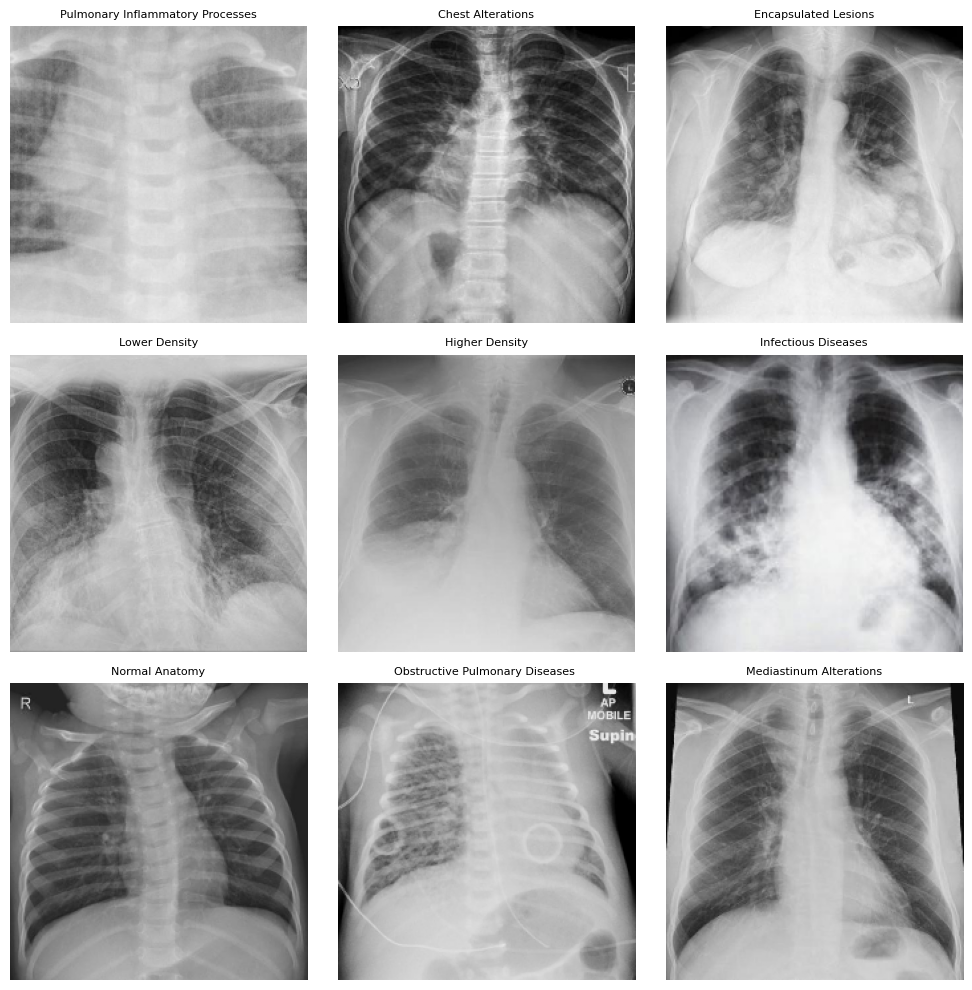

Total number of images: 6743
Total number of labels (classes): 9


In [ ]:
import matplotlib.pyplot as plt
import os
from tensorflow.keras.preprocessing import image
import random

# Path to the extracted directory containing class folders
train_dir = "/content/extracted_files"

# List all class folders (9 folders, one for each class)
class_folders = os.listdir(train_dir)

# Mapping of the original labels to simpler English labels
label_mapping = {
    '05 Doenças Infecciosas Degenerativas (Tuberculose, Sarcoidose, Proteinose, Fibrose)': 'Infectious Diseases',
    '00 Anatomia Normal': 'Normal Anatomy',
    '03 Menor Densidade (Pneumotorax, Pneumomediastino, Pneumoperitonio)': 'Lower Density',
    '08 Alterações do Tórax (Atelectasias, Malformações, Agenesia, Hipoplasias)': 'Chest Alterations',
    '01 Processos Inflamatórios Pulmonares (Pneumonia)': 'Pulmonary Inflammatory Processes',
    '07 Alterações de Mediastino (Pericardite, Malformações Arteriovenosas, Linfonodomegalias)': 'Mediastinum Alterations',
    '04 Doenças Pulmonares Obstrutivas (Enfisema, Broncopneumonia, Bronquiectasia, Embolia)': 'Obstructive Pulmonary Diseases ',
    '02 Maior Densidade (Derrame Pleural, Consolidação Atelectasica, Hidrotorax, Empiema)': 'Higher Density',
    '06 Lesões Encapsuladas (Abscessos, Nódulos, Cistos, Massas Tumorais, Metastases)': 'Encapsulated Lesions'
}

# Initialize counters for total images and total labels
total_images = 0
total_labels = len(class_folders)  # This is the number of classes (folders)

# Set up a plot to display one image from each class
plt.figure(figsize=(10, 10))

# Loop through each class folder and display one image
for idx, class_folder in enumerate(class_folders):
    class_folder_path = os.path.join(train_dir, class_folder)

    # List the images in the class folder
    images_in_class = os.listdir(class_folder_path)

    # Count the total images in the current class
    total_images += len(images_in_class)

    # Pick a random image from the class folder
    random_image = random.choice(images_in_class)

    # Create the full image path
    img_path = os.path.join(class_folder_path, random_image)

    # Load and preprocess the image
    img = image.load_img(img_path, target_size=(224, 224))  # Resize to (224, 224)
    img_array = image.img_to_array(img) / 255.0  # Normalize to [0, 1]

    # Get the simpler English label using the mapping
    short_title = label_mapping.get(class_folder, class_folder)  # Use the mapping if it exists

    # Display the image
    plt.subplot(3, 3, idx+1)  # Create a 3x3 grid for displaying images
    plt.imshow(img_array)
    plt.title(short_title, fontsize=8)  # Set a larger font size for readability
    plt.axis('off')  # Turn off axis for better visualization

# Show the plot
plt.tight_layout()
plt.show()

# Display the total number of images and labels
print(f"Total number of images: {total_images}")
print(f"Total number of labels (classes): {total_labels}")


# **EDA**

## **Dataset Overview**

### Class Distribution

This code counts the number of images in each class folder of the dataset and visualizes the distribution as a bar chart. It iterates over each class, counts valid image files, and maps the class labels to simpler English terms. The results are then displayed in a bar chart, showing the number of images per class.

Class: Pulmonary Inflammatory Processes, Number of images: 1060
Class: Chest Alterations, Number of images: 544
Class: Encapsulated Lesions, Number of images: 658
Class: Lower Density, Number of images: 629
Class: Higher Density, Number of images: 671
Class: Infectious Diseases, Number of images: 580
Class: Normal Anatomy, Number of images: 1340
Class: Obstructive Pulmonary Diseases , Number of images: 637
Class: Mediastinum Alterations, Number of images: 596


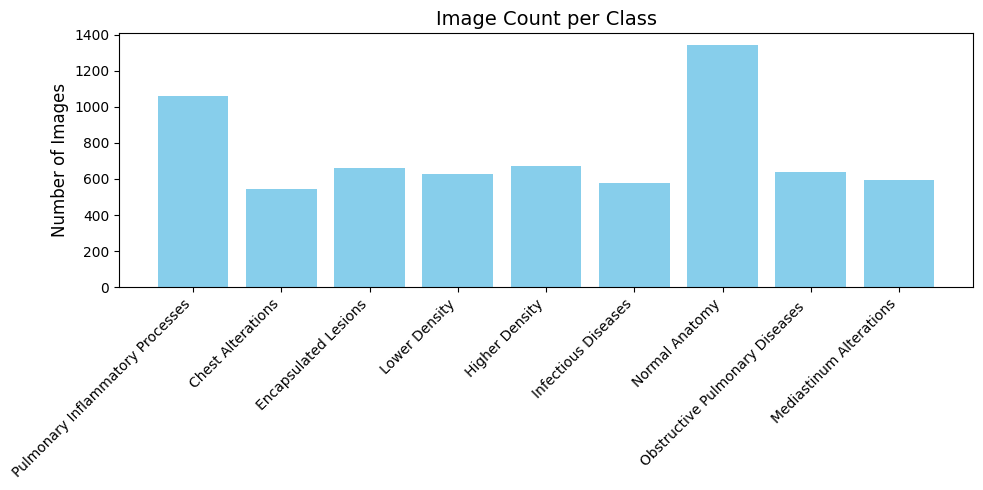

In [ ]:
import os
import matplotlib.pyplot as plt

# Path to the extracted directory containing class folders
train_dir = "/content/extracted_files"

# List all class folders
class_folders = os.listdir(train_dir)

# Dictionary to store the count of images in each class
class_image_count = {}

# List of valid image extensions
image_extensions = ['.jpg', '.jpeg', '.png', '.bmp', '.gif']

# Loop through each class folder
for class_folder in class_folders:
    class_folder_path = os.path.join(train_dir, class_folder)

    # Count the number of image files in the folder
    num_images = len([f for f in os.listdir(class_folder_path) if any(f.endswith(ext) for ext in image_extensions)])

    # Get the simplified English class name from the label mapping
    short_class_name = label_mapping.get(class_folder, class_folder)  # If not found, fall back to original

    # Add to dictionary
    class_image_count[short_class_name] = num_images

# Display the count of images for each class
for class_name, count in class_image_count.items():
    print(f"Class: {class_name}, Number of images: {count}")

# Visualize the counts as a bar chart
plt.figure(figsize=(10, 5))
plt.bar(class_image_count.keys(), class_image_count.values(), color='skyblue')
plt.xticks(rotation=45, ha='right', fontsize=10)
plt.ylabel("Number of Images", fontsize=12)
plt.title("Image Count per Class", fontsize=14)
plt.tight_layout()
plt.show()


The output shows the distribution of images across the 9 different classes in the dataset. Here's a brief explanation of each result:

**1.Normal Anatomy:** This class has the highest number of images (1,340). It represents healthy, normal lung anatomy and likely serves as the baseline category for comparison with the other conditions.

**2.Pulmonary Inflammatory Processes:** This class has 1,060 images, which suggests it's a common condition represented in the dataset, likely capturing various types of pneumonia and inflammation.

**3.Higher Density:** With 671 images, this category includes conditions like pleural effusion or atelectatic consolidation, where parts of the lung appear denser on an X-ray.

**4.Encapsulated Lesions:** This class, with 658 images, includes cases such as abscesses, nodules, and tumors.

**5.Lower Density:**With 629 images, this class includes conditions like pneumothorax (air in the pleural cavity) or pneumomediastinum (air in the mediastinum).

**6.Infectious Diseases:** There are 580 images in this category, covering conditions like tuberculosis and sarcoidosis, which involve infectious lung diseases.

**7.Obstructive Pulmonary Diseases:** This category has 637 images and includes conditions like emphysema and bronchopneumonia, where airflow is obstructed in the lungs.

**8.Mediastinum Alterations:** With 596 images, this class represents issues in the mediastinum, such as pericarditis and enlarged lymph nodes.

**9.Chest Alterations:**The class with the fewest images (544), representing conditions like atelectasis or congenital malformations.

The bar chart visualizes this distribution, showing that most images belong to the "Normal Anatomy" and "Pulmonary Inflammatory Processes" classes, while others like "Chest Alterations" have fewer images, suggesting a potential imbalance in the dataset.

### Proportion of Images per Class

Class: Pulmonary Inflammatory Processes, Number of images: 1060
Class: Chest Alterations, Number of images: 544
Class: Encapsulated Lesions, Number of images: 658
Class: Lower Density, Number of images: 629
Class: Higher Density, Number of images: 671
Class: Infectious Diseases, Number of images: 580
Class: Normal Anatomy, Number of images: 1340
Class: Obstructive Pulmonary Diseases , Number of images: 637
Class: Mediastinum Alterations, Number of images: 596


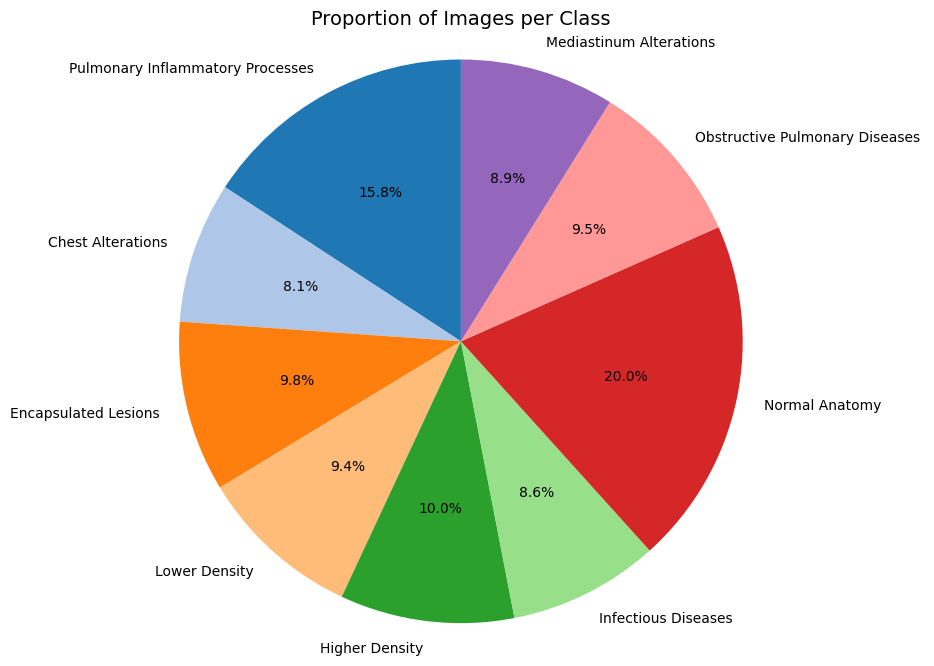

In [ ]:
import os
import matplotlib.pyplot as plt

# Path to the extracted directory containing class folders
train_dir = "/content/extracted_files"

# List all class folders
class_folders = os.listdir(train_dir)

# Dictionary to store the count of images in each class
class_image_count = {}

# List of valid image extensions
image_extensions = ['.jpg', '.jpeg', '.png', '.bmp', '.gif']

# Loop through each class folder
for class_folder in class_folders:
    class_folder_path = os.path.join(train_dir, class_folder)

    # Count the number of image files in the folder
    num_images = len([f for f in os.listdir(class_folder_path) if any(f.endswith(ext) for ext in image_extensions)])

    # Get the simplified English class name from the label mapping
    short_class_name = label_mapping.get(class_folder, class_folder)  # If not found, fall back to original

    # Add to dictionary
    class_image_count[short_class_name] = num_images

# Display the count of images for each class
for class_name, count in class_image_count.items():
    print(f"Class: {class_name}, Number of images: {count}")

# Pie chart visualization
plt.figure(figsize=(8, 8))
plt.pie(
    class_image_count.values(),
    labels=class_image_count.keys(),
    autopct='%1.1f%%',  # Display percentages
    startangle=90,  # Rotate the chart to start at the top
    colors=plt.cm.tab20.colors  # Use a colormap for colors
)
plt.title("Proportion of Images per Class", fontsize=14)
plt.axis('equal')  # Equal aspect ratio to ensure the pie is a circle
plt.show()


The dataset shows **a noticeable class imbalance**, with Normal Anatomy having the largest proportion of images **(20%)**, followed by Pulmonary Inflammatory Processes **(15.8%)**. These two classes make up a significant portion of the dataset. This could indicate that the dataset is slightly skewed towards more common or easily recognizable conditions like normal anatomy and inflammatory processes, which are more frequent in clinical settings.

Other classes, such as Chest Alterations **(8.1%)** and Mediastinum Alterations **(8.9%)**, have fewer images, suggesting they might be less common or harder to detect, leading to a lower number of available examples in the dataset. This imbalance can impact the performance of machine learning models, as they might learn to predict the dominant classes better than the minority ones.

To address this imbalance, techniques like data augmentation, oversampling the minority classes, or using class weights during model training might be applied to ensure the model performs well across all categories, rather than being biased toward the majority classes.

## **Image Characteristics**






### Color Channels

In [ ]:
import os
from PIL import Image

# Function to check the color mode of images in a directory (including subdirectories)
def check_image_colors(image_directory):
    # Initialize counters for different color modes
    color_modes = {
        'RGB': 0,
        'Grayscale': 0,
        'Other': 0
    }

    # Loop through all the subdirectories and files using os.walk
    for root, dirs, files in os.walk(image_directory):
        for filename in files:
            file_path = os.path.join(root, filename)

            # Check if it's an image based on the file extension
            if filename.lower().endswith(('.png', '.jpg', '.jpeg')):
                try:
                    # Open the image
                    img = Image.open(file_path)

                    # Get the color mode of the image
                    mode = img.mode

                    # Count the mode occurrences
                    if mode == 'RGB':
                        color_modes['RGB'] += 1
                    elif mode == 'L':  # 'L' is grayscale mode
                        color_modes['Grayscale'] += 1
                    else:
                        color_modes['Other'] += 1
                except Exception as e:
                    print(f"Error processing image {file_path}: {e}")

    # Print the count of each color mode
    print(f"RGB Images: {color_modes['RGB']}")
    print(f"Grayscale Images: {color_modes['Grayscale']}")
    print(f"Other Color Modes: {color_modes['Other']}")

# Example usage
image_directory = "/content/extracted_files"  # Replace with the path to your image directory
check_image_colors(image_directory)


RGB Images: 2633
Grayscale Images: 4096
Other Color Modes: 14


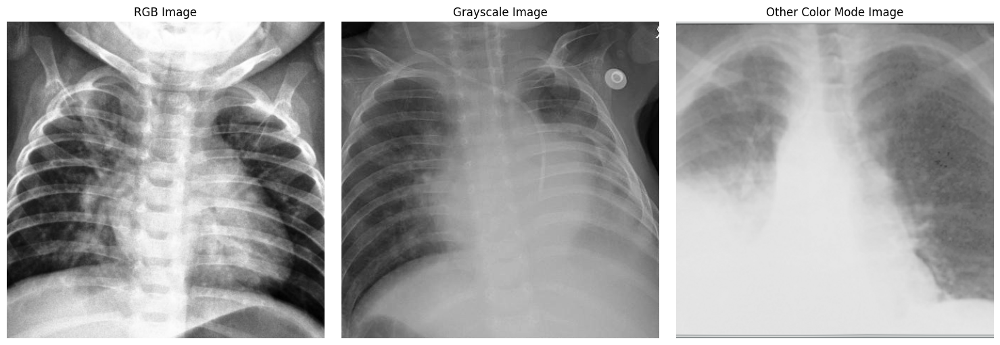

In [ ]:
import os
from PIL import Image
import matplotlib.pyplot as plt

# Function to check and display images based on color mode in a directory (including subdirectories)
def display_image_by_color_mode(image_directory):
    # Initialize lists to store paths of images for each color mode
    rgb_images = []
    grayscale_images = []
    other_images = []

    # Loop through all the subdirectories and files using os.walk
    for root, dirs, files in os.walk(image_directory):
        for filename in files:
            file_path = os.path.join(root, filename)

            # Check if it's an image based on the file extension
            if filename.lower().endswith(('.png', '.jpg', '.jpeg')):
                try:
                    # Open the image
                    img = Image.open(file_path)

                    # Get the color mode of the image
                    mode = img.mode

                    # Categorize based on mode
                    if mode == 'RGB':
                        rgb_images.append(file_path)
                    elif mode == 'L':  # 'L' is grayscale mode
                        grayscale_images.append(file_path)
                    else:
                        other_images.append(file_path)
                except Exception as e:
                    print(f"Error processing image {file_path}: {e}")

    # Display one image from each category
    fig, axes = plt.subplots(1, 3, figsize=(15, 5))

    if rgb_images:
        img = Image.open(rgb_images[0])
        axes[0].imshow(img)
        axes[0].set_title("RGB Image")
    else:
        axes[0].text(0.5, 0.5, "No RGB images", horizontalalignment='center', verticalalignment='center')

    if grayscale_images:
        img = Image.open(grayscale_images[0])
        axes[1].imshow(img, cmap='gray')
        axes[1].set_title("Grayscale Image")
    else:
        axes[1].text(0.5, 0.5, "No Grayscale images", horizontalalignment='center', verticalalignment='center')

    if other_images:
        img = Image.open(other_images[0])
        axes[2].imshow(img)
        axes[2].set_title("Other Color Mode Image")
    else:
        axes[2].text(0.5, 0.5, "No Other color mode images", horizontalalignment='center', verticalalignment='center')

    # Hide axes
    for ax in axes:
        ax.axis('off')

    plt.tight_layout()
    plt.show()

# Example usage
image_directory = "/content/extracted_files"  # Replace with the path to your image directory
display_image_by_color_mode(image_directory)


### Image Size Distribution

In this analysis, we examined the image sizes and aspect ratios in our dataset to understand their distribution and identify any anomalies. We began by iterating through all the images in the dataset, extracting their width, height, and aspect ratio. This information was then stored in a DataFrame for easy analysis.

We found that the most common image size in our dataset is **450x450 pixels**, with a corresponding aspect ratio of **1.00**, meaning most images are square. This suggests that the dataset is mostly composed of square-shaped images. However, we also identified **473 images** with unusual sizes that differ from the most common 450x450 dimensions. These images had varying widths and heights, such as **523x400** or **904x416**, which might require resizing or special handling during preprocessing.

To better visualize the distribution, we plotted a scatterplot showing the width and height of each image, with color-coding based on the aspect ratio. The plot revealed that while most images follow the common size, there is a range of aspect ratios present, highlighting some variety in image shapes.

This analysis gives us insight into the general structure of the dataset, and the identification of images with unusual sizes will help us decide whether further resizing or other preprocessing steps are necessary.

                                                Path  Width  Height  \
0  /content/extracted_files/01 Processos Inflamat...    450     450   
1  /content/extracted_files/01 Processos Inflamat...    450     450   
2  /content/extracted_files/01 Processos Inflamat...    450     450   
3  /content/extracted_files/01 Processos Inflamat...    450     450   
4  /content/extracted_files/01 Processos Inflamat...    450     450   

   Aspect Ratio  
0           1.0  
1           1.0  
2           1.0  
3           1.0  
4           1.0  

Most common size: (450, 450)
Most common aspect ratio: 1.00

Images with unusual sizes:
                                                   Path  Width  Height  \
57    /content/extracted_files/01 Processos Inflamat...    523     400   
73    /content/extracted_files/01 Processos Inflamat...    523     400   
98    /content/extracted_files/01 Processos Inflamat...    904     416   
148   /content/extracted_files/01 Processos Inflamat...    425     448   
186   

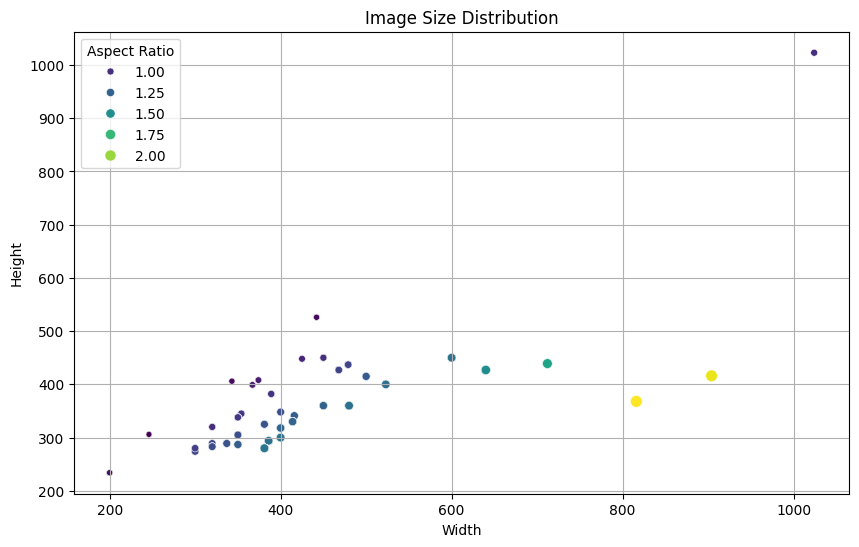

In [ ]:
import os
from PIL import Image
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Path to the directory containing images
image_dir = "/content/extracted_files"

# List of valid image extensions
image_extensions = ['.jpg', '.jpeg', '.png', '.bmp', '.gif']

# List to store image details
image_details = []

# Loop through each folder and image
for root, _, files in os.walk(image_dir):
    for file in files:
        if any(file.endswith(ext) for ext in image_extensions):
            image_path = os.path.join(root, file)
            try:
                with Image.open(image_path) as img:
                    width, height = img.size
                    image_details.append({"Path": image_path, "Width": width, "Height": height})
            except Exception as e:
                print(f"Error reading image {image_path}: {e}")

# Convert the list to a pandas DataFrame
df = pd.DataFrame(image_details)

# Add an aspect ratio column
df["Aspect Ratio"] = df["Width"] / df["Height"]

# Display the DataFrame
print(df.head())

# Summary: Get the most common size and aspect ratio
common_size = df.groupby(["Width", "Height"]).size().idxmax()
common_aspect_ratio = df["Aspect Ratio"].mode()[0]

print(f"\nMost common size: {common_size}")
print(f"Most common aspect ratio: {common_aspect_ratio:.2f}")

# Detect images that do not match the most common size
anomalies = df[(df["Width"] != common_size[0]) | (df["Height"] != common_size[1])]
if not anomalies.empty:
    print("\nImages with unusual sizes:")
    print(anomalies)
else:
    print("\nAll images have the same size.")

# Visualize the distribution of image sizes
plt.figure(figsize=(10, 6))
sns.scatterplot(data=df, x="Width", y="Height", hue="Aspect Ratio", palette="viridis", size="Aspect Ratio")
plt.title("Image Size Distribution")
plt.xlabel("Width")
plt.ylabel("Height")
plt.grid(True)
plt.show()


### Pixel Intensity Distribution

In this analysis, we focused on exploring the pixel intensity distribution across images in different classes of our dataset. We created histograms to visualize the variations in pixel intensities for randomly selected images from each class.

We began by iterating through the 9 classes in our dataset, selecting one image randomly from each class folder. Each selected image was then converted to grayscale, simplifying it to a single channel of pixel intensities ranging from 0 (black) to 255 (white). For each image, we generated a histogram that shows how frequently each intensity value occurs across the entire image.

The histograms revealed that different classes of images exhibited varying distributions of pixel intensities. For example, images from some classes, like "Normal Anatomy," might have a more uniform distribution, while others, such as "Pulmonary Inflammatory Processes," could show more variation in pixel intensity due to the presence of anomalies or varying conditions.

By visualizing these histograms, we gained insights into how the images differ in terms of pixel intensity across various lung conditions. This understanding could be useful for tasks like image preprocessing, where adjusting intensity levels or normalizing images might be necessary for more effective model training.

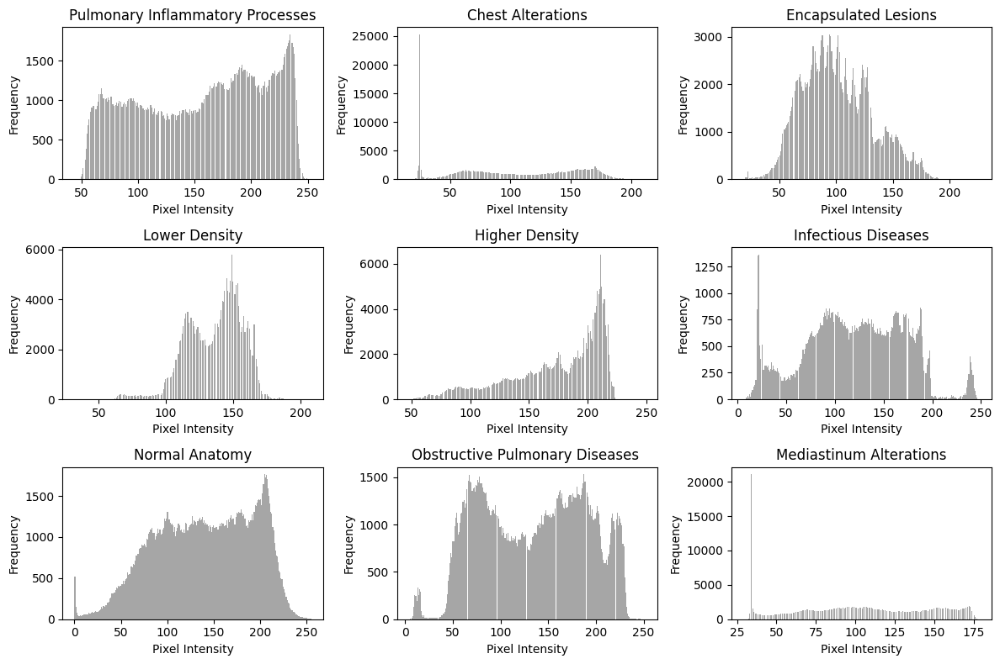

In [ ]:
import numpy as np
import os
import random
from PIL import Image
import matplotlib.pyplot as plt

def plot_histograms(dataset_dir, class_folders):
    plt.figure(figsize=(12, 8))
    for i, class_name in enumerate(class_folders):
        class_path = os.path.join(dataset_dir, class_name)
        img_files = os.listdir(class_path)
        img_path = os.path.join(class_path, random.choice(img_files))
        img = Image.open(img_path).convert('L')  # Convert to grayscale
        img_array = np.array(img)

        # Get the simplified English class name
        short_class_name = label_mapping.get(class_name, class_name)  # Default to original name if not found

        plt.subplot(3, 3, i+1)
        plt.hist(img_array.flatten(), bins=256, color='gray', alpha=0.7)
        plt.title(short_class_name)
        plt.xlabel('Pixel Intensity')
        plt.ylabel('Frequency')

    plt.tight_layout()
    plt.show()

plot_histograms("/content/extracted_files", os.listdir("/content/extracted_files"))


### **Identifying Missing or Corrupted Images**

In this step, we focused on checking the integrity of the images in our dataset to ensure that they were not corrupted or missing. We traversed through the entire directory containing the images and attempted to open each file. For each image, we used the `Image.open()` function and the `verify()` method to check if the file was valid and could be read correctly.

During this process, we found that **all the images were valid**—none were corrupted or unreadable. This is a good sign, as it ensures that the images are ready for further analysis or preprocessing without any issues related to file integrity.

We also kept track of the number of valid images and corrupted ones, but in our case, there were no corrupted images, and all the files could be opened and processed correctly. This step helped verify the quality and consistency of our dataset before proceeding with other analyses.

In [ ]:
import os
from PIL import Image

# Directory containing your image files
image_directory = "/content/extracted_files"

# Initialize counters for missing and corrupted images
missing_count = 0
corrupted_count = 0
valid_images = []

# Loop through all files in the directory (including subdirectories)
for root, dirs, files in os.walk(image_directory):
    for filename in files:
        file_path = os.path.join(root, filename)

        # Ensure it's an image file
        if filename.lower().endswith(('.png', '.jpg', '.jpeg')):
            try:
                # Try to open the image to check for corruption
                img = Image.open(file_path)
                img.verify()  # Verifies the image file (without loading it fully)
                img = Image.open(file_path)  # Reopen the image to ensure it can be loaded
                valid_images.append(file_path)
            except Exception as e:
                print(f"Corrupted image: {filename} ({e})")
                corrupted_count += 1

# Print summary of results
print("Summary of Missing or Corrupted Images:")
print(f"Corrupted Images: {corrupted_count}")
print(f"Valid Images: {len(valid_images)}")



Summary of Missing or Corrupted Images:
Corrupted Images: 0
Valid Images: 6743


# **preprocessing**


In this step, we implemented a preprocessing pipeline for the medical images to enhance their quality before they are used in further analysis or model training. We specifically applied Gaussian Filtering and Contrast Limited Adaptive Histogram Equalization (CLAHE) to improve the visual quality and feature extraction from the images.

###**Image enhancment**

#### Why We Did This:




Medical images, especially X-rays and CT scans, often suffer from issues such as noise, low contrast, and uneven illumination, which can make it difficult for algorithms or human experts to detect important features, such as lesions or anomalies. By preprocessing the images, we aim to:

**1.Reduce Noise:** Applying Gaussian Filtering helps smooth out high-frequency noise in the image, which is common in medical imaging. This makes the images clearer and less prone to misinterpretation by a model.

**2.Enhance Contrast:** CLAHE is particularly useful in medical imaging because it enhances local contrast without affecting the overall brightness of the image. This is important because medical images often have low contrast in certain areas (e.g., soft tissues vs. bones in X-rays), and CLAHE can bring out the subtle details that might otherwise be overlooked.



In [ ]:
import os
import cv2
import numpy as np
from tqdm import tqdm


def preprocess_images(input_dir, output_dir, apply_gaussian=True, apply_clahe=True):
    """
    Preprocess images by applying Gaussian Filter and CLAHE, then save the processed images.

    Args:
        input_dir (str): Path to the directory containing the original images.
        output_dir (str): Path to save the preprocessed images.
        apply_gaussian (bool): Whether to apply Gaussian Filtering.
        apply_clahe (bool): Whether to apply CLAHE.
    """
    # Create the output directory if it doesn't exist
    os.makedirs(output_dir, exist_ok=True)

    # Iterate through all images in the input directory
    for root, _, files in os.walk(input_dir):
        for file in tqdm(files, desc=f"Processing {os.path.basename(root)}"):
            # Check if the file is an image
            if file.lower().endswith(('.jpg', '.jpeg', '.png', '.bmp', '.tiff', '.gif')):
                # Load the image
                image_path = os.path.join(root, file)
                image = cv2.imread(image_path, cv2.IMREAD_UNCHANGED)

                if image is None:
                    print(f"Warning: Couldn't load image {file}. Skipping.")
                    continue

                # Check the number of channels
                num_channels = image.shape[-1] if len(image.shape) > 2 else 1
                print(f"Image: {file} | Shape: {image.shape} | Channels: {num_channels}")

                # Handle grayscale image
                if num_channels == 1:
                    image = cv2.cvtColor(image, cv2.COLOR_GRAY2BGR)
                # Handle RGBA or other formats
                elif num_channels == 4:
                    image = cv2.cvtColor(image, cv2.COLOR_BGRA2BGR)
                # If it's already RGB, leave it as is
                elif num_channels == 3:
                    pass  # No conversion needed

                # Apply Gaussian Filtering
                if apply_gaussian:
                    image = cv2.GaussianBlur(image, (5, 5), 0)

                # Apply CLAHE
                if apply_clahe:
                    # Convert image to LAB color space
                    lab = cv2.cvtColor(image, cv2.COLOR_BGR2LAB)
                    l, a, b = cv2.split(lab)

                    # Apply CLAHE to the L channel
                    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
                    l_clahe = clahe.apply(l)

                    # Merge the CLAHE-enhanced L channel back with A and B
                    lab_clahe = cv2.merge((l_clahe, a, b))

                    # Convert back to BGR color space
                    image = cv2.cvtColor(lab_clahe, cv2.COLOR_LAB2BGR)

                # Extract the class name from the directory path
                class_name = os.path.basename(root)
                # Map to the simplified class name
                short_class_name = label_mapping.get(class_name, class_name)

                # Save the preprocessed image
                # Maintain the same folder structure in the output directory
                relative_path = os.path.relpath(image_path, input_dir)
                save_path = os.path.join(output_dir, relative_path)
                os.makedirs(os.path.dirname(save_path), exist_ok=True)
                cv2.imwrite(save_path, image)

# Paths to the dataset directories
input_dataset_dir = '/content/extracted_files'
output_dataset_dir = '/content/enhanced_images'

# Apply preprocessing
preprocess_images(input_dataset_dir, output_dataset_dir)


Processing extracted_files: 0it [00:00, ?it/s]
Processing 01 Processos Inflamatórios Pulmonares (Pneumonia):   0%|          | 1/1060 [00:00<03:55,  4.50it/s]

Image: 01 (629).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 01 (220).jpeg | Shape: (450, 450) | Channels: 1
Image: 01 (388).jpeg | Shape: (450, 450) | Channels: 1
Image: 01 (281).jpeg | Shape: (450, 450) | Channels: 1


Processing 01 Processos Inflamatórios Pulmonares (Pneumonia):   4%|▍         | 43/1060 [00:00<00:07, 129.51it/s]

Image: 01 (833).jpeg | Shape: (450, 450) | Channels: 1
Image: 01 (421).jpeg | Shape: (450, 450) | Channels: 1
Image: 01 (161).jpg | Shape: (450, 450) | Channels: 1
Image: 01 (308).jpeg | Shape: (450, 450) | Channels: 1
Image: 01 (197).jpeg | Shape: (450, 450) | Channels: 1
Image: 01 (82).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 01 (705).jpeg | Shape: (450, 450) | Channels: 1
Image: 01 (696).jpeg | Shape: (450, 450) | Channels: 1
Image: 01 (54).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 01 (885).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 01 (435).jpeg | Shape: (450, 450) | Channels: 1
Image: 01 (488).jpeg | Shape: (450, 450) | Channels: 1
Image: 01 (401).jpeg | Shape: (450, 450) | Channels: 1
Image: 01 (47).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 01 (27).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 01 (531).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 01 (61).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 01 (725).jpeg | Shape: (450, 450) | Channels

Processing 01 Processos Inflamatórios Pulmonares (Pneumonia):   8%|▊         | 86/1060 [00:00<00:05, 174.74it/s]

Image: 01 (177).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 01 (50).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 01 (760).jpeg | Shape: (450, 450) | Channels: 1
Image: 01 (27).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 01 (83).jpg | Shape: (450, 450) | Channels: 1
Image: 01 (788).jpeg | Shape: (450, 450) | Channels: 1
Image: 01 (134).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 01 (169).jpg | Shape: (450, 450) | Channels: 1
Image: 01 (630).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 01 (80).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 01 (129).jpg | Shape: (400, 523, 3) | Channels: 3
Image: 01 (427).jpeg | Shape: (450, 450) | Channels: 1
Image: 01 (669).jpeg | Shape: (450, 450) | Channels: 1
Image: 01 (638).jpeg | Shape: (450, 450) | Channels: 1
Image: 01 (469).jpeg | Shape: (450, 450) | Channels: 1
Image: 01 (710).jpeg | Shape: (450, 450) | Channels: 1
Image: 01 (120).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 01 (49).jpeg | Shape: (450, 450, 3) | Chan

Processing 01 Processos Inflamatórios Pulmonares (Pneumonia):  12%|█▏        | 125/1060 [00:00<00:05, 178.78it/s]

Image: 01 (81).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 01 (854).jpeg | Shape: (450, 450) | Channels: 1
Image: 01 (108).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 01 (443).jpeg | Shape: (450, 450) | Channels: 1
Image: 01 (543).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 01 (468).jpeg | Shape: (450, 450) | Channels: 1
Image: 01 (13).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 01 (189).jpeg | Shape: (450, 450) | Channels: 1
Image: 01 (441).jpeg | Shape: (416, 904) | Channels: 1
Image: 01 (146).jpg | Shape: (450, 450) | Channels: 1
Image: 01 (66).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 01 (158).jpg | Shape: (450, 450) | Channels: 1
Image: 01 (456).jpeg | Shape: (450, 450) | Channels: 1
Image: 01 (299).jpeg | Shape: (450, 450) | Channels: 1
Image: 01 (125).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 01 (589).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 01 (88).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 01 (51).jpg | Shape: (450, 450) | Channel

Processing 01 Processos Inflamatórios Pulmonares (Pneumonia):  16%|█▌        | 166/1060 [00:01<00:04, 188.94it/s]

Image: 01 (470).jpeg | Shape: (450, 450) | Channels: 1
Image: 01 (624).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 01 (576).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 01 (116).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 01 (127).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 01 (118).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 01 (434).jpeg | Shape: (450, 450) | Channels: 1
Image: 01 (30).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 01 (21).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 01 (662).jpeg | Shape: (450, 450) | Channels: 1
Image: 01 (75).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 01 (12).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 01 (400).jpeg | Shape: (450, 450) | Channels: 1
Image: 01 (145).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 01 (23).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 01 (815).jpeg | Shape: (450, 450) | Channels: 1
Image: 01 (168).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 01 (862).jpeg | Shape: (450, 45

Processing 01 Processos Inflamatórios Pulmonares (Pneumonia):  20%|█▉        | 207/1060 [00:01<00:04, 195.00it/s]

Image: 01 (137).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 01 (60).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 01 (254).jpeg | Shape: (450, 450) | Channels: 1
Image: 01 (138).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 01 (38).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 01 (13).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 01 (812).jpeg | Shape: (450, 450) | Channels: 1
Image: 01 (584).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 01 (169).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 01 (587).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 01 (362).jpeg | Shape: (450, 450) | Channels: 1
Image: 01 (754).jpeg | Shape: (450, 450) | Channels: 1
Image: 01 (188).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 01 (19).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 01 (76).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 01 (163).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 01 (147).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 01 (879).jpeg | Shape: (450

Processing 01 Processos Inflamatórios Pulmonares (Pneumonia):  23%|██▎       | 248/1060 [00:01<00:04, 197.03it/s]

Image: 01 (764).jpeg | Shape: (450, 450) | Channels: 1
Image: 01 (825).jpeg | Shape: (450, 450) | Channels: 1
Image: 01 (1).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 01 (614).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 01 (65).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 01 (22).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 01 (248).jpeg | Shape: (450, 450) | Channels: 1
Image: 01 (311).jpeg | Shape: (450, 450) | Channels: 1
Image: 01 (680).jpeg | Shape: (450, 450) | Channels: 1
Image: 01 (592).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 01 (297).jpeg | Shape: (450, 450) | Channels: 1
Image: 01 (539).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 01 (144).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 01 (519).jpeg | Shape: (450, 450) | Channels: 1
Image: 01 (493).jpeg | Shape: (450, 450) | Channels: 1
Image: 01 (471).jpeg | Shape: (450, 450) | Channels: 1
Image: 01 (18).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 01 (581).jpeg | Shape: (450, 450, 3) | 

Processing 01 Processos Inflamatórios Pulmonares (Pneumonia):  27%|██▋       | 289/1060 [00:01<00:03, 199.96it/s]

Image: 01 (134).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 01 (786).jpeg | Shape: (450, 450) | Channels: 1
Image: 01 (285).jpeg | Shape: (450, 450) | Channels: 1
Image: 01 (722).jpeg | Shape: (450, 450) | Channels: 1
Image: 01 (676).jpeg | Shape: (450, 450) | Channels: 1
Image: 01 (127).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 01 (40).jpg | Shape: (406, 343, 3) | Channels: 3
Image: 01 (553).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 01 (693).jpeg | Shape: (450, 450) | Channels: 1
Image: 01 (798).jpeg | Shape: (450, 450) | Channels: 1
Image: 01 (167).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 01 (9).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 01 (580).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 01 (547).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 01 (264).jpeg | Shape: (450, 450) | Channels: 1
Image: 01 (450).jpeg | Shape: (450, 450) | Channels: 1
Image: 01 (336).jpeg | Shape: (450, 450) | Channels: 1
Image: 01 (142).jpg | Shape: (450, 450, 3) | C

Processing 01 Processos Inflamatórios Pulmonares (Pneumonia):  29%|██▉       | 310/1060 [00:01<00:03, 196.09it/s]

Image: 01 (842).jpeg | Shape: (450, 450) | Channels: 1
Image: 01 (58).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 01 (90).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 01 (111).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 01 (797).jpeg | Shape: (450, 450) | Channels: 1
Image: 01 (530).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 01 (279).jpeg | Shape: (450, 450) | Channels: 1
Image: 01 (80).jpg | Shape: (450, 450) | Channels: 1
Image: 01 (636).jpeg | Shape: (450, 450) | Channels: 1
Image: 01 (57).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 01 (132).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 01 (436).jpeg | Shape: (450, 450) | Channels: 1
Image: 01 (752).jpeg | Shape: (450, 450) | Channels: 1
Image: 01 (32).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 01 (319).jpeg | Shape: (450, 450) | Channels: 1
Image: 01 (808).jpeg | Shape: (450, 450) | Channels: 1
Image: 01 (744).jpeg | Shape: (450, 450) | Channels: 1
Image: 01 (558).jpeg | Shape: (450, 450, 3) | Chann

Processing 01 Processos Inflamatórios Pulmonares (Pneumonia):  33%|███▎      | 350/1060 [00:01<00:03, 195.05it/s]

Image: 01 (228).jpeg | Shape: (450, 450) | Channels: 1
Image: 01 (314).jpeg | Shape: (450, 450) | Channels: 1
Image: 01 (59).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 01 (352).jpeg | Shape: (450, 450) | Channels: 1
Image: 01 (16).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 01 (675).jpeg | Shape: (450, 450) | Channels: 1
Image: 01 (287).jpeg | Shape: (450, 450) | Channels: 1
Image: 01 (140).jpg | Shape: (450, 450) | Channels: 1
Image: 01 (282).jpeg | Shape: (450, 450) | Channels: 1
Image: 01 (500).jpeg | Shape: (450, 450) | Channels: 1
Image: 01 (378).jpeg | Shape: (450, 450) | Channels: 1
Image: 01 (830).jpeg | Shape: (450, 450) | Channels: 1
Image: 01 (266).jpeg | Shape: (450, 450) | Channels: 1
Image: 01 (309).jpeg | Shape: (450, 450) | Channels: 1
Image: 01 (527).jpeg | Shape: (450, 450) | Channels: 1
Image: 01 (90).jpg | Shape: (450, 450) | Channels: 1
Image: 01 (128).jpg | Shape: (448, 425, 3) | Channels: 3
Image: 01 (117).jpeg | Shape: (450, 450, 3) | Channels: 3
Image

Processing 01 Processos Inflamatórios Pulmonares (Pneumonia):  37%|███▋      | 392/1060 [00:02<00:03, 199.64it/s]

Image: 01 (406).jpeg | Shape: (450, 450) | Channels: 1
Image: 01 (505).jpeg | Shape: (450, 450) | Channels: 1
Image: 01 (25).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 01 (67).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 01 (11).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 01 (489).jpeg | Shape: (450, 450) | Channels: 1
Image: 01 (522).jpeg | Shape: (450, 450) | Channels: 1
Image: 01 (338).jpeg | Shape: (450, 450) | Channels: 1
Image: 01 (107).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 01 (656).jpeg | Shape: (450, 450) | Channels: 1
Image: 01 (226).jpeg | Shape: (450, 450) | Channels: 1
Image: 01 (658).jpeg | Shape: (439, 712, 3) | Channels: 3
Image: 01 (191).jpeg | Shape: (450, 450) | Channels: 1
Image: 01 (380).jpeg | Shape: (450, 450) | Channels: 1
Image: 01 (845).jpeg | Shape: (450, 450) | Channels: 1
Image: 01 (535).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 01 (199).jpeg | Shape: (450, 450) | Channels: 1
Image: 01 (92).jpg | Shape: (450, 450) | Channels: 

Processing 01 Processos Inflamatórios Pulmonares (Pneumonia):  41%|████      | 434/1060 [00:02<00:03, 198.30it/s]

Image: 01 (824).jpeg | Shape: (450, 450) | Channels: 1
Image: 01 (151).jpg | Shape: (450, 450) | Channels: 1
Image: 01 (183).jpeg | Shape: (450, 450) | Channels: 1
Image: 01 (818).jpeg | Shape: (450, 450) | Channels: 1
Image: 01 (79).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 01 (880).jpeg | Shape: (450, 450) | Channels: 1
Image: 01 (78).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 01 (871).jpeg | Shape: (450, 450) | Channels: 1
Image: 01 (204).jpeg | Shape: (450, 450) | Channels: 1
Image: 01 (293).jpeg | Shape: (450, 450) | Channels: 1
Image: 01 (275).jpeg | Shape: (450, 450) | Channels: 1
Image: 01 (858).jpeg | Shape: (450, 450) | Channels: 1
Image: 01 (425).jpeg | Shape: (450, 450) | Channels: 1
Image: 01 (93).jpg | Shape: (450, 450) | Channels: 1
Image: 01 (773).jpeg | Shape: (450, 450) | Channels: 1
Image: 01 (482).jpeg | Shape: (450, 450) | Channels: 1
Image: 01 (47).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 01 (117).jpg | Shape: (450, 450, 3) | Channels: 3
Image

Processing 01 Processos Inflamatórios Pulmonares (Pneumonia):  45%|████▍     | 475/1060 [00:02<00:02, 199.21it/s]

Image: 01 (555).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 01 (212).jpeg | Shape: (450, 450) | Channels: 1
Image: 01 (82).jpg | Shape: (450, 450) | Channels: 1
Image: 01 (407).jpeg | Shape: (450, 450) | Channels: 1
Image: 01 (643).jpeg | Shape: (450, 450) | Channels: 1
Image: 01 (464).jpeg | Shape: (450, 450) | Channels: 1
Image: 01 (437).jpeg | Shape: (450, 450) | Channels: 1
Image: 01 (465).jpeg | Shape: (450, 450) | Channels: 1
Image: 01 (822).jpeg | Shape: (450, 450) | Channels: 1
Image: 01 (144).jpg | Shape: (450, 450) | Channels: 1
Image: 01 (684).jpeg | Shape: (450, 450) | Channels: 1
Image: 01 (410).jpeg | Shape: (450, 450) | Channels: 1
Image: 01 (836).jpeg | Shape: (450, 450) | Channels: 1
Image: 01 (5).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 01 (840).jpeg | Shape: (450, 450) | Channels: 1
Image: 01 (341).jpeg | Shape: (450, 450) | Channels: 1
Image: 01 (201).jpeg | Shape: (450, 450) | Channels: 1
Image: 01 (52).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 0

Processing 01 Processos Inflamatórios Pulmonares (Pneumonia):  49%|████▊     | 515/1060 [00:02<00:02, 196.63it/s]

Image: 01 (517).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 01 (867).jpeg | Shape: (450, 450) | Channels: 1
Image: 01 (130).jpg | Shape: (341, 416, 3) | Channels: 3
Image: 01 (106).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 01 (72).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 01 (497).jpeg | Shape: (450, 450) | Channels: 1
Image: 01 (145).jpg | Shape: (450, 450) | Channels: 1
Image: 01 (513).jpeg | Shape: (450, 450) | Channels: 1
Image: 01 (102).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 01 (393).jpeg | Shape: (450, 450) | Channels: 1
Image: 01 (334).jpeg | Shape: (450, 450) | Channels: 1
Image: 01 (44).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 01 (131).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 01 (14).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 01 (363).jpeg | Shape: (450, 450) | Channels: 1
Image: 01 (442).jpeg | Shape: (450, 450) | Channels: 1
Image: 01 (209).jpeg | Shape: (450, 450) | Channels: 1
Image: 01 (71).jpeg | Shape: (450, 450, 3) | Ch

Processing 01 Processos Inflamatórios Pulmonares (Pneumonia):  52%|█████▏    | 555/1060 [00:03<00:02, 195.96it/s]

Image: 01 (111).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 01 (43).jpg | Shape: (400, 523, 3) | Channels: 3
Image: 01 (1).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 01 (115).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 01 (294).jpeg | Shape: (450, 450) | Channels: 1
Image: 01 (328).jpeg | Shape: (450, 450) | Channels: 1
Image: 01 (882).jpeg | Shape: (450, 450) | Channels: 1
Image: 01 (709).jpeg | Shape: (450, 450) | Channels: 1
Image: 01 (741).jpeg | Shape: (450, 450) | Channels: 1
Image: 01 (548).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 01 (444).jpeg | Shape: (450, 450) | Channels: 1
Image: 01 (280).jpeg | Shape: (450, 450) | Channels: 1
Image: 01 (5).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 01 (660).jpeg | Shape: (450, 450) | Channels: 1
Image: 01 (213).jpeg | Shape: (450, 450) | Channels: 1
Image: 01 (69).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 01 (557).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 01 (805).jpeg | Shape: (450, 450) | Channels

Processing 01 Processos Inflamatórios Pulmonares (Pneumonia):  56%|█████▌    | 595/1060 [00:03<00:02, 197.64it/s]

Image: 01 (157).jpg | Shape: (450, 450) | Channels: 1
Image: 01 (667).jpeg | Shape: (450, 450) | Channels: 1
Image: 01 (318).jpeg | Shape: (450, 450) | Channels: 1
Image: 01 (84).jpg | Shape: (450, 450) | Channels: 1
Image: 01 (783).jpeg | Shape: (450, 450) | Channels: 1
Image: 01 (340).jpeg | Shape: (450, 450) | Channels: 1
Image: 01 (768).jpeg | Shape: (450, 450) | Channels: 1
Image: 01 (45).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 01 (165).jpg | Shape: (450, 450) | Channels: 1
Image: 01 (767).jpeg | Shape: (450, 450) | Channels: 1
Image: 01 (877).jpeg | Shape: (450, 450) | Channels: 1
Image: 01 (568).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 01 (872).jpeg | Shape: (450, 450) | Channels: 1
Image: 01 (794).jpeg | Shape: (450, 450) | Channels: 1
Image: 01 (807).jpeg | Shape: (450, 450) | Channels: 1
Image: 01 (657).jpeg | Shape: (450, 450) | Channels: 1
Image: 01 (716).jpeg | Shape: (450, 450) | Channels: 1
Image: 01 (583).jpeg | Shape: (450, 450, 3) | Channels: 3
Image:

Processing 01 Processos Inflamatórios Pulmonares (Pneumonia):  60%|█████▉    | 635/1060 [00:03<00:02, 195.38it/s]

Image: 01 (236).jpeg | Shape: (450, 450) | Channels: 1
Image: 01 (688).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 01 (729).jpeg | Shape: (450, 450) | Channels: 1
Image: 01 (29).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 01 (148).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 01 (121).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 01 (162).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 01 (762).jpeg | Shape: (450, 450) | Channels: 1
Image: 01 (101).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 01 (561).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 01 (160).jpg | Shape: (450, 450) | Channels: 1
Image: 01 (193).jpeg | Shape: (450, 450) | Channels: 1
Image: 01 (99).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 01 (774).jpeg | Shape: (450, 450) | Channels: 1
Image: 01 (62).jpg | Shape: (450, 450) | Channels: 1
Image: 01 (749).jpeg | Shape: (450, 450) | Channels: 1
Image: 01 (85).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 01 (255).jpeg | Shape: (450, 450) | Ch

Processing 01 Processos Inflamatórios Pulmonares (Pneumonia):  64%|██████▍   | 677/1060 [00:03<00:01, 201.84it/s]

Image: 01 (16).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 01 (759).jpeg | Shape: (450, 450) | Channels: 1
Image: 01 (515).jpeg | Shape: (450, 450) | Channels: 1
Image: 01 (695).jpeg | Shape: (450, 450) | Channels: 1
Image: 01 (28).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 01 (694).jpeg | Shape: (450, 450) | Channels: 1
Image: 01 (316).jpeg | Shape: (450, 450) | Channels: 1
Image: 01 (337).jpeg | Shape: (450, 450) | Channels: 1
Image: 01 (24).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 01 (98).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 01 (633).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 01 (42).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 01 (603).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 01 (789).jpeg | Shape: (450, 450) | Channels: 1
Image: 01 (8).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 01 (574).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 01 (4).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 01 (64).jpg | Shape: (450, 450) | Channe

Processing 01 Processos Inflamatórios Pulmonares (Pneumonia):  68%|██████▊   | 720/1060 [00:03<00:01, 203.45it/s]

Image: 01 (397).jpeg | Shape: (450, 450) | Channels: 1
Image: 01 (238).jpeg | Shape: (450, 450) | Channels: 1
Image: 01 (579).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 01 (103).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 01 (124).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 01 (179).jpeg | Shape: (450, 450) | Channels: 1
Image: 01 (366).jpeg | Shape: (450, 450) | Channels: 1
Image: 01 (607).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 01 (499).jpeg | Shape: (450, 450) | Channels: 1
Image: 01 (230).jpeg | Shape: (450, 450) | Channels: 1
Image: 01 (718).jpeg | Shape: (450, 450) | Channels: 1
Image: 01 (97).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 01 (356).jpeg | Shape: (450, 450) | Channels: 1
Image: 01 (202).jpeg | Shape: (450, 450) | Channels: 1
Image: 01 (307).jpeg | Shape: (450, 450) | Channels: 1
Image: 01 (697).jpeg | Shape: (450, 450) | Channels: 1
Image: 01 (135).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 01 (335).jpeg | Shape: (450, 450) | Chann

Processing 01 Processos Inflamatórios Pulmonares (Pneumonia):  72%|███████▏  | 762/1060 [00:04<00:01, 203.61it/s]

Image: 01 (412).jpeg | Shape: (450, 450) | Channels: 1
Image: 01 (153).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 01 (776).jpeg | Shape: (450, 450) | Channels: 1
Image: 01 (429).jpeg | Shape: (450, 450) | Channels: 1
Image: 01 (172).jpeg | Shape: (450, 450) | Channels: 1
Image: 01 (569).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 01 (274).jpeg | Shape: (450, 450) | Channels: 1
Image: 01 (110).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 01 (567).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 01 (115).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 01 (591).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 01 (823).jpeg | Shape: (450, 450) | Channels: 1
Image: 01 (556).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 01 (821).jpeg | Shape: (450, 450) | Channels: 1
Image: 01 (258).jpeg | Shape: (450, 450) | Channels: 1
Image: 01 (532).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 01 (94).jpg | Shape: (450, 450) | Channels: 1
Image: 01 (739).jpeg | Shape: (450, 450) | C

Processing 01 Processos Inflamatórios Pulmonares (Pneumonia):  76%|███████▌  | 806/1060 [00:04<00:01, 206.94it/s]

Image: 01 (38).jpg | Shape: (341, 416, 3) | Channels: 3
Image: 01 (458).jpeg | Shape: (450, 450) | Channels: 1
Image: 01 (728).jpeg | Shape: (450, 450) | Channels: 1
Image: 01 (15).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 01 (185).jpeg | Shape: (450, 450) | Channels: 1
Image: 01 (572).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 01 (817).jpeg | Shape: (450, 450) | Channels: 1
Image: 01 (6).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 01 (70).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 01 (554).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 01 (249).jpeg | Shape: (450, 450) | Channels: 1
Image: 01 (270).jpeg | Shape: (450, 450) | Channels: 1
Image: 01 (698).jpeg | Shape: (450, 450) | Channels: 1
Image: 01 (846).jpeg | Shape: (450, 450) | Channels: 1
Image: 01 (345).jpeg | Shape: (450, 450) | Channels: 1
Image: 01 (365).jpeg | Shape: (450, 450) | Channels: 1
Image: 01 (125).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 01 (247).jpeg | Shape: (450, 450) | Channels:

Processing 01 Processos Inflamatórios Pulmonares (Pneumonia):  80%|████████  | 850/1060 [00:04<00:01, 209.81it/s]

Image: 01 (619).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 01 (386).jpeg | Shape: (450, 450) | Channels: 1
Image: 01 (58).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 01 (692).jpeg | Shape: (450, 450) | Channels: 1
Image: 01 (33).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 01 (68).jpg | Shape: (450, 450) | Channels: 1
Image: 01 (496).jpeg | Shape: (450, 450) | Channels: 1
Image: 01 (433).jpeg | Shape: (450, 450) | Channels: 1
Image: 01 (140).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 01 (263).jpeg | Shape: (450, 450) | Channels: 1
Image: 01 (463).jpeg | Shape: (450, 450) | Channels: 1
Image: 01 (734).jpeg | Shape: (450, 450) | Channels: 1
Image: 01 (700).jpeg | Shape: (450, 450) | Channels: 1
Image: 01 (288).jpeg | Shape: (450, 450) | Channels: 1
Image: 01 (211).jpeg | Shape: (450, 450) | Channels: 1
Image: 01 (31).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 01 (63).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 01 (219).jpeg | Shape: (450, 450) | Channels: 1
I

Processing 01 Processos Inflamatórios Pulmonares (Pneumonia):  84%|████████▍ | 892/1060 [00:04<00:00, 207.81it/s]

Image: 01 (291).jpeg | Shape: (450, 450) | Channels: 1
Image: 01 (159).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 01 (133).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 01 (286).jpeg | Shape: (450, 450) | Channels: 1
Image: 01 (168).jpg | Shape: (450, 450) | Channels: 1
Image: 01 (799).jpeg | Shape: (450, 450) | Channels: 1
Image: 01 (277).jpeg | Shape: (450, 450) | Channels: 1
Image: 01 (566).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 01 (93).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 01 (706).jpeg | Shape: (450, 450) | Channels: 1
Image: 01 (843).jpeg | Shape: (450, 450) | Channels: 1
Image: 01 (55).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 01 (17).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 01 (68).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 01 (98).jpg | Shape: (450, 450) | Channels: 1
Image: 01 (819).jpeg | Shape: (450, 450) | Channels: 1
Image: 01 (99).jpg | Shape: (450, 450) | Channels: 1
Image: 01 (855).jpeg | Shape: (368, 816) | Channels: 

Processing 01 Processos Inflamatórios Pulmonares (Pneumonia):  88%|████████▊ | 935/1060 [00:04<00:00, 206.78it/s]

Image: 01 (537).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 01 (166).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 01 (273).jpeg | Shape: (450, 450) | Channels: 1
Image: 01 (216).jpeg | Shape: (450, 450) | Channels: 1
Image: 01 (113).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 01 (838).jpeg | Shape: (450, 450) | Channels: 1
Image: 01 (65).jpg | Shape: (450, 450) | Channels: 1
Image: 01 (585).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 01 (769).jpeg | Shape: (450, 450) | Channels: 1
Image: 01 (305).jpeg | Shape: (450, 450) | Channels: 1
Image: 01 (571).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 01 (95).jpg | Shape: (450, 450) | Channels: 1
Image: 01 (310).jpeg | Shape: (450, 450) | Channels: 1
Image: 01 (320).jpeg | Shape: (450, 450) | Channels: 1
Image: 01 (382).jpeg | Shape: (450, 450) | Channels: 1
Image: 01 (164).jpg | Shape: (450, 450) | Channels: 1
Image: 01 (160).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 01 (155).jpg | Shape: (450, 450) | Channels: 1

Processing 01 Processos Inflamatórios Pulmonares (Pneumonia):  92%|█████████▏| 977/1060 [00:05<00:00, 205.13it/s]

Image: 01 (457).jpeg | Shape: (450, 450) | Channels: 1
Image: 01 (150).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 01 (64).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 01 (415).jpeg | Shape: (450, 450) | Channels: 1
Image: 01 (217).jpeg | Shape: (450, 450) | Channels: 1
Image: 01 (492).jpeg | Shape: (450, 450) | Channels: 1
Image: 01 (312).jpeg | Shape: (450, 450) | Channels: 1
Image: 01 (72).jpg | Shape: (450, 450) | Channels: 1
Image: 01 (389).jpeg | Shape: (450, 450) | Channels: 1
Image: 01 (214).jpeg | Shape: (450, 450) | Channels: 1
Image: 01 (884).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 01 (832).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 01 (670).jpeg | Shape: (450, 450) | Channels: 1
Image: 01 (206).jpeg | Shape: (450, 450) | Channels: 1
Image: 01 (106).jpg | Shape: (450, 450) | Channels: 1
Image: 01 (384).jpeg | Shape: (450, 450) | Channels: 1
Image: 01 (610).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 01 (108).jpeg | Shape: (450, 450, 3) | Channels

Processing 01 Processos Inflamatórios Pulmonares (Pneumonia):  96%|█████████▋| 1021/1060 [00:05<00:00, 210.93it/s]

Image: 01 (86).jpg | Shape: (450, 450) | Channels: 1
Image: 01 (347).jpeg | Shape: (450, 450) | Channels: 1
Image: 01 (246).jpeg | Shape: (450, 450) | Channels: 1
Image: 01 (164).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 01 (387).jpeg | Shape: (450, 450) | Channels: 1
Image: 01 (782).jpeg | Shape: (450, 450) | Channels: 1
Image: 01 (259).jpeg | Shape: (450, 450) | Channels: 1
Image: 01 (10).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 01 (94).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 01 (790).jpeg | Shape: (450, 450) | Channels: 1
Image: 01 (671).jpeg | Shape: (450, 450) | Channels: 1
Image: 01 (403).jpeg | Shape: (450, 450) | Channels: 1
Image: 01 (256).jpeg | Shape: (450, 450) | Channels: 1
Image: 01 (615).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 01 (428).jpeg | Shape: (450, 450) | Channels: 1
Image: 01 (74).jpg | Shape: (450, 450) | Channels: 1
Image: 01 (379).jpeg | Shape: (450, 450) | Channels: 1
Image: 01 (196).jpeg | Shape: (450, 450) | Channels: 1
Image

Processing 01 Processos Inflamatórios Pulmonares (Pneumonia): 100%|██████████| 1060/1060 [00:05<00:00, 193.62it/s]


Image: 01 (490).jpeg | Shape: (450, 450) | Channels: 1
Image: 01 (157).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 01 (12).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 01 (109).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 01 (448).jpeg | Shape: (450, 450) | Channels: 1
Image: 01 (6).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 01 (54).jpg | Shape: (450, 450) | Channels: 1
Image: 01 (260).jpeg | Shape: (450, 450) | Channels: 1
Image: 01 (325).jpeg | Shape: (450, 450) | Channels: 1
Image: 01 (426).jpeg | Shape: (450, 450) | Channels: 1
Image: 01 (439).jpeg | Shape: (450, 450) | Channels: 1
Image: 01 (23).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 01 (84).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 01 (495).jpeg | Shape: (450, 450) | Channels: 1
Image: 01 (626).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 01 (679).jpeg | Shape: (450, 450) | Channels: 1
Image: 01 (298).jpeg | Shape: (450, 450) | Channels: 1
Image: 01 (551).jpeg | Shape: (450, 450, 3) | Channels:

Processing 08 Alterações do Tórax (Atelectasias, Malformações, Agenesia, Hipoplasias):   0%|          | 0/544 [00:00<?, ?it/s]

Image: 08 (108).jpeg | Shape: (450, 450) | Channels: 1
Image: 08 (326).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 08 (98).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 08 (354).jpeg | Shape: (450, 450) | Channels: 1
Image: 08 (245).jpeg | Shape: (450, 450) | Channels: 1
Image: 08 (121).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 08 (123).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 08 (46).jpeg | Shape: (450, 450) | Channels: 1
Image: 08 (119).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 08 (365).jpeg | Shape: (450, 450) | Channels: 1
Image: 08 (152).jpg | Shape: (526, 442, 3) | Channels: 3
Image: 08 (100).jpeg | Shape: (450, 450) | Channels: 1
Image: 08 (154).jpg | Shape: (526, 442, 3) | Channels: 3


Processing 08 Alterações do Tórax (Atelectasias, Malformações, Agenesia, Hipoplasias):   4%|▍         | 22/544 [00:00<00:02, 217.16it/s]

Image: 08 (135).jpeg | Shape: (450, 450) | Channels: 1
Image: 08 (345).jpeg | Shape: (450, 450) | Channels: 1
Image: 08 (128).jpeg | Shape: (450, 450) | Channels: 1
Image: 08 (236).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 08 (91).jpeg | Shape: (450, 450) | Channels: 1
Image: 08 (180).jpeg | Shape: (450, 450) | Channels: 1
Image: 08 (110).jpeg | Shape: (450, 450) | Channels: 1
Image: 08 (38).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 08 (330).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 08 (227).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 08 (252).jpeg | Shape: (450, 450) | Channels: 1
Image: 08 (333).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 08 (340).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 08 (273).jpeg | Shape: (450, 450) | Channels: 1
Image: 08 (371).jpeg | Shape: (450, 450) | Channels: 1
Image: 08 (213).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 08 (105).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 08 (109).jpg | Shape: (450, 450, 3) | 

Processing 08 Alterações do Tórax (Atelectasias, Malformações, Agenesia, Hipoplasias):   8%|▊         | 44/544 [00:00<00:02, 213.43it/s]

Image: 08 (167).jpeg | Shape: (450, 450) | Channels: 1
Image: 08 (174).jpeg | Shape: (450, 450) | Channels: 1
Image: 08 (39).jpeg | Shape: (450, 450) | Channels: 1
Image: 08 (225).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 08 (69).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 08 (320).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 08 (17).jpeg | Shape: (450, 450) | Channels: 1
Image: 08 (134).jpeg | Shape: (450, 450) | Channels: 1
Image: 08 (176).jpeg | Shape: (450, 450) | Channels: 1
Image: 08 (147).jpg | Shape: (526, 442, 3) | Channels: 3
Image: 08 (64).jpeg | Shape: (450, 450, 3) | Channels: 3


Processing 08 Alterações do Tórax (Atelectasias, Malformações, Agenesia, Hipoplasias):  12%|█▏        | 66/544 [00:00<00:02, 209.84it/s]

Image: 08 (293).jpeg | Shape: (450, 450) | Channels: 1
Image: 08 (263).jpeg | Shape: (450, 450) | Channels: 1
Image: 08 (214).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 08 (142).jpg | Shape: (526, 442, 3) | Channels: 3
Image: 08 (82).jpg | Shape: (526, 442, 3) | Channels: 3
Image: 08 (151).jpg | Shape: (526, 442, 3) | Channels: 3
Image: 08 (186).jpeg | Shape: (450, 450) | Channels: 1
Image: 08 (24).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 08 (160).jpeg | Shape: (450, 450) | Channels: 1
Image: 08 (53).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 08 (184).jpeg | Shape: (450, 450) | Channels: 1
Image: 08 (13).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 08 (140).jpeg | Shape: (450, 450) | Channels: 1
Image: 08 (76).jpeg | Shape: (450, 450) | Channels: 1
Image: 08 (14).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 08 (210).jpeg | Shape: (450, 450) | Channels: 1
Image: 08 (363).jpeg | Shape: (450, 450) | Channels: 1
Image: 08 (289).jpeg | Shape: (450, 450) | Channels: 

Processing 08 Alterações do Tórax (Atelectasias, Malformações, Agenesia, Hipoplasias):  16%|█▌        | 87/544 [00:00<00:02, 208.88it/s]

Image: 08 (86).jpeg | Shape: (450, 450) | Channels: 1
Image: 08 (142).jpeg | Shape: (450, 450) | Channels: 1
Image: 08 (57).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 08 (72).jpg | Shape: (526, 442, 3) | Channels: 3
Image: 08 (88).jpg | Shape: (526, 442, 3) | Channels: 3
Image: 08 (348).jpeg | Shape: (450, 450) | Channels: 1
Image: 08 (131).jpeg | Shape: (450, 450) | Channels: 1
Image: 08 (71).jpg | Shape: (526, 442, 3) | Channels: 3
Image: 08 (101).jpeg | Shape: (450, 450) | Channels: 1
Image: 08 (53).jpg | Shape: (526, 442, 3) | Channels: 3
Image: 08 (141).jpeg | Shape: (450, 450) | Channels: 1


Processing 08 Alterações do Tórax (Atelectasias, Malformações, Agenesia, Hipoplasias):  20%|█▉        | 108/544 [00:00<00:02, 205.86it/s]

Image: 08 (366).jpeg | Shape: (450, 450) | Channels: 1
Image: 08 (36).jpeg | Shape: (450, 450) | Channels: 1
Image: 08 (32).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 08 (296).jpeg | Shape: (450, 450) | Channels: 1
Image: 08 (349).jpeg | Shape: (450, 450) | Channels: 1
Image: 08 (267).jpeg | Shape: (450, 450) | Channels: 1
Image: 08 (299).jpeg | Shape: (450, 450) | Channels: 1
Image: 08 (78).jpg | Shape: (526, 442, 3) | Channels: 3
Image: 08 (201).jpeg | Shape: (450, 450) | Channels: 1
Image: 08 (145).jpeg | Shape: (450, 450) | Channels: 1
Image: 08 (60).jpg | Shape: (526, 442, 3) | Channels: 3
Image: 08 (88).jpeg | Shape: (450, 450) | Channels: 1
Image: 08 (107).jpeg | Shape: (450, 450) | Channels: 1
Image: 08 (95).jpeg | Shape: (450, 450) | Channels: 1
Image: 08 (198).jpeg | Shape: (450, 450) | Channels: 1
Image: 08 (189).jpeg | Shape: (450, 450) | Channels: 1
Image: 08 (80).jpeg | Shape: (450, 450) | Channels: 1
Image: 08 (83).jpeg | Shape: (450, 450) | Channels: 1
Image: 08 (1

Processing 08 Alterações do Tórax (Atelectasias, Malformações, Agenesia, Hipoplasias):  24%|██▍       | 130/544 [00:00<00:01, 207.19it/s]

Image: 08 (63).jpg | Shape: (526, 442, 3) | Channels: 3
Image: 08 (102).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 08 (300).jpeg | Shape: (450, 450) | Channels: 1
Image: 08 (132).jpeg | Shape: (450, 450) | Channels: 1
Image: 08 (357).jpeg | Shape: (450, 450) | Channels: 1
Image: 08 (99).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 08 (48).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 08 (209).jpeg | Shape: (450, 450) | Channels: 1
Image: 08 (228).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 08 (111).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 08 (151).jpeg | Shape: (450, 450) | Channels: 1


Processing 08 Alterações do Tórax (Atelectasias, Malformações, Agenesia, Hipoplasias):  28%|██▊       | 152/544 [00:00<00:01, 209.35it/s]

Image: 08 (70).jpg | Shape: (526, 442, 3) | Channels: 3
Image: 08 (81).jpg | Shape: (526, 442, 3) | Channels: 3
Image: 08 (22).jpeg | Shape: (450, 450) | Channels: 1
Image: 08 (332).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 08 (172).jpeg | Shape: (450, 450) | Channels: 1
Image: 08 (130).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 08 (117).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 08 (378).jpeg | Shape: (450, 450) | Channels: 1
Image: 08 (266).jpeg | Shape: (450, 450) | Channels: 1
Image: 08 (276).jpeg | Shape: (450, 450) | Channels: 1
Image: 08 (233).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 08 (84).jpeg | Shape: (450, 450) | Channels: 1
Image: 08 (36).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 08 (23).jpeg | Shape: (450, 450) | Channels: 1
Image: 08 (362).jpeg | Shape: (450, 450) | Channels: 1
Image: 08 (70).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 08 (206).jpeg | Shape: (450, 450) | Channels: 1
Image: 08 (66).jpeg | Shape: (450, 450, 3) | Channels

Processing 08 Alterações do Tórax (Atelectasias, Malformações, Agenesia, Hipoplasias):  32%|███▏      | 174/544 [00:00<00:01, 212.19it/s]

Image: 08 (109).jpeg | Shape: (450, 450) | Channels: 1
Image: 08 (63).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 08 (346).jpeg | Shape: (450, 450) | Channels: 1
Image: 08 (5).jpeg | Shape: (450, 450) | Channels: 1
Image: 08 (69).jpg | Shape: (526, 442, 3) | Channels: 3
Image: 08 (132).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 08 (30).jpeg | Shape: (450, 450) | Channels: 1
Image: 08 (89).jpg | Shape: (526, 442, 3) | Channels: 3
Image: 08 (7).jpeg | Shape: (450, 450) | Channels: 1
Image: 08 (215).jpeg | Shape: (450, 450, 3) | Channels: 3


Processing 08 Alterações do Tórax (Atelectasias, Malformações, Agenesia, Hipoplasias):  36%|███▌      | 196/544 [00:00<00:01, 210.33it/s]

Image: 08 (159).jpg | Shape: (526, 442, 3) | Channels: 3
Image: 08 (310).jpeg | Shape: (450, 450) | Channels: 1
Image: 08 (171).jpeg | Shape: (450, 450) | Channels: 1
Image: 08 (294).jpeg | Shape: (450, 450) | Channels: 1
Image: 08 (373).jpeg | Shape: (450, 450) | Channels: 1
Image: 08 (65).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 08 (65).jpg | Shape: (526, 442, 3) | Channels: 3
Image: 08 (143).jpg | Shape: (526, 442, 3) | Channels: 3
Image: 08 (15).jpeg | Shape: (450, 450) | Channels: 1
Image: 08 (216).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 08 (98).jpeg | Shape: (450, 450) | Channels: 1
Image: 08 (17).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 08 (122).jpeg | Shape: (450, 450) | Channels: 1
Image: 08 (321).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 08 (165).jpeg | Shape: (450, 450) | Channels: 1
Image: 08 (149).jpg | Shape: (526, 442, 3) | Channels: 3
Image: 08 (20).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 08 (72).jpeg | Shape: (450, 450, 3) | Chann

Processing 08 Alterações do Tórax (Atelectasias, Malformações, Agenesia, Hipoplasias):  40%|████      | 218/544 [00:01<00:01, 211.23it/s]

Image: 08 (127).jpeg | Shape: (450, 450) | Channels: 1
Image: 08 (376).jpeg | Shape: (450, 450) | Channels: 1
Image: 08 (163).jpeg | Shape: (450, 450) | Channels: 1
Image: 08 (26).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 08 (182).jpeg | Shape: (450, 450) | Channels: 1
Image: 08 (224).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 08 (185).jpeg | Shape: (450, 450) | Channels: 1
Image: 08 (242).jpeg | Shape: (450, 450) | Channels: 1
Image: 08 (131).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 08 (219).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 08 (280).jpeg | Shape: (450, 450) | Channels: 1


Processing 08 Alterações do Tórax (Atelectasias, Malformações, Agenesia, Hipoplasias):  44%|████▍     | 240/544 [00:01<00:01, 208.35it/s]

Image: 08 (327).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 08 (291).jpeg | Shape: (450, 450) | Channels: 1
Image: 08 (232).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 08 (220).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 08 (133).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 08 (157).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 08 (197).jpeg | Shape: (450, 450) | Channels: 1
Image: 08 (323).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 08 (33).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 08 (324).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 08 (361).jpeg | Shape: (450, 450) | Channels: 1
Image: 08 (61).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 08 (114).jpeg | Shape: (450, 450) | Channels: 1
Image: 08 (191).jpeg | Shape: (450, 450) | Channels: 1
Image: 08 (258).jpeg | Shape: (450, 450) | Channels: 1
Image: 08 (5).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 08 (230).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 08 (55).jpeg | Shape: (450, 450, 

Processing 08 Alterações do Tórax (Atelectasias, Malformações, Agenesia, Hipoplasias):  48%|████▊     | 261/544 [00:01<00:01, 204.23it/s]

Image: 08 (71).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 08 (338).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 08 (19).jpeg | Shape: (450, 450) | Channels: 1
Image: 08 (278).jpeg | Shape: (450, 450) | Channels: 1
Image: 08 (175).jpeg | Shape: (450, 450) | Channels: 1
Image: 08 (87).jpeg | Shape: (450, 450) | Channels: 1
Image: 08 (268).jpeg | Shape: (450, 450) | Channels: 1
Image: 08 (28).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 08 (74).jpeg | Shape: (450, 450) | Channels: 1
Image: 08 (270).jpeg | Shape: (450, 450) | Channels: 1


Processing 08 Alterações do Tórax (Atelectasias, Malformações, Agenesia, Hipoplasias):  52%|█████▏    | 283/544 [00:01<00:01, 206.61it/s]

Image: 08 (246).jpeg | Shape: (450, 450) | Channels: 1
Image: 08 (10).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 08 (8).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 08 (339).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 08 (90).jpeg | Shape: (450, 450) | Channels: 1
Image: 08 (179).jpeg | Shape: (450, 450) | Channels: 1
Image: 08 (51).jpg | Shape: (526, 442, 3) | Channels: 3
Image: 08 (51).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 08 (285).jpeg | Shape: (450, 450) | Channels: 1
Image: 08 (50).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 08 (154).jpeg | Shape: (450, 450) | Channels: 1
Image: 08 (55).jpg | Shape: (526, 442, 3) | Channels: 3
Image: 08 (190).jpeg | Shape: (450, 450) | Channels: 1
Image: 08 (89).jpeg | Shape: (450, 450) | Channels: 1
Image: 08 (158).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 08 (377).jpeg | Shape: (450, 450) | Channels: 1
Image: 08 (91).jpg | Shape: (526, 442, 3) | Channels: 3
Image: 08 (87).jpg | Shape: (526, 442, 3) | Channels: 

Processing 08 Alterações do Tórax (Atelectasias, Malformações, Agenesia, Hipoplasias):  56%|█████▌    | 304/544 [00:01<00:01, 206.18it/s]

Image: 08 (79).jpg | Shape: (526, 442, 3) | Channels: 3
Image: 08 (141).jpg | Shape: (526, 442, 3) | Channels: 3
Image: 08 (49).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 08 (146).jpg | Shape: (526, 442, 3) | Channels: 3
Image: 08 (156).jpeg | Shape: (450, 450) | Channels: 1
Image: 08 (306).jpeg | Shape: (450, 450) | Channels: 1
Image: 08 (336).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 08 (43).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 08 (271).jpeg | Shape: (450, 450) | Channels: 1
Image: 08 (11).jpg | Shape: (450, 450, 3) | Channels: 3


Processing 08 Alterações do Tórax (Atelectasias, Malformações, Agenesia, Hipoplasias):  60%|█████▉    | 325/544 [00:01<00:01, 205.17it/s]

Image: 08 (359).jpeg | Shape: (450, 450) | Channels: 1
Image: 08 (84).jpg | Shape: (526, 442, 3) | Channels: 3
Image: 08 (129).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 08 (158).jpeg | Shape: (450, 450) | Channels: 1
Image: 08 (105).jpeg | Shape: (450, 450) | Channels: 1
Image: 08 (156).jpg | Shape: (526, 442, 3) | Channels: 3
Image: 08 (150).jpg | Shape: (526, 442, 3) | Channels: 3
Image: 08 (20).jpeg | Shape: (450, 450) | Channels: 1
Image: 08 (44).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 08 (123).jpeg | Shape: (450, 450) | Channels: 1
Image: 08 (3).jpeg | Shape: (450, 450) | Channels: 1
Image: 08 (19).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 08 (342).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 08 (42).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 08 (64).jpg | Shape: (526, 442, 3) | Channels: 3
Image: 08 (130).jpeg | Shape: (450, 450) | Channels: 1
Image: 08 (341).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 08 (34).jpeg | Shape: (450, 450) | Channels:

Processing 08 Alterações do Tórax (Atelectasias, Malformações, Agenesia, Hipoplasias):  64%|██████▎   | 346/544 [00:01<00:00, 206.03it/s]

Image: 08 (115).jpeg | Shape: (450, 450) | Channels: 1
Image: 08 (203).jpeg | Shape: (450, 450) | Channels: 1
Image: 08 (127).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 08 (66).jpg | Shape: (526, 442, 3) | Channels: 3
Image: 08 (159).jpeg | Shape: (450, 450) | Channels: 1
Image: 08 (47).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 08 (164).jpeg | Shape: (450, 450) | Channels: 1
Image: 08 (315).jpeg | Shape: (450, 450) | Channels: 1
Image: 08 (231).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 08 (42).jpeg | Shape: (450, 450) | Channels: 1


Processing 08 Alterações do Tórax (Atelectasias, Malformações, Agenesia, Hipoplasias):  67%|██████▋   | 367/544 [00:01<00:00, 205.04it/s]

Image: 08 (104).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 08 (204).jpeg | Shape: (450, 450) | Channels: 1
Image: 08 (150).jpeg | Shape: (450, 450) | Channels: 1
Image: 08 (68).jpg | Shape: (526, 442, 3) | Channels: 3
Image: 08 (162).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 08 (31).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 08 (11).jpeg | Shape: (450, 450) | Channels: 1
Image: 08 (331).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 08 (217).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 08 (121).jpeg | Shape: (450, 450) | Channels: 1
Image: 08 (308).jpeg | Shape: (450, 450) | Channels: 1
Image: 08 (187).jpeg | Shape: (450, 450) | Channels: 1
Image: 08 (257).jpeg | Shape: (450, 450) | Channels: 1
Image: 08 (23).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 08 (80).jpg | Shape: (526, 442, 3) | Channels: 3
Image: 08 (351).jpeg | Shape: (450, 450) | Channels: 1
Image: 08 (101).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 08 (329).jpeg | Shape: (450, 450, 3) | Chan

Processing 08 Alterações do Tórax (Atelectasias, Malformações, Agenesia, Hipoplasias):  71%|███████▏  | 388/544 [00:01<00:00, 204.67it/s]

Image: 08 (239).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 08 (311).jpeg | Shape: (450, 450) | Channels: 1
Image: 08 (140).jpg | Shape: (526, 442, 3) | Channels: 3
Image: 08 (208).jpeg | Shape: (450, 450) | Channels: 1
Image: 08 (97).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 08 (195).jpeg | Shape: (450, 450) | Channels: 1
Image: 08 (375).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 08 (288).jpeg | Shape: (450, 450) | Channels: 1
Image: 08 (305).jpeg | Shape: (450, 450) | Channels: 1
Image: 08 (12).jpeg | Shape: (450, 450) | Channels: 1
Image: 08 (96).jpeg | Shape: (450, 450) | Channels: 1


Processing 08 Alterações do Tórax (Atelectasias, Malformações, Agenesia, Hipoplasias):  75%|███████▌  | 409/544 [00:01<00:00, 205.69it/s]

Image: 08 (120).jpeg | Shape: (450, 450) | Channels: 1
Image: 08 (238).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 08 (260).jpeg | Shape: (450, 450) | Channels: 1
Image: 08 (277).jpeg | Shape: (450, 450) | Channels: 1
Image: 08 (313).jpeg | Shape: (450, 450) | Channels: 1
Image: 08 (364).jpeg | Shape: (450, 450) | Channels: 1
Image: 08 (93).jpg | Shape: (526, 442, 3) | Channels: 3
Image: 08 (30).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 08 (115).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 08 (103).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 08 (99).jpeg | Shape: (450, 450) | Channels: 1
Image: 08 (79).jpeg | Shape: (450, 450) | Channels: 1
Image: 08 (155).jpg | Shape: (526, 442, 3) | Channels: 3
Image: 08 (25).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 08 (6).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 08 (234).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 08 (95).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 08 (50).jpg | Shape: (450, 450, 3) | Channel

Processing 08 Alterações do Tórax (Atelectasias, Malformações, Agenesia, Hipoplasias):  79%|███████▉  | 430/544 [00:02<00:00, 206.61it/s]

Image: 08 (18).jpeg | Shape: (450, 450) | Channels: 1
Image: 08 (360).jpeg | Shape: (450, 450) | Channels: 1
Image: 08 (15).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 08 (120).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 08 (12).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 08 (163).jpg | Shape: (526, 442, 3) | Channels: 3
Image: 08 (254).jpeg | Shape: (450, 450) | Channels: 1
Image: 08 (309).jpeg | Shape: (450, 450) | Channels: 1
Image: 08 (328).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 08 (67).jpeg | Shape: (450, 450, 3) | Channels: 3


Processing 08 Alterações do Tórax (Atelectasias, Malformações, Agenesia, Hipoplasias):  83%|████████▎ | 451/544 [00:02<00:00, 207.01it/s]

Image: 08 (312).jpeg | Shape: (450, 450) | Channels: 1
Image: 08 (52).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 08 (126).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 08 (122).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 08 (380).jpeg | Shape: (450, 450) | Channels: 1
Image: 08 (113).jpeg | Shape: (450, 450) | Channels: 1
Image: 08 (128).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 08 (114).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 08 (244).jpeg | Shape: (450, 450) | Channels: 1
Image: 08 (337).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 08 (248).jpeg | Shape: (450, 450) | Channels: 1
Image: 08 (58).jpg | Shape: (526, 442, 3) | Channels: 3
Image: 08 (112).jpeg | Shape: (450, 450) | Channels: 1
Image: 08 (318).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 08 (307).jpeg | Shape: (450, 450) | Channels: 1
Image: 08 (240).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 08 (335).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 08 (344).jpeg | Shape: (450, 450) |

Processing 08 Alterações do Tórax (Atelectasias, Malformações, Agenesia, Hipoplasias):  87%|████████▋ | 472/544 [00:02<00:00, 204.27it/s]

Image: 08 (155).jpeg | Shape: (450, 450) | Channels: 1
Image: 08 (6).jpeg | Shape: (450, 450) | Channels: 1
Image: 08 (355).jpeg | Shape: (450, 450) | Channels: 1
Image: 08 (58).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 08 (160).jpg | Shape: (526, 442, 3) | Channels: 3
Image: 08 (161).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 08 (137).jpg | Shape: (526, 442, 3) | Channels: 3
Image: 08 (124).jpeg | Shape: (450, 450) | Channels: 1
Image: 08 (358).jpeg | Shape: (450, 450) | Channels: 1


Processing 08 Alterações do Tórax (Atelectasias, Malformações, Agenesia, Hipoplasias):  91%|█████████ | 494/544 [00:02<00:00, 208.87it/s]

Image: 08 (57).jpg | Shape: (526, 442, 3) | Channels: 3
Image: 08 (153).jpeg | Shape: (450, 450) | Channels: 1
Image: 08 (272).jpeg | Shape: (450, 450) | Channels: 1
Image: 08 (379).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 08 (157).jpeg | Shape: (450, 450) | Channels: 1
Image: 08 (77).jpeg | Shape: (450, 450) | Channels: 1
Image: 08 (38).jpeg | Shape: (450, 450) | Channels: 1
Image: 08 (281).jpeg | Shape: (450, 450) | Channels: 1
Image: 08 (259).jpeg | Shape: (450, 450) | Channels: 1
Image: 08 (78).jpeg | Shape: (450, 450) | Channels: 1
Image: 08 (77).jpg | Shape: (526, 442, 3) | Channels: 3
Image: 08 (292).jpeg | Shape: (450, 450) | Channels: 1
Image: 08 (147).jpeg | Shape: (450, 450) | Channels: 1
Image: 08 (41).jpeg | Shape: (450, 450) | Channels: 1
Image: 08 (134).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 08 (33).jpeg | Shape: (450, 450) | Channels: 1
Image: 08 (205).jpeg | Shape: (450, 450) | Channels: 1
Image: 08 (32).jpeg | Shape: (450, 450) | Channels: 1
Image: 08

Processing 08 Alterações do Tórax (Atelectasias, Malformações, Agenesia, Hipoplasias):  95%|█████████▍| 515/544 [00:02<00:00, 208.72it/s]

Image: 08 (96).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 08 (46).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 08 (54).jpg | Shape: (526, 442, 3) | Channels: 3
Image: 08 (97).jpeg | Shape: (450, 450) | Channels: 1
Image: 08 (243).jpeg | Shape: (450, 450) | Channels: 1
Image: 08 (39).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 08 (37).jpeg | Shape: (450, 450) | Channels: 1
Image: 08 (16).jpeg | Shape: (450, 450) | Channels: 1
Image: 08 (125).jpeg | Shape: (450, 450) | Channels: 1


Processing 08 Alterações do Tórax (Atelectasias, Malformações, Agenesia, Hipoplasias): 100%|██████████| 544/544 [00:02<00:00, 207.45it/s]


Image: 08 (85).jpeg | Shape: (450, 450) | Channels: 1
Image: 08 (41).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 08 (54).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 08 (126).jpeg | Shape: (450, 450) | Channels: 1
Image: 08 (21).jpeg | Shape: (450, 450) | Channels: 1
Image: 08 (62).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 08 (135).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 08 (16).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 08 (181).jpeg | Shape: (450, 450) | Channels: 1
Image: 08 (168).jpeg | Shape: (450, 450) | Channels: 1
Image: 08 (85).jpg | Shape: (526, 442, 3) | Channels: 3
Image: 08 (183).jpeg | Shape: (450, 450) | Channels: 1
Image: 08 (119).jpeg | Shape: (450, 450) | Channels: 1
Image: 08 (247).jpeg | Shape: (450, 450) | Channels: 1
Image: 08 (56).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 08 (173).jpeg | Shape: (450, 450) | Channels: 1
Image: 08 (148).jpeg | Shape: (450, 450) | Channels: 1
Image: 08 (295).jpeg | Shape: (450, 450) | Channels: 1
I

Processing 06 Lesões Encapsuladas (Abscessos, Nódulos, Cistos, Massas Tumorais, Metastases):   0%|          | 0/658 [00:00<?, ?it/s]

Image: 06 (106).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (211).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (306).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (404).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (589).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (148).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (275).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (197).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (158).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (313).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (352).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (607).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (15).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (267).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (198).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (143).jpeg | Shape: (450, 450) | Channels: 1


Processing 06 Lesões Encapsuladas (Abscessos, Nódulos, Cistos, Massas Tumorais, Metastases):   3%|▎         | 22/658 [00:00<00:02, 212.91it/s]

Image: 06 (300).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (642).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (408).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 06 (598).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (266).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (57).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (150).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (369).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (310).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (29).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (130).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (223).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (480).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (523).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (43).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (365).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (384).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (469).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 

Processing 06 Lesões Encapsuladas (Abscessos, Nódulos, Cistos, Massas Tumorais, Metastases):   7%|▋         | 44/658 [00:00<00:03, 203.73it/s]

Image: 06 (94).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (394).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (411).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 06 (492).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (201).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (268).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (49).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (508).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (34).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (265).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (441).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (413).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (68).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (423).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (528).jpeg | Shape: (450, 450) | Channels: 1


Processing 06 Lesões Encapsuladas (Abscessos, Nódulos, Cistos, Massas Tumorais, Metastases):  10%|▉         | 65/658 [00:00<00:02, 205.06it/s]

Image: 06 (376).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (581).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (282).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (213).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (39).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (102).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (8).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 06 (564).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 06 (640).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (461).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (531).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (74).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 06 (403).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (424).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (178).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (358).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (244).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (93).jpeg | Shape: (450, 450) | Channels: 1
Image:

Processing 06 Lesões Encapsuladas (Abscessos, Nódulos, Cistos, Massas Tumorais, Metastases):  13%|█▎        | 87/658 [00:00<00:02, 210.09it/s]

Image: 06 (204).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (297).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (293).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (9).jpg | Shape: (450, 450) | Channels: 1
Image: 06 (13).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 06 (55).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (1).jpg | Shape: (450, 450) | Channels: 1
Image: 06 (600).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (172).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (241).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (546).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 06 (645).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (217).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (431).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (389).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (24).jpeg | Shape: (450, 450) | Channels: 1


Processing 06 Lesões Encapsuladas (Abscessos, Nódulos, Cistos, Massas Tumorais, Metastases):  17%|█▋        | 109/658 [00:00<00:02, 209.11it/s]

Image: 06 (595).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (2).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 06 (624).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (56).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (553).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (66).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (308).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (444).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (262).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (620).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 06 (321).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (473).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (167).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (27).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (120).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (406).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (311).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (164).jpeg | Shape: (450, 450) | Channels: 1
Image: 06

Processing 06 Lesões Encapsuladas (Abscessos, Nódulos, Cistos, Massas Tumorais, Metastases):  20%|█▉        | 130/658 [00:00<00:02, 205.99it/s]

Image: 06 (163).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (316).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (430).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (126).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (349).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (375).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (129).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (301).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (644).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (62).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (517).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 06 (465).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (253).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (28).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (249).jpeg | Shape: (450, 450) | Channels: 1


Processing 06 Lesões Encapsuladas (Abscessos, Nódulos, Cistos, Massas Tumorais, Metastases):  23%|██▎       | 151/658 [00:00<00:02, 206.46it/s]

Image: 06 (614).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (356).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (374).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (281).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (284).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (612).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (348).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (347).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (10).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 06 (514).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (433).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (351).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (235).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (355).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (590).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (337).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (10).jpg | Shape: (450, 450) | Channels: 1
Image: 06 (270).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 

Processing 06 Lesões Encapsuladas (Abscessos, Nódulos, Cistos, Massas Tumorais, Metastases):  26%|██▋       | 173/658 [00:00<00:02, 210.02it/s]

Image: 06 (65).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (573).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (214).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (78).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 06 (11).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 06 (641).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (427).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (60).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (144).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (496).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (419).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (203).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (153).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (84).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (31).jpeg | Shape: (450, 450) | Channels: 1


Processing 06 Lesões Encapsuladas (Abscessos, Nódulos, Cistos, Massas Tumorais, Metastases):  30%|██▉       | 195/658 [00:00<00:02, 207.85it/s]

Image: 06 (181).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (109).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (331).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (295).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (366).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (285).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (472).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (364).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (222).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (149).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (509).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (246).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (269).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (470).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (324).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (540).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 06 (209).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (428).jpeg | Shape: (450, 450) | Channels: 1
Image: 

Processing 06 Lesões Encapsuladas (Abscessos, Nódulos, Cistos, Massas Tumorais, Metastases):  33%|███▎      | 216/658 [00:01<00:02, 206.76it/s]

Image: 06 (190).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (135).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (16).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (332).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (563).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (44).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (377).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (79).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 06 (318).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (192).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (23).jpeg | Shape: (450, 450) | Channels: 1


Processing 06 Lesões Encapsuladas (Abscessos, Nódulos, Cistos, Massas Tumorais, Metastases):  36%|███▌      | 237/658 [00:01<00:02, 207.42it/s]

Image: 06 (510).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (322).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (622).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (97).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (200).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (26).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (362).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (72).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 06 (107).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (601).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (32).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (193).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (341).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (580).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (555).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (288).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (233).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (558).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (

Processing 06 Lesões Encapsuladas (Abscessos, Nódulos, Cistos, Massas Tumorais, Metastases):  39%|███▉      | 258/658 [00:01<00:01, 206.58it/s]

Image: 06 (593).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (623).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (77).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 06 (499).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (458).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (100).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (551).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (475).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (505).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (312).jpeg | Shape: (450, 450) | Channels: 1


Processing 06 Lesões Encapsuladas (Abscessos, Nódulos, Cistos, Massas Tumorais, Metastases):  42%|████▏     | 279/658 [00:01<00:01, 202.61it/s]

Image: 06 (238).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (317).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (493).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (225).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (216).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (177).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (221).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (305).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (132).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (115).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (264).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (89).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (568).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (575).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 06 (50).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (4).jpg | Shape: (450, 450) | Channels: 1
Image: 06 (76).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 06 (327).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 

Processing 06 Lesões Encapsuladas (Abscessos, Nódulos, Cistos, Massas Tumorais, Metastases):  46%|████▌     | 300/658 [00:01<00:01, 200.87it/s]

Image: 06 (609).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (307).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (604).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (516).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (333).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (207).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (188).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (602).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (81).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 06 (127).jpeg | Shape: (450, 450) | Channels: 1


Processing 06 Lesões Encapsuladas (Abscessos, Nódulos, Cistos, Massas Tumorais, Metastases):  49%|████▉     | 321/658 [00:01<00:01, 201.02it/s]

Image: 06 (258).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (110).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (82).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (643).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (296).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (588).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (276).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (619).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (224).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (354).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (340).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (133).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (526).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (328).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (638).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 06 (373).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (357).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (155).jpeg | Shape: (450, 450) | Channels: 1
Image: 0

Processing 06 Lesões Encapsuladas (Abscessos, Nódulos, Cistos, Massas Tumorais, Metastases):  52%|█████▏    | 342/658 [00:01<00:01, 202.82it/s]

Image: 06 (206).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (231).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (182).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (570).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (372).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (336).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (491).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (632).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (121).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (398).jpeg | Shape: (450, 450) | Channels: 1


Processing 06 Lesões Encapsuladas (Abscessos, Nódulos, Cistos, Massas Tumorais, Metastases):  55%|█████▌    | 363/658 [00:01<00:01, 199.27it/s]

Image: 06 (468).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (476).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (485).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (252).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (113).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (33).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (166).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (539).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 06 (37).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (625).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (542).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 06 (538).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 06 (146).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (603).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (145).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (583).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (257).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (8).jpg | Shape: (450, 450) | Channels: 1
Image:

Processing 06 Lesões Encapsuladas (Abscessos, Nódulos, Cistos, Massas Tumorais, Metastases):  58%|█████▊    | 384/658 [00:01<00:01, 200.36it/s]

Image: 06 (230).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (189).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (45).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (239).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (304).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (208).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (574).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 06 (174).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (530).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (237).jpeg | Shape: (450, 450) | Channels: 1


Processing 06 Lesões Encapsuladas (Abscessos, Nódulos, Cistos, Massas Tumorais, Metastases):  62%|██████▏   | 405/658 [00:01<00:01, 203.12it/s]

Image: 06 (399).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (176).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (559).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (409).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 06 (382).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (567).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (543).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 06 (646).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (617).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (278).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 06 (299).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (141).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (436).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (83).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (9).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 06 (36).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (291).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (256).jpeg | Shape: (450, 450) | Channels: 1
Im

Processing 06 Lesões Encapsuladas (Abscessos, Nódulos, Cistos, Massas Tumorais, Metastases):  65%|██████▍   | 427/658 [00:02<00:01, 208.02it/s]

Image: 06 (334).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (122).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (584).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (95).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (557).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (323).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (628).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (566).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (160).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (631).jpeg | Shape: (450, 450) | Channels: 1


Processing 06 Lesões Encapsuladas (Abscessos, Nódulos, Cistos, Massas Tumorais, Metastases):  68%|██████▊   | 449/658 [00:02<00:00, 209.83it/s]

Image: 06 (139).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (647).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (314).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (627).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (524).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (346).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (179).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (605).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (161).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (294).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (171).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (104).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (42).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (482).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (12).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 06 (58).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (162).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (486).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 

Processing 06 Lesões Encapsuladas (Abscessos, Nódulos, Cistos, Massas Tumorais, Metastases):  72%|███████▏  | 471/658 [00:02<00:00, 208.23it/s]

Image: 06 (360).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (271).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (195).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (17).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (388).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (3).jpg | Shape: (450, 450) | Channels: 1
Image: 06 (73).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 06 (59).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (549).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (108).jpeg | Shape: (450, 450) | Channels: 1


Processing 06 Lesões Encapsuladas (Abscessos, Nódulos, Cistos, Massas Tumorais, Metastases):  75%|███████▍  | 492/658 [00:02<00:00, 208.70it/s]

Image: 06 (5).jpg | Shape: (450, 450) | Channels: 1
Image: 06 (383).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (416).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (255).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (154).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (501).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (597).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (218).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (7).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 06 (393).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (522).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 06 (629).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (142).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (572).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (170).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (405).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (630).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (88).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 

Processing 06 Lesões Encapsuladas (Abscessos, Nódulos, Cistos, Massas Tumorais, Metastases):  78%|███████▊  | 513/658 [00:02<00:00, 208.29it/s]

Image: 06 (519).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 06 (343).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (592).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (292).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (254).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (577).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (3).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 06 (489).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (234).jpeg | Shape: (450, 450) | Channels: 1


Processing 06 Lesões Encapsuladas (Abscessos, Nódulos, Cistos, Massas Tumorais, Metastases):  81%|████████  | 534/658 [00:02<00:00, 205.89it/s]

Image: 06 (210).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (165).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (442).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (533).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 06 (504).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (512).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (247).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (556).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (429).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (90).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (344).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (345).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (483).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (20).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (407).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 06 (248).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (87).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (571).jpeg | Shape: (450, 450) | Channels: 1
Image: 

Processing 06 Lesões Encapsuladas (Abscessos, Nódulos, Cistos, Massas Tumorais, Metastases):  84%|████████▍ | 555/658 [00:02<00:00, 201.10it/s]

Image: 06 (370).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (371).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (561).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (520).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 06 (236).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (4).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 06 (527).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (147).jpeg | Shape: (450, 450) | Channels: 1


Processing 06 Lesões Encapsuladas (Abscessos, Nódulos, Cistos, Massas Tumorais, Metastases):  88%|████████▊ | 576/658 [00:02<00:00, 201.88it/s]

Image: 06 (173).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (38).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (18).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (215).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (529).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (498).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (128).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (228).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (205).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (545).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 06 (226).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (125).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (286).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (191).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (51).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (459).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (6).jpg | Shape: (450, 450) | Channels: 1
Image: 06 (329).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (52

Processing 06 Lesões Encapsuladas (Abscessos, Nódulos, Cistos, Massas Tumorais, Metastases):  91%|█████████ | 597/658 [00:02<00:00, 203.01it/s]

Image: 06 (608).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (502).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (98).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (260).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (325).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (554).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (462).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (101).jpeg | Shape: (450, 450) | Channels: 1


Processing 06 Lesões Encapsuladas (Abscessos, Nódulos, Cistos, Massas Tumorais, Metastases):  94%|█████████▍| 618/658 [00:03<00:00, 203.42it/s]

Image: 06 (159).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (123).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (277).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 06 (562).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (287).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (168).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (478).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (457).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (422).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (537).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 06 (105).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (116).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (634).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (447).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (272).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (64).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (319).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (243).jpeg | Shape: (450, 450) | Channels: 1
Image

Processing 06 Lesões Encapsuladas (Abscessos, Nódulos, Cistos, Massas Tumorais, Metastases):  97%|█████████▋| 639/658 [00:03<00:00, 204.17it/s]

Image: 06 (560).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (303).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (437).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (448).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (70).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (183).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (184).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (594).jpeg | Shape: (450, 450) | Channels: 1


Processing 06 Lesões Encapsuladas (Abscessos, Nódulos, Cistos, Massas Tumorais, Metastases): 100%|██████████| 658/658 [00:03<00:00, 205.19it/s]


Image: 06 (637).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 06 (490).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (1).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 06 (414).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (157).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (460).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (99).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (199).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (5).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 06 (587).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (569).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (426).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (410).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 06 (639).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (368).jpeg | Shape: (450, 450) | Channels: 1
Image: 06 (187).jpeg | Shape: (450, 450) | Channels: 1


Processing 03 Menor Densidade (Pneumotorax, Pneumomediastino, Pneumoperitonio):   0%|          | 0/629 [00:00<?, ?it/s]

Image: 03 (556).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (534).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 03 (523).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (415).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 03 (164).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 03 (133).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (117).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 03 (539).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 03 (558).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 03 (418).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 03 (104).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (252).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 03 (282).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (502).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (530).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 03 (119).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (39).jpeg | Shape: (450, 450) | Channels: 1


Processing 03 Menor Densidade (Pneumotorax, Pneumomediastino, Pneumoperitonio):   3%|▎         | 21/629 [00:00<00:02, 202.67it/s]

Image: 03 (147).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 03 (60).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 03 (524).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (219).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (89).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (293).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 03 (516).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 03 (399).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (17).jpg | Shape: (450, 450) | Channels: 1
Image: 03 (464).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (238).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (353).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (318).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (542).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 03 (359).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (398).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (393).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (462).jpeg | Shape: (450, 450) | Channels: 1

Processing 03 Menor Densidade (Pneumotorax, Pneumomediastino, Pneumoperitonio):   7%|▋         | 43/629 [00:00<00:02, 207.03it/s]

Image: 03 (80).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (486).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (151).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (472).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (180).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (143).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 03 (86).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (33).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (185).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (382).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (118).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (482).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (14).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (28).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (537).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (242).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (294).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 03 (40).jpeg | Shape: (450, 450) | Channels: 1


Processing 03 Menor Densidade (Pneumotorax, Pneumomediastino, Pneumoperitonio):  10%|█         | 64/629 [00:00<00:02, 208.18it/s]

Image: 03 (258).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (340).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 03 (555).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (471).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (370).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (10).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (184).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (241).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (400).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (504).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (76).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (35).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (132).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (514).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (199).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 03 (209).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 03 (443).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (469).jpeg | Shape: (450, 450) | Channels: 1
Imag

Processing 03 Menor Densidade (Pneumotorax, Pneumomediastino, Pneumoperitonio):  14%|█▎        | 85/629 [00:00<00:02, 207.98it/s]

Image: 03 (226).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 03 (527).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (175).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (533).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (375).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (536).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (135).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 03 (441).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (20).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (376).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (540).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (515).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (152).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (520).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (329).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 03 (333).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (169).jpeg | Shape: (450, 450) | Channels: 1


Processing 03 Menor Densidade (Pneumotorax, Pneumomediastino, Pneumoperitonio):  17%|█▋        | 106/629 [00:00<00:02, 203.46it/s]

Image: 03 (153).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (371).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (321).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (36).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 03 (22).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 03 (69).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (499).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 03 (244).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (256).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (45).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (53).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 03 (19).jpg | Shape: (450, 450) | Channels: 1
Image: 03 (48).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 03 (319).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (125).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (88).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (407).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 03 (279).jpeg | Shape: (450, 450) | Channels: 1
Imag

Processing 03 Menor Densidade (Pneumotorax, Pneumomediastino, Pneumoperitonio):  20%|██        | 127/629 [00:00<00:02, 201.51it/s]

Image: 03 (369).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (387).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (510).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (44).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 03 (17).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (84).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (254).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (420).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 03 (1).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (136).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 03 (309).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 03 (434).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (266).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (541).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 03 (56).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 03 (278).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (262).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (92).jpeg | Shape: (450, 450) | Channels: 1
I

Processing 03 Menor Densidade (Pneumotorax, Pneumomediastino, Pneumoperitonio):  24%|██▎       | 148/629 [00:00<00:02, 197.51it/s]

Image: 03 (390).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (52).jpg | Shape: (450, 450) | Channels: 1
Image: 03 (172).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (159).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 03 (447).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (93).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (480).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 03 (246).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (91).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (417).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 03 (377).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (146).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 03 (43).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (544).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (439).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (491).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (30).jpg | Shape: (450, 450, 3) | Channels: 3


Processing 03 Menor Densidade (Pneumotorax, Pneumomediastino, Pneumoperitonio):  27%|██▋       | 170/629 [00:00<00:02, 202.04it/s]

Image: 03 (305).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (224).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 03 (440).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (512).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (477).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 03 (295).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 03 (532).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 03 (94).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (315).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 03 (450).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (82).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (120).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (361).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 03 (15).jpg | Shape: (450, 450) | Channels: 1
Image: 03 (343).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (59).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 03 (348).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (312).jpeg | Shape: (450, 450, 3) | Cha

Processing 03 Menor Densidade (Pneumotorax, Pneumomediastino, Pneumoperitonio):  30%|███       | 191/629 [00:00<00:02, 201.13it/s]

Image: 03 (505).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (182).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (35).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 03 (57).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 03 (257).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (324).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 03 (115).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 03 (381).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (310).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 03 (37).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 03 (250).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 03 (341).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 03 (70).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (154).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (298).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 03 (332).jpeg | Shape: (450, 450, 3) | Channels: 3


Processing 03 Menor Densidade (Pneumotorax, Pneumomediastino, Pneumoperitonio):  34%|███▎      | 212/629 [00:01<00:02, 203.37it/s]

Image: 03 (568).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (243).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (129).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (365).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 03 (437).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (549).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 03 (186).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (495).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (44).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (408).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 03 (425).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 03 (508).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (306).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (234).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 03 (489).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (18).jpg | Shape: (450, 450) | Channels: 1
Image: 03 (389).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (198).jpeg | Shape: (450, 450, 3) | Channel

Processing 03 Menor Densidade (Pneumotorax, Pneumomediastino, Pneumoperitonio):  37%|███▋      | 233/629 [00:01<00:01, 198.78it/s]

Image: 03 (66).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (114).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 03 (467).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (468).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (165).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (215).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (421).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 03 (570).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (96).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (274).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (162).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 03 (545).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (337).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 03 (29).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (354).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (518).jpeg | Shape: (450, 450, 3) | Channels: 3


Processing 03 Menor Densidade (Pneumotorax, Pneumomediastino, Pneumoperitonio):  40%|████      | 254/629 [00:01<00:01, 200.37it/s]

Image: 03 (404).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (444).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (4).jpg | Shape: (450, 450) | Channels: 1
Image: 03 (204).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 03 (194).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (264).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (98).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (392).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (220).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (158).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (24).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (10).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 03 (19).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (149).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (529).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (543).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (207).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (11).jpg | Shape: (450, 450) | Channels: 1
Image: 03 (51)

Processing 03 Menor Densidade (Pneumotorax, Pneumomediastino, Pneumoperitonio):  44%|████▎     | 275/629 [00:01<00:01, 201.72it/s]

Image: 03 (228).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (286).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (430).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (138).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 03 (317).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (144).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 03 (481).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (87).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (41).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 03 (36).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (213).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (414).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 03 (18).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (338).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 03 (506).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (55).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 03 (62).jpeg | Shape: (450, 450, 3) | Channels: 3


Processing 03 Menor Densidade (Pneumotorax, Pneumomediastino, Pneumoperitonio):  47%|████▋     | 296/629 [00:01<00:01, 202.08it/s]

Image: 03 (475).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (212).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (422).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 03 (263).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (553).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (232).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (141).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 03 (23).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 03 (251).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 03 (268).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (167).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (79).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (239).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (265).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (492).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (562).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (479).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 03 (217).jpeg | Shape: (450, 450) | Channels: 

Processing 03 Menor Densidade (Pneumotorax, Pneumomediastino, Pneumoperitonio):  50%|█████     | 317/629 [00:01<00:01, 203.66it/s]

Image: 03 (205).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (6).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (569).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (455).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (145).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 03 (519).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (436).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (77).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (460).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (5).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (313).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 03 (5).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 03 (547).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (1).jpg | Shape: (450, 450) | Channels: 1
Image: 03 (424).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 03 (360).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (511).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 03 (386).jpeg | Shape: (450, 450) | Channels: 1
Image:

Processing 03 Menor Densidade (Pneumotorax, Pneumomediastino, Pneumoperitonio):  54%|█████▎    | 338/629 [00:01<00:01, 201.11it/s]

Image: 03 (429).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (38).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 03 (174).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (561).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (432).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (283).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (478).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 03 (189).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (192).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (52).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 03 (42).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (150).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (411).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 03 (63).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 03 (248).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 03 (528).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (368).jpeg | Shape: (450, 450, 3) | Channels: 3


Processing 03 Menor Densidade (Pneumotorax, Pneumomediastino, Pneumoperitonio):  57%|█████▋    | 359/629 [00:01<00:01, 202.61it/s]

Image: 03 (38).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (484).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (85).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (22).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (187).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (21).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (39).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 03 (374).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (56).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 03 (170).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (30).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (7).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (32).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (384).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (211).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (178).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (216).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (122).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (446)

Processing 03 Menor Densidade (Pneumotorax, Pneumomediastino, Pneumoperitonio):  60%|██████    | 380/629 [00:01<00:01, 202.67it/s]

Image: 03 (395).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (296).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 03 (388).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (112).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (476).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (156).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (459).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (451).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (260).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (328).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 03 (416).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 03 (155).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (58).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 03 (548).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 03 (7).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 03 (269).jpeg | Shape: (450, 450, 3) | Channels: 3


Processing 03 Menor Densidade (Pneumotorax, Pneumomediastino, Pneumoperitonio):  64%|██████▍   | 401/629 [00:01<00:01, 202.07it/s]

Image: 03 (2).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (100).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (551).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (75).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (202).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 03 (339).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 03 (454).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (391).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (453).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (50).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 03 (352).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (102).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (526).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 03 (323).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (134).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 03 (496).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (485).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (11).jpeg | Shape: (450, 450) | Channels: 1


Processing 03 Menor Densidade (Pneumotorax, Pneumomediastino, Pneumoperitonio):  67%|██████▋   | 422/629 [00:02<00:01, 203.03it/s]

Image: 03 (29).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 03 (54).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 03 (188).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (284).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (383).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (24).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 03 (51).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 03 (231).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (351).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (113).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (522).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 03 (281).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (16).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (8).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 03 (346).jpeg | Shape: (450, 450) | Channels: 1


Processing 03 Menor Densidade (Pneumotorax, Pneumomediastino, Pneumoperitonio):  70%|███████   | 443/629 [00:02<00:00, 201.59it/s]

Image: 03 (177).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (474).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (166).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (538).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 03 (350).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (191).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (497).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (326).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 03 (47).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 03 (47).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (470).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (259).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (347).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (452).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (83).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (6).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 03 (233).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 03 (3).jpg | Shape: (450, 450) | Channels: 1
Image

Processing 03 Menor Densidade (Pneumotorax, Pneumomediastino, Pneumoperitonio):  74%|███████▍  | 464/629 [00:02<00:00, 200.78it/s]

Image: 03 (12).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (28).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 03 (394).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (33).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 03 (43).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 03 (9).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 03 (535).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 03 (363).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 03 (435).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (148).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 03 (3).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (423).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 03 (49).jpg | Shape: (450, 450) | Channels: 1
Image: 03 (314).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 03 (249).jpeg | Shape: (450, 450, 3) | Channels: 3


Processing 03 Menor Densidade (Pneumotorax, Pneumomediastino, Pneumoperitonio):  77%|███████▋  | 485/629 [00:02<00:00, 196.04it/s]

Image: 03 (37).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (230).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (445).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (90).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (297).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 03 (227).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (289).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 03 (331).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 03 (272).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 03 (302).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (345).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (222).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 03 (292).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 03 (335).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 03 (245).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (14).jpg | Shape: (450, 450) | Channels: 1
Image: 03 (121).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (2).jpg | Shape: (450, 450) | Channels

Processing 03 Menor Densidade (Pneumotorax, Pneumomediastino, Pneumoperitonio):  80%|████████  | 505/629 [00:02<00:00, 195.54it/s]

Image: 03 (128).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (23).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (299).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 03 (161).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 03 (409).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 03 (42).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 03 (270).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 03 (378).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (372).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (210).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 03 (428).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (73).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (550).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (342).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (40).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 03 (563).jpeg | Shape: (450, 450) | Channels: 1


Processing 03 Menor Densidade (Pneumotorax, Pneumomediastino, Pneumoperitonio):  83%|████████▎ | 525/629 [00:02<00:00, 191.80it/s]

Image: 03 (65).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (567).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (131).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (457).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (201).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 03 (171).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (31).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (200).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 03 (402).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (364).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 03 (280).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (300).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 03 (301).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 03 (308).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 03 (140).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 03 (206).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (124).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (176).jpeg | Shape: (450, 450) | Cha

Processing 03 Menor Densidade (Pneumotorax, Pneumomediastino, Pneumoperitonio):  87%|████████▋ | 545/629 [00:02<00:00, 188.99it/s]

Image: 03 (412).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 03 (290).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 03 (521).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (287).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 03 (466).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (31).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 03 (307).jpeg | Shape: (450, 450) | Channels: 1


Processing 03 Menor Densidade (Pneumotorax, Pneumomediastino, Pneumoperitonio):  90%|████████▉ | 565/629 [00:02<00:00, 190.52it/s]

Image: 03 (20).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 03 (456).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (126).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (61).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 03 (473).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (500).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 03 (448).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (68).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (396).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (46).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 03 (357).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (349).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (13).jpg | Shape: (450, 450) | Channels: 1
Image: 03 (195).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (565).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (427).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (45).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 03 (15).jpeg | Shape: (450, 450) | Channels: 1
Image:

Processing 03 Menor Densidade (Pneumotorax, Pneumomediastino, Pneumoperitonio):  93%|█████████▎| 585/629 [00:02<00:00, 190.52it/s]

Image: 03 (127).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (235).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 03 (214).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (236).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 03 (461).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (34).jpeg | Shape: (450, 450) | Channels: 1


Processing 03 Menor Densidade (Pneumotorax, Pneumomediastino, Pneumoperitonio):  96%|█████████▌| 605/629 [00:03<00:00, 192.35it/s]

Image: 03 (559).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 03 (32).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 03 (356).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (41).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (487).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (458).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (355).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (405).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (403).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (4).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (490).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (225).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 03 (509).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (99).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (271).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 03 (379).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (74).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (111).jpeg | Shape: (450, 450) | Channels: 1
Image

Processing 03 Menor Densidade (Pneumotorax, Pneumomediastino, Pneumoperitonio): 100%|██████████| 629/629 [00:03<00:00, 194.45it/s]


Image: 03 (557).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (275).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (503).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 03 (181).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (218).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (71).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (255).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (173).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (373).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (139).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 03 (285).jpeg | Shape: (450, 450) | Channels: 1
Image: 03 (366).jpeg | Shape: (450, 450, 3) | Channels: 3


Processing 02 Maior Densidade (Derrame Pleural, Consolidação Atelectasica, Hidrotorax, Empiema):   0%|          | 0/678 [00:00<?, ?it/s]

Image: 02 (269).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 02 (286).jpeg | Shape: (450, 450) | Channels: 1
Image: 02 (84).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 02 (40).jpg | Shape: (320, 320, 3) | Channels: 3
Image: 02 (18).png | Shape: (294, 386, 3) | Channels: 3
Image: 02 (302).jpeg | Shape: (450, 450) | Channels: 1
Image: 02 (73).jpeg | Shape: (450, 450) | Channels: 1
Image: 02 (211).jpg | Shape: (330, 414, 3) | Channels: 3
Image: 02 (18).jpg | Shape: (427, 640, 3) | Channels: 3
Image: 02 (12).jpg | Shape: (306, 246) | Channels: 1
Image: 02 (74).JPG | Shape: (438, 436) | Channels: 1


Processing 02 Maior Densidade (Derrame Pleural, Consolidação Atelectasica, Hidrotorax, Empiema):   2%|▏         | 15/678 [00:00<00:04, 148.38it/s]

Image: 02 (36).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 02 (2).png | Shape: (294, 386, 3) | Channels: 3
Image: 02 (246).jpeg | Shape: (450, 450) | Channels: 1
Image: 02 (279).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 02 (49).jpg | Shape: (320, 320, 3) | Channels: 3
Image: 02 (11).jpg | Shape: (306, 246) | Channels: 1
Image: 02 (51).jpg | Shape: (382, 389, 3) | Channels: 3
Image: 02 (79).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 02 (252).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 02 (209).jpg | Shape: (330, 414, 3) | Channels: 3
Image: 02 (140).jpeg | Shape: (450, 450) | Channels: 1
Image: 02 (52).jpeg | Shape: (450, 450) | Channels: 1
Image: 02 (9).png | Shape: (294, 386, 3) | Channels: 3
Image: 02 (233).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 02 (175).jpg | Shape: (427, 468, 3) | Channels: 3
Image: 02 (97).jpg | Shape: (300, 400, 3) | Channels: 3
Image: 02 (113).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 02 (106).jpeg | Shape: (450, 450) | Channel

Processing 02 Maior Densidade (Derrame Pleural, Consolidação Atelectasica, Hidrotorax, Empiema):   5%|▌         | 34/678 [00:00<00:03, 167.41it/s]

Image: 02 (103).jpeg | Shape: (450, 450) | Channels: 1
Image: 02 (175).jpeg | Shape: (450, 450) | Channels: 1
Image: 02 (335).jpg | Shape: (330, 414, 3) | Channels: 3
Image: 02 (61).jpeg | Shape: (450, 450) | Channels: 1
Image: 02 (258).jpeg | Shape: (450, 450) | Channels: 1
Image: 02 (59).jpeg | Shape: (450, 450) | Channels: 1
Image: 02 (187).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 02 (221).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 02 (156).jpg | Shape: (287, 350, 3) | Channels: 3
Image: 02 (138).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 02 (11).png | Shape: (294, 386, 3) | Channels: 3
Image: 02 (219).jpeg | Shape: (450, 450, 3) | Channels: 3


Processing 02 Maior Densidade (Derrame Pleural, Consolidação Atelectasica, Hidrotorax, Empiema):   8%|▊         | 54/678 [00:00<00:03, 181.00it/s]

Image: 02 (258).jpg | Shape: (320, 320) | Channels: 1
Image: 02 (192).jpeg | Shape: (450, 450) | Channels: 1
Image: 02 (12).png | Shape: (294, 386, 3) | Channels: 3
Image: 02 (3).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 02 (98).jpeg | Shape: (450, 450) | Channels: 1
Image: 02 (22).jpg | Shape: (300, 400, 3) | Channels: 3
Image: 02 (44).jpg | Shape: (320, 320, 3) | Channels: 3
Image: 02 (72).jpg | Shape: (325, 381, 3) | Channels: 3
Image: 02 (307).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 02 (329).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 02 (237).jpeg | Shape: (450, 450) | Channels: 1
Image: 02 (180).jpg | Shape: (427, 468, 3) | Channels: 3
Image: 02 (26).jpeg | Shape: (450, 450) | Channels: 1
Image: 02 (159).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 02 (2).jpeg | Shape: (450, 450) | Channels: 1
Image: 02 (288).jpeg | Shape: (450, 450) | Channels: 1
Image: 02 (126).jpeg | Shape: (450, 450) | Channels: 1
Image: 02 (197).jpg | Shape: (289, 320, 3) | Channels: 3
I

Processing 02 Maior Densidade (Derrame Pleural, Consolidação Atelectasica, Hidrotorax, Empiema):  11%|█         | 75/678 [00:00<00:03, 190.76it/s]

Image: 02 (241).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 02 (158).jpeg | Shape: (450, 450) | Channels: 1
Image: 02 (55).jpeg | Shape: (450, 450) | Channels: 1
Image: 02 (296).jpg | Shape: (300, 400, 3) | Channels: 3
Image: 02 (163).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 02 (133).jpg | Shape: (345, 354, 3) | Channels: 3
Image: 02 (29).png | Shape: (294, 386, 3) | Channels: 3
Image: 02 (7).jpeg | Shape: (450, 450) | Channels: 1
Image: 02 (25).png | Shape: (450, 450, 4) | Channels: 4


Processing 02 Maior Densidade (Derrame Pleural, Consolidação Atelectasica, Hidrotorax, Empiema):  14%|█▍        | 95/678 [00:00<00:03, 180.81it/s]

Image: 02 (288).JPG | Shape: (438, 436) | Channels: 1
Image: 02 (43).jpeg | Shape: (450, 450) | Channels: 1
Image: 02 (256).jpg | Shape: (330, 414, 3) | Channels: 3
Image: 02 (277).jpg | Shape: (234, 200, 3) | Channels: 3
Image: 02 (311).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 02 (29).jpg | Shape: (234, 200, 3) | Channels: 3
Image: 02 (27).png | Shape: (450, 450, 4) | Channels: 4
Image: 02 (205).jpeg | Shape: (450, 450) | Channels: 1
Image: 02 (73).jpg | Shape: (325, 381, 3) | Channels: 3
Image: 02 (222).jpeg | Shape: (450, 450) | Channels: 1
Image: 02 (217).jpg | Shape: (320, 320) | Channels: 1
Image: 02 (173).jpeg | Shape: (450, 450) | Channels: 1
Image: 02 (178).jpeg | Shape: (450, 450) | Channels: 1
Image: 02 (19).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 02 (157).jpg | Shape: (287, 350, 3) | Channels: 3
Image: 02 (214).jpg | Shape: (330, 414, 3) | Channels: 3
Image: 02 (216).jpg | Shape: (320, 320) | Channels: 1
Image: 02 (3).jpeg | Shape: (450, 450) | Channels: 1
I

Processing 02 Maior Densidade (Derrame Pleural, Consolidação Atelectasica, Hidrotorax, Empiema):  17%|█▋        | 117/678 [00:00<00:02, 190.11it/s]

Image: 02 (257).jpeg | Shape: (450, 450) | Channels: 1
Image: 02 (49).jpeg | Shape: (450, 450) | Channels: 1
Image: 02 (128).jpg | Shape: (382, 389, 3) | Channels: 3
Image: 02 (151).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 02 (19).jpg | Shape: (427, 640, 3) | Channels: 3
Image: 02 (260).jpeg | Shape: (450, 450) | Channels: 1
Image: 02 (155).jpg | Shape: (287, 350, 3) | Channels: 3
Image: 02 (114).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 02 (250).jpeg | Shape: (450, 450) | Channels: 1
Image: 02 (197).jpeg | Shape: (450, 450) | Channels: 1
Image: 02 (166).jpeg | Shape: (450, 450) | Channels: 1
Image: 02 (236).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 02 (70).jpg | Shape: (325, 381, 3) | Channels: 3
Image: 02 (157).jpeg | Shape: (450, 450) | Channels: 1
Image: 02 (189).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 02 (91).jpeg | Shape: (450, 450) | Channels: 1
Image: 02 (191).jpeg | Shape: (450, 450) | Channels: 1
Image: 02 (25).jpg | Shape: (234, 200, 3) | Channels

Processing 02 Maior Densidade (Derrame Pleural, Consolidação Atelectasica, Hidrotorax, Empiema):  20%|██        | 138/678 [00:00<00:02, 193.39it/s]

Image: 02 (177).jpeg | Shape: (450, 450) | Channels: 1
Image: 02 (198).jpg | Shape: (289, 320, 3) | Channels: 3
Image: 02 (280).jpeg | Shape: (450, 450) | Channels: 1
Image: 02 (146).jpeg | Shape: (450, 450) | Channels: 1
Image: 02 (56).jpeg | Shape: (450, 450) | Channels: 1
Image: 02 (262).jpeg | Shape: (450, 450) | Channels: 1
Image: 02 (92).jpg | Shape: (306, 246) | Channels: 1
Image: 02 (245).jpg | Shape: (289, 320, 3) | Channels: 3
Image: 02 (30).png | Shape: (450, 450, 4) | Channels: 4
Image: 02 (167).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 02 (136).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 02 (340).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 02 (59).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 02 (221).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 02 (179).jpeg | Shape: (450, 450) | Channels: 1
Image: 02 (85).jpeg | Shape: (450, 450) | Channels: 1
Image: 02 (31).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 02 (9).jpeg | Shape: (450, 450) | Channels: 1


Processing 02 Maior Densidade (Derrame Pleural, Consolidação Atelectasica, Hidrotorax, Empiema):  23%|██▎       | 158/678 [00:00<00:02, 190.99it/s]

Image: 02 (139).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 02 (115).jpg | Shape: (320, 320, 3) | Channels: 3
Image: 02 (293).jpeg | Shape: (450, 450) | Channels: 1
Image: 02 (267).jpeg | Shape: (450, 450) | Channels: 1
Image: 02 (47).jpeg | Shape: (450, 450) | Channels: 1
Image: 02 (44).jpeg | Shape: (450, 450) | Channels: 1
Image: 02 (86).jpeg | Shape: (450, 450) | Channels: 1
Image: 02 (263).jpeg | Shape: (450, 450) | Channels: 1
Image: 02 (184).jpeg | Shape: (450, 450) | Channels: 1
Image: 02 (20).jpg | Shape: (300, 400, 3) | Channels: 3
Image: 02 (105).jpeg | Shape: (450, 450) | Channels: 1
Image: 02 (194).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 02 (100).jpeg | Shape: (450, 450) | Channels: 1
Image: 02 (173).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 02 (300).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 02 (313).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 02 (224).jpeg | Shape: (450, 450) | Channels: 1
Image: 02 (187).jpeg | Shape: (450, 450) | Channels: 1

Processing 02 Maior Densidade (Derrame Pleural, Consolidação Atelectasica, Hidrotorax, Empiema):  26%|██▋       | 178/678 [00:00<00:02, 193.55it/s]

Image: 02 (87).jpg | Shape: (283, 320, 3) | Channels: 3
Image: 02 (275).jpg | Shape: (427, 640, 3) | Channels: 3
Image: 02 (314).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 02 (111).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 02 (147).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 02 (171).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 02 (281).jpeg | Shape: (450, 450) | Channels: 1
Image: 02 (318).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 02 (283).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 02 (120).jpg | Shape: (382, 389, 3) | Channels: 3
Image: 02 (40).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 02 (101).jpg | Shape: (300, 400, 3) | Channels: 3
Image: 02 (99).jpg | Shape: (300, 400, 3) | Channels: 3
Image: 02 (66).jpeg | Shape: (450, 450) | Channels: 1
Image: 02 (19).png | Shape: (294, 386, 3) | Channels: 3
Image: 02 (240).jpeg | Shape: (450, 450) | Channels: 1
Image: 02 (140).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 02 (53).jpg | Shape: (382, 389, 3

Processing 02 Maior Densidade (Derrame Pleural, Consolidação Atelectasica, Hidrotorax, Empiema):  29%|██▉       | 198/678 [00:01<00:02, 195.19it/s]

Image: 02 (65).jpeg | Shape: (450, 450) | Channels: 1
Image: 02 (154).jpg | Shape: (287, 350, 3) | Channels: 3
Image: 02 (14).jpeg | Shape: (450, 450) | Channels: 1
Image: 02 (18).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 02 (36).png | Shape: (450, 450, 4) | Channels: 4
Image: 02 (323).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 02 (158).jpg | Shape: (287, 350, 3) | Channels: 3
Image: 02 (110).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 02 (94).jpg | Shape: (427, 640, 3) | Channels: 3
Image: 02 (282).jpg | Shape: (345, 354, 3) | Channels: 3
Image: 02 (226).jpg | Shape: (287, 350, 3) | Channels: 3
Image: 02 (75).JPG | Shape: (438, 436) | Channels: 1
Image: 02 (160).jpeg | Shape: (450, 450) | Channels: 1
Image: 02 (150).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 02 (95).jpeg | Shape: (450, 450) | Channels: 1
Image: 02 (206).jpeg | Shape: (450, 450) | Channels: 1
Image: 02 (199).jpeg | Shape: (450, 450) | Channels: 1
Image: 02 (118).jpeg | Shape: (450, 450) | Channels:

Processing 02 Maior Densidade (Derrame Pleural, Consolidação Atelectasica, Hidrotorax, Empiema):  32%|███▏      | 218/678 [00:01<00:02, 190.74it/s]

Image: 02 (93).jpg | Shape: (306, 246) | Channels: 1
Image: 02 (83).jpeg | Shape: (450, 450) | Channels: 1
Image: 02 (228).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 02 (2).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 02 (198).jpeg | Shape: (450, 450) | Channels: 1
Image: 02 (72).jpeg | Shape: (450, 450) | Channels: 1
Image: 02 (282).jpeg | Shape: (450, 450) | Channels: 1
Image: 02 (168).jpeg | Shape: (450, 450) | Channels: 1
Image: 02 (131).jpg | Shape: (382, 389, 3) | Channels: 3
Image: 02 (236).jpeg | Shape: (450, 450) | Channels: 1
Image: 02 (281).jpg | Shape: (382, 389, 3) | Channels: 3
Image: 02 (142).jpeg | Shape: (450, 450) | Channels: 1
Image: 02 (295).jpg | Shape: (427, 640, 3) | Channels: 3
Image: 02 (223).jpg | Shape: (287, 350, 3) | Channels: 3
Image: 02 (183).jpg | Shape: (427, 468, 3) | Channels: 3
Image: 02 (82).jpeg | Shape: (450, 450) | Channels: 1
Image: 02 (124).jpeg | Shape: (450, 450) | Channels: 1
Image: 02 (23).jpg | Shape: (300, 400, 3) | Channels: 3
Im

Processing 02 Maior Densidade (Derrame Pleural, Consolidação Atelectasica, Hidrotorax, Empiema):  35%|███▌      | 238/678 [00:01<00:02, 192.91it/s]

Image: 02 (5).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 02 (108).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 02 (255).jpeg | Shape: (450, 450) | Channels: 1
Image: 02 (37).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 02 (6).jpeg | Shape: (450, 450) | Channels: 1
Image: 02 (273).jpeg | Shape: (450, 450) | Channels: 1
Image: 02 (295).jpeg | Shape: (450, 450) | Channels: 1
Image: 02 (276).jpg | Shape: (300, 400, 3) | Channels: 3
Image: 02 (64).jpeg | Shape: (450, 450) | Channels: 1
Image: 02 (206).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 02 (20).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 02 (194).jpg | Shape: (289, 320, 3) | Channels: 3
Image: 02 (270).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 02 (152).jpg | Shape: (287, 350, 3) | Channels: 3
Image: 02 (50).jpg | Shape: (320, 320, 3) | Channels: 3
Image: 02 (83).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 02 (128).jpeg | Shape: (450, 450) | Channels: 1
Image: 02 (232).jpeg | Shape: (450, 450) | Channel

Processing 02 Maior Densidade (Derrame Pleural, Consolidação Atelectasica, Hidrotorax, Empiema):  38%|███▊      | 259/678 [00:01<00:02, 197.19it/s]

Image: 02 (42).jpeg | Shape: (450, 450) | Channels: 1
Image: 02 (25).jpeg | Shape: (450, 450) | Channels: 1
Image: 02 (243).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 02 (224).jpg | Shape: (287, 350, 3) | Channels: 3
Image: 02 (24).jpeg | Shape: (450, 450) | Channels: 1
Image: 02 (182).jpeg | Shape: (450, 450) | Channels: 1
Image: 02 (17).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 02 (263).jpg | Shape: (325, 381, 3) | Channels: 3
Image: 02 (29).jpeg | Shape: (450, 450) | Channels: 1
Image: 02 (232).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 02 (200).jpg | Shape: (289, 320, 3) | Channels: 3
Image: 02 (333).jpg | Shape: (289, 320, 3) | Channels: 3
Image: 02 (294).jpeg | Shape: (450, 450) | Channels: 1
Image: 02 (100).jpg | Shape: (300, 400, 3) | Channels: 3
Image: 02 (190).jpeg | Shape: (450, 450) | Channels: 1
Image: 02 (62).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 02 (137).jpeg | Shape: (450, 450) | Channels: 1
Image: 02 (22).png | Shape: (450, 450, 4) | Channels

Processing 02 Maior Densidade (Derrame Pleural, Consolidação Atelectasica, Hidrotorax, Empiema):  41%|████      | 279/678 [00:01<00:02, 195.05it/s]

Image: 02 (304).jpg | Shape: (382, 389, 3) | Channels: 3
Image: 02 (306).jpg | Shape: (345, 354, 3) | Channels: 3
Image: 02 (143).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 02 (64).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 02 (247).jpg | Shape: (289, 320, 3) | Channels: 3
Image: 02 (37).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 02 (10).jpg | Shape: (360, 450, 3) | Channels: 3
Image: 02 (6).jpg | Shape: (283, 320, 3) | Channels: 3
Image: 02 (189).jpeg | Shape: (450, 450) | Channels: 1
Image: 02 (88).jpg | Shape: (283, 320, 3) | Channels: 3
Image: 02 (16).png | Shape: (294, 386, 3) | Channels: 3
Image: 02 (89).jpg | Shape: (360, 450, 3) | Channels: 3
Image: 02 (38).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 02 (203).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 02 (104).jpg | Shape: (234, 200, 3) | Channels: 3
Image: 02 (211).jpeg | Shape: (450, 450) | Channels: 1
Image: 02 (48).jpg | Shape: (320, 320, 3) | Channels: 3
Image: 02 (31).jpeg | Shape: (450, 450) | Ch

Processing 02 Maior Densidade (Derrame Pleural, Consolidação Atelectasica, Hidrotorax, Empiema):  44%|████▍     | 301/678 [00:01<00:01, 199.93it/s]

Image: 02 (195).jpg | Shape: (289, 320, 3) | Channels: 3
Image: 02 (199).jpg | Shape: (289, 320, 3) | Channels: 3
Image: 02 (152).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 02 (95).jpg | Shape: (300, 400, 3) | Channels: 3
Image: 02 (293).jpg | Shape: (360, 450, 3) | Channels: 3
Image: 02 (243).jpeg | Shape: (450, 450) | Channels: 1
Image: 02 (32).jpeg | Shape: (450, 450) | Channels: 1
Image: 02 (300).jpeg | Shape: (450, 450) | Channels: 1
Image: 02 (219).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 02 (58).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 02 (165).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 02 (207).jpeg | Shape: (450, 450) | Channels: 1
Image: 02 (270).jpeg | Shape: (450, 450) | Channels: 1
Image: 02 (117).jpg | Shape: (320, 320, 3) | Channels: 3
Image: 02 (69).jpeg | Shape: (450, 450) | Channels: 1
Image: 02 (242).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 02 (244).jpg | Shape: (289, 320, 3) | Channels: 3
Image: 02 (251).jpeg | Shape: (450, 450) | Cha

Processing 02 Maior Densidade (Derrame Pleural, Consolidação Atelectasica, Hidrotorax, Empiema):  47%|████▋     | 322/678 [00:01<00:01, 202.65it/s]

Image: 02 (124).jpg | Shape: (382, 389, 3) | Channels: 3
Image: 02 (7).jpg | Shape: (283, 320, 3) | Channels: 3
Image: 02 (265).jpeg | Shape: (450, 450) | Channels: 1
Image: 02 (162).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 02 (88).jpeg | Shape: (450, 450) | Channels: 1
Image: 02 (145).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 02 (14).jpg | Shape: (306, 246) | Channels: 1
Image: 02 (38).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 02 (174).jpeg | Shape: (450, 450) | Channels: 1
Image: 02 (35).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 02 (166).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 02 (14).png | Shape: (294, 386, 3) | Channels: 3
Image: 02 (209).jpeg | Shape: (450, 450) | Channels: 1
Image: 02 (180).jpeg | Shape: (450, 450) | Channels: 1
Image: 02 (121).jpeg | Shape: (450, 450) | Channels: 1
Image: 02 (134).jpg | Shape: (345, 354, 3) | Channels: 3
Image: 02 (116).jpeg | Shape: (450, 450) | Channels: 1
Image: 02 (205).jpg | Shape: (450, 450, 3) | Channels:

Processing 02 Maior Densidade (Derrame Pleural, Consolidação Atelectasica, Hidrotorax, Empiema):  51%|█████     | 343/678 [00:01<00:01, 202.03it/s]

Image: 02 (239).jpeg | Shape: (450, 450) | Channels: 1
Image: 02 (251).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 02 (230).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 02 (74).jpeg | Shape: (450, 450) | Channels: 1
Image: 02 (69).jpg | Shape: (325, 381, 3) | Channels: 3
Image: 02 (289).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 02 (196).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 02 (92).jpeg | Shape: (450, 450) | Channels: 1
Image: 02 (319).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 02 (228).jpeg | Shape: (450, 450) | Channels: 1
Image: 02 (338).jpg | Shape: (325, 381, 3) | Channels: 3
Image: 02 (61).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 02 (26).png | Shape: (450, 450, 4) | Channels: 4
Image: 02 (132).jpg | Shape: (382, 389, 3) | Channels: 3
Image: 02 (190).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 02 (28).jpeg | Shape: (450, 450) | Channels: 1
Image: 02 (89).jpeg | Shape: (450, 450) | Channels: 1
Image: 02 (149).jpg | Shape: (450, 450, 3) | Chan

Processing 02 Maior Densidade (Derrame Pleural, Consolidação Atelectasica, Hidrotorax, Empiema):  54%|█████▎    | 364/678 [00:01<00:01, 198.05it/s]

Image: 02 (63).jpeg | Shape: (450, 450) | Channels: 1
Image: 02 (225).jpg | Shape: (287, 350, 3) | Channels: 3
Image: 02 (242).jpeg | Shape: (450, 450) | Channels: 1
Image: 02 (102).jpeg | Shape: (450, 450) | Channels: 1
Image: 02 (188).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 02 (80).jpeg | Shape: (450, 450) | Channels: 1
Image: 02 (102).jpg | Shape: (300, 400, 3) | Channels: 3
Image: 02 (53).jpeg | Shape: (450, 450) | Channels: 1
Image: 02 (112).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 02 (123).jpeg | Shape: (450, 450) | Channels: 1
Image: 02 (196).jpg | Shape: (289, 320, 3) | Channels: 3
Image: 02 (225).jpeg | Shape: (450, 450) | Channels: 1
Image: 02 (96).jpeg | Shape: (450, 450) | Channels: 1
Image: 02 (68).jpeg | Shape: (450, 450) | Channels: 1
Image: 02 (134).jpeg | Shape: (450, 450) | Channels: 1
Image: 02 (24).png | Shape: (450, 450, 4) | Channels: 4
Image: 02 (33).png | Shape: (294, 386, 3) | Channels: 3


Processing 02 Maior Densidade (Derrame Pleural, Consolidação Atelectasica, Hidrotorax, Empiema):  57%|█████▋    | 384/678 [00:01<00:01, 193.96it/s]

Image: 02 (201).jpeg | Shape: (450, 450) | Channels: 1
Image: 02 (208).jpg | Shape: (330, 414, 3) | Channels: 3
Image: 02 (137).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 02 (183).jpeg | Shape: (450, 450) | Channels: 1
Image: 02 (167).jpeg | Shape: (450, 450) | Channels: 1
Image: 02 (129).jpg | Shape: (382, 389, 3) | Channels: 3
Image: 02 (71).jpg | Shape: (325, 381, 3) | Channels: 3
Image: 02 (261).jpeg | Shape: (450, 450) | Channels: 1
Image: 02 (247).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 02 (321).jpg | Shape: (289, 320, 3) | Channels: 3
Image: 02 (255).jpg | Shape: (330, 414, 3) | Channels: 3
Image: 02 (1).jpeg | Shape: (450, 450) | Channels: 1
Image: 02 (150).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 02 (4).png | Shape: (294, 386, 3) | Channels: 3
Image: 02 (11).jpeg | Shape: (450, 450) | Channels: 1
Image: 02 (239).jpg | Shape: (427, 468, 3) | Channels: 3
Image: 02 (275).jpeg | Shape: (450, 450) | Channels: 1
Image: 02 (66).jpg | Shape: (325, 381, 3) | Chann

Processing 02 Maior Densidade (Derrame Pleural, Consolidação Atelectasica, Hidrotorax, Empiema):  60%|█████▉    | 404/678 [00:02<00:01, 194.75it/s]

Image: 02 (129).jpeg | Shape: (450, 450) | Channels: 1
Image: 02 (109).jpeg | Shape: (450, 450) | Channels: 1
Image: 02 (94).jpeg | Shape: (450, 450) | Channels: 1
Image: 02 (174).jpg | Shape: (427, 468, 3) | Channels: 3
Image: 02 (230).jpeg | Shape: (450, 450) | Channels: 1
Image: 02 (133).jpeg | Shape: (450, 450) | Channels: 1
Image: 02 (234).jpeg | Shape: (450, 450) | Channels: 1
Image: 02 (1).png | Shape: (294, 386, 3) | Channels: 3
Image: 02 (1).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 02 (266).jpeg | Shape: (450, 450) | Channels: 1
Image: 02 (164).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 02 (122).jpg | Shape: (382, 389, 3) | Channels: 3
Image: 02 (45).jpg | Shape: (320, 320, 3) | Channels: 3
Image: 02 (250).jpg | Shape: (450, 450, 3) | Channels: 3


Processing 02 Maior Densidade (Derrame Pleural, Consolidação Atelectasica, Hidrotorax, Empiema):  63%|██████▎   | 424/678 [00:02<00:01, 194.04it/s]

Image: 02 (256).jpeg | Shape: (450, 450) | Channels: 1
Image: 02 (119).jpeg | Shape: (450, 450) | Channels: 1
Image: 02 (132).jpeg | Shape: (450, 450) | Channels: 1
Image: 02 (231).jpeg | Shape: (450, 450) | Channels: 1
Image: 02 (248).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 02 (241).jpeg | Shape: (450, 450) | Channels: 1
Image: 02 (271).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 02 (253).jpeg | Shape: (450, 450) | Channels: 1
Image: 02 (222).jpg | Shape: (287, 350, 3) | Channels: 3
Image: 02 (104).jpeg | Shape: (450, 450) | Channels: 1
Image: 02 (28).jpg | Shape: (234, 200, 3) | Channels: 3
Image: 02 (309).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 02 (130).jpg | Shape: (382, 389, 3) | Channels: 3
Image: 02 (121).jpg | Shape: (382, 389, 3) | Channels: 3
Image: 02 (48).jpeg | Shape: (450, 450) | Channels: 1
Image: 02 (235).jpeg | Shape: (450, 450) | Channels: 1
Image: 02 (125).jpg | Shape: (382, 389, 3) | Channels: 3
Image: 02 (181).jpeg | Shape: (450, 450) | Channels

Processing 02 Maior Densidade (Derrame Pleural, Consolidação Atelectasica, Hidrotorax, Empiema):  65%|██████▌   | 444/678 [00:02<00:01, 193.20it/s]

Image: 02 (30).jpeg | Shape: (450, 450) | Channels: 1
Image: 02 (125).jpeg | Shape: (450, 450) | Channels: 1
Image: 02 (276).jpeg | Shape: (450, 450) | Channels: 1
Image: 02 (204).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 02 (267).JPG | Shape: (438, 436) | Channels: 1
Image: 02 (186).jpeg | Shape: (450, 450) | Channels: 1
Image: 02 (123).jpg | Shape: (382, 389, 3) | Channels: 3
Image: 02 (154).jpeg | Shape: (450, 450) | Channels: 1
Image: 02 (339).JPG | Shape: (438, 436) | Channels: 1
Image: 02 (170).jpeg | Shape: (450, 450) | Channels: 1
Image: 02 (170).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 02 (207).jpg | Shape: (330, 414, 3) | Channels: 3
Image: 02 (155).jpeg | Shape: (450, 450) | Channels: 1
Image: 02 (50).jpeg | Shape: (450, 450) | Channels: 1
Image: 02 (96).jpg | Shape: (300, 400, 3) | Channels: 3


Processing 02 Maior Densidade (Derrame Pleural, Consolidação Atelectasica, Hidrotorax, Empiema):  69%|██████▊   | 465/678 [00:02<00:01, 197.69it/s]

Image: 02 (324).jpg | Shape: (330, 414, 3) | Channels: 3
Image: 02 (315).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 02 (216).jpeg | Shape: (450, 450) | Channels: 1
Image: 02 (16).jpg | Shape: (427, 640, 3) | Channels: 3
Image: 02 (210).jpeg | Shape: (450, 450) | Channels: 1
Image: 02 (326).jpg | Shape: (320, 320) | Channels: 1
Image: 02 (35).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 02 (182).jpg | Shape: (427, 468, 3) | Channels: 3
Image: 02 (13).jpeg | Shape: (450, 450) | Channels: 1
Image: 02 (176).jpg | Shape: (427, 468, 3) | Channels: 3
Image: 02 (22).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 02 (135).jpeg | Shape: (450, 450) | Channels: 1
Image: 02 (284).jpeg | Shape: (450, 450) | Channels: 1
Image: 02 (23).jpeg | Shape: (450, 450) | Channels: 1
Image: 02 (254).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 02 (237).jpg | Shape: (427, 468, 3) | Channels: 3
Image: 02 (27).jpeg | Shape: (450, 450) | Channels: 1
Image: 02 (54).jpg | Shape: (382, 389, 3) | Channels:

Processing 02 Maior Densidade (Derrame Pleural, Consolidação Atelectasica, Hidrotorax, Empiema):  72%|███████▏  | 485/678 [00:02<00:00, 193.04it/s]

Image: 02 (218).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 02 (68).jpg | Shape: (325, 381, 3) | Channels: 3
Image: 02 (81).jpeg | Shape: (450, 450) | Channels: 1
Image: 02 (298).jpg | Shape: (234, 200, 3) | Channels: 3
Image: 02 (41).jpeg | Shape: (450, 450) | Channels: 1
Image: 02 (252).jpeg | Shape: (450, 450) | Channels: 1
Image: 02 (116).jpg | Shape: (320, 320, 3) | Channels: 3
Image: 02 (21).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 02 (213).jpg | Shape: (330, 414, 3) | Channels: 3
Image: 02 (181).jpg | Shape: (427, 468, 3) | Channels: 3
Image: 02 (33).jpeg | Shape: (450, 450) | Channels: 1
Image: 02 (161).jpeg | Shape: (450, 450) | Channels: 1
Image: 02 (248).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 02 (165).jpeg | Shape: (450, 450) | Channels: 1
Image: 02 (57).jpg | Shape: (345, 354, 3) | Channels: 3
Image: 02 (303).jpg | Shape: (382, 389, 3) | Channels: 3
Image: 02 (55).jpg | Shape: (345, 354, 3) | Channels: 3


Processing 02 Maior Densidade (Derrame Pleural, Consolidação Atelectasica, Hidrotorax, Empiema):  75%|███████▍  | 507/678 [00:02<00:00, 199.78it/s]

Image: 02 (30).jpg | Shape: (234, 200, 3) | Channels: 3
Image: 02 (127).jpeg | Shape: (450, 450) | Channels: 1
Image: 02 (67).jpg | Shape: (325, 381, 3) | Channels: 3
Image: 02 (34).png | Shape: (294, 386, 3) | Channels: 3
Image: 02 (109).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 02 (169).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 02 (65).jpg | Shape: (325, 381, 3) | Channels: 3
Image: 02 (8).jpeg | Shape: (450, 450) | Channels: 1
Image: 02 (284).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 02 (264).jpg | Shape: (325, 381, 3) | Channels: 3
Image: 02 (305).jpg | Shape: (382, 389, 3) | Channels: 3
Image: 02 (261).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 02 (103).jpg | Shape: (234, 200, 3) | Channels: 3
Image: 02 (131).jpeg | Shape: (450, 450) | Channels: 1
Image: 02 (265).JPG | Shape: (438, 436) | Channels: 1
Image: 02 (297).jpg | Shape: (300, 400, 3) | Channels: 3
Image: 02 (202).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 02 (13).jpg | Shape: (306, 246) | Chann

Processing 02 Maior Densidade (Derrame Pleural, Consolidação Atelectasica, Hidrotorax, Empiema):  78%|███████▊  | 529/678 [00:02<00:00, 205.48it/s]

Image: 02 (77).jpeg | Shape: (450, 450) | Channels: 1
Image: 02 (107).jpeg | Shape: (450, 450) | Channels: 1
Image: 02 (130).jpeg | Shape: (450, 450) | Channels: 1
Image: 02 (214).jpeg | Shape: (450, 450) | Channels: 1
Image: 02 (185).jpeg | Shape: (450, 450) | Channels: 1
Image: 02 (163).jpeg | Shape: (450, 450) | Channels: 1
Image: 02 (7).png | Shape: (450, 450, 4) | Channels: 4
Image: 02 (162).jpeg | Shape: (450, 450) | Channels: 1
Image: 02 (193).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 02 (215).jpg | Shape: (320, 320) | Channels: 1
Image: 02 (238).jpeg | Shape: (450, 450) | Channels: 1
Image: 02 (327).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 02 (317).jpg | Shape: (427, 468, 3) | Channels: 3
Image: 02 (200).jpeg | Shape: (450, 450) | Channels: 1
Image: 02 (192).jpg | Shape: (450, 450, 3) | Channels: 3


Processing 02 Maior Densidade (Derrame Pleural, Consolidação Atelectasica, Hidrotorax, Empiema):  81%|████████  | 550/678 [00:02<00:00, 196.32it/s]

Image: 02 (322).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 02 (210).jpg | Shape: (330, 414, 3) | Channels: 3
Image: 02 (78).jpeg | Shape: (450, 450) | Channels: 1
Image: 02 (60).jpeg | Shape: (450, 450) | Channels: 1
Image: 02 (268).jpeg | Shape: (450, 450) | Channels: 1
Image: 02 (147).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 02 (177).jpg | Shape: (427, 468, 3) | Channels: 3
Image: 02 (35).png | Shape: (450, 450, 4) | Channels: 4
Image: 02 (119).jpg | Shape: (382, 389, 3) | Channels: 3
Image: 02 (203).jpeg | Shape: (450, 450) | Channels: 1
Image: 02 (13).png | Shape: (294, 386, 3) | Channels: 3
Image: 02 (127).jpg | Shape: (382, 389, 3) | Channels: 3
Image: 02 (238).jpg | Shape: (427, 468, 3) | Channels: 3
Image: 02 (31).png | Shape: (294, 386, 3) | Channels: 3
Image: 02 (106).jpg | Shape: (234, 200, 3) | Channels: 3
Image: 02 (176).jpeg | Shape: (450, 450) | Channels: 1
Image: 02 (227).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 02 (9).jpg | Shape: (360, 450, 3) | Cha

Processing 02 Maior Densidade (Derrame Pleural, Consolidação Atelectasica, Hidrotorax, Empiema):  84%|████████▍ | 570/678 [00:02<00:00, 184.68it/s]

Image: 02 (272).jpeg | Shape: (450, 450) | Channels: 1
Image: 02 (43).jpg | Shape: (320, 320, 3) | Channels: 3
Image: 02 (8).png | Shape: (450, 450, 4) | Channels: 4
Image: 02 (28).png | Shape: (450, 450, 4) | Channels: 4
Image: 02 (195).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 02 (145).jpeg | Shape: (450, 450) | Channels: 1
Image: 02 (114).jpeg | Shape: (450, 450) | Channels: 1
Image: 02 (24).jpg | Shape: (300, 400, 3) | Channels: 3
Image: 02 (249).jpeg | Shape: (450, 450) | Channels: 1
Image: 02 (290).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 02 (120).jpeg | Shape: (450, 450) | Channels: 1
Image: 02 (156).jpeg | Shape: (450, 450) | Channels: 1
Image: 02 (178).jpg | Shape: (427, 468, 3) | Channels: 3
Image: 02 (52).jpg | Shape: (382, 389, 3) | Channels: 3
Image: 02 (271).jpeg | Shape: (450, 450) | Channels: 1
Image: 02 (101).jpeg | Shape: (450, 450) | Channels: 1
Image: 02 (76).jpeg | Shape: (450, 450) | Channels: 1
Image: 02 (264).jpeg | Shape: (450, 450) | Channels: 1


Processing 02 Maior Densidade (Derrame Pleural, Consolidação Atelectasica, Hidrotorax, Empiema):  87%|████████▋ | 590/678 [00:03<00:00, 188.18it/s]

Image: 02 (27).jpg | Shape: (234, 200, 3) | Channels: 3
Image: 02 (144).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 02 (184).jpg | Shape: (427, 468, 3) | Channels: 3
Image: 02 (283).jpeg | Shape: (450, 450) | Channels: 1
Image: 02 (32).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 02 (42).jpg | Shape: (320, 320, 3) | Channels: 3
Image: 02 (84).jpeg | Shape: (450, 450) | Channels: 1
Image: 02 (47).jpg | Shape: (320, 320, 3) | Channels: 3
Image: 02 (277).jpeg | Shape: (450, 450) | Channels: 1
Image: 02 (67).jpeg | Shape: (450, 450) | Channels: 1
Image: 02 (91).jpg | Shape: (360, 450, 3) | Channels: 3
Image: 02 (126).jpg | Shape: (382, 389, 3) | Channels: 3


Processing 02 Maior Densidade (Derrame Pleural, Consolidação Atelectasica, Hidrotorax, Empiema):  90%|████████▉ | 609/678 [00:03<00:00, 181.17it/s]

Image: 02 (23).png | Shape: (450, 450, 4) | Channels: 4
Image: 02 (278).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 02 (259).jpeg | Shape: (450, 450) | Channels: 1
Image: 02 (160).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 02 (240).jpg | Shape: (427, 468, 3) | Channels: 3
Image: 02 (6).png | Shape: (450, 450, 4) | Channels: 4
Image: 02 (149).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 02 (108).jpeg | Shape: (450, 450) | Channels: 1
Image: 02 (233).jpeg | Shape: (450, 450) | Channels: 1
Image: 02 (297).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 02 (63).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 02 (45).jpeg | Shape: (450, 450) | Channels: 1
Image: 02 (273).jpg | Shape: (360, 450, 3) | Channels: 3
Image: 02 (285).jpg | Shape: (325, 381, 3) | Channels: 3
Image: 02 (332).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 02 (172).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 02 (274).jpeg | Shape: (450, 450) | Channels: 1
Image: 02 (122).jpeg | Shape: (450, 450) | C

Processing 02 Maior Densidade (Derrame Pleural, Consolidação Atelectasica, Hidrotorax, Empiema):  93%|█████████▎| 631/678 [00:03<00:00, 191.35it/s]

Image: 02 (75).jpeg | Shape: (450, 450) | Channels: 1
Image: 02 (33).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 02 (12).jpeg | Shape: (450, 450) | Channels: 1
Image: 02 (3).png | Shape: (294, 386, 3) | Channels: 3
Image: 02 (54).jpeg | Shape: (450, 450) | Channels: 1
Image: 02 (334).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 02 (186).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 02 (70).jpeg | Shape: (450, 450) | Channels: 1
Image: 02 (4).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 02 (39).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 02 (153).jpg | Shape: (287, 350, 3) | Channels: 3


Processing 02 Maior Densidade (Derrame Pleural, Consolidação Atelectasica, Hidrotorax, Empiema):  96%|█████████▌| 651/678 [00:03<00:00, 190.23it/s]

Image: 02 (287).jpg | Shape: (325, 381, 3) | Channels: 3
Image: 02 (71).jpeg | Shape: (450, 450) | Channels: 1
Image: 02 (268).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 02 (111).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 02 (231).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 02 (135).jpg | Shape: (345, 354, 3) | Channels: 3
Image: 02 (286).jpg | Shape: (325, 381, 3) | Channels: 3
Image: 02 (10).png | Shape: (294, 386, 3) | Channels: 3
Image: 02 (144).jpeg | Shape: (450, 450) | Channels: 1
Image: 02 (169).jpeg | Shape: (450, 450) | Channels: 1
Image: 02 (143).jpeg | Shape: (450, 450) | Channels: 1
Image: 02 (146).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 02 (220).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 02 (82).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 02 (46).jpg | Shape: (320, 320, 3) | Channels: 3
Image: 02 (289).jpeg | Shape: (450, 450) | Channels: 1
Image: 02 (112).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 02 (8).jpg | Shape: (283, 320, 3) | 

Processing 02 Maior Densidade (Derrame Pleural, Consolidação Atelectasica, Hidrotorax, Empiema):  99%|█████████▉| 673/678 [00:03<00:00, 198.45it/s]

Image: 02 (212).jpeg | Shape: (450, 450) | Channels: 1
Image: 02 (235).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 02 (16).jpeg | Shape: (450, 450) | Channels: 1
Image: 02 (98).jpg | Shape: (300, 400, 3) | Channels: 3
Image: 02 (36).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 02 (5).jpeg | Shape: (450, 450) | Channels: 1
Image: 02 (299).jpeg | Shape: (450, 450) | Channels: 1
Image: 02 (185).jpg | Shape: (450, 450, 3) | Channels: 3


Processing 02 Maior Densidade (Derrame Pleural, Consolidação Atelectasica, Hidrotorax, Empiema): 100%|██████████| 678/678 [00:03<00:00, 192.85it/s]


Image: 02 (5).png | Shape: (294, 386, 3) | Channels: 3


Processing 05 Doenças Infecciosas Degenerativas (Tuberculose, Sarcoidose, Proteinose, Fibrose):   0%|          | 0/594 [00:00<?, ?it/s]

Image: 05 (95).jpeg | Shape: (450, 450) | Channels: 1
Image: 05 (84).JPEG | Shape: (450, 450, 3) | Channels: 3
Image: 05 (88).jpeg | Shape: (450, 450) | Channels: 1
Image: 05 (205).jpeg | Shape: (450, 450) | Channels: 1
Image: 05 (105).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 05 (26).jpeg | Shape: (450, 450) | Channels: 1
Image: 05 (293).jpg | Shape: (280, 300, 3) | Channels: 3
Image: 05 (233).jpeg | Shape: (450, 450) | Channels: 1
Image: 05 (208).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 05 (97).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 05 (283).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 05 (106).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 05 (187).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 05 (114).jpg | Shape: (450, 450, 3) | Channels: 3


Processing 05 Doenças Infecciosas Degenerativas (Tuberculose, Sarcoidose, Proteinose, Fibrose):   3%|▎         | 19/594 [00:00<00:03, 187.83it/s]

Image: 05 (3).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 05 (67).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 05 (112).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 05 (44).jpeg | Shape: (450, 450) | Channels: 1
Image: 05 (111).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 05 (142).jpeg | Shape: (450, 450) | Channels: 1
Image: 05 (128).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 05 (200).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 05 (23).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 05 (169).jpg | Shape: (437, 479, 3) | Channels: 3
Image: 05 (134).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 05 (260).jpg | Shape: (348, 400, 3) | Channels: 3
Image: 05 (176).jpg | Shape: (437, 479, 3) | Channels: 3
Image: 05 (256).jpg | Shape: (360, 480, 3) | Channels: 3
Image: 05 (18).JPEG | Shape: (450, 450, 3) | Channels: 3
Image: 05 (243).jpg | Shape: (289, 337, 3) | Channels: 3
Image: 05 (225).jpg | Shape: (280, 381, 3) | Channels: 3
Image: 05 (117).jpeg | Shape: (450, 

Processing 05 Doenças Infecciosas Degenerativas (Tuberculose, Sarcoidose, Proteinose, Fibrose):   7%|▋         | 40/594 [00:00<00:02, 198.59it/s]

Image: 05 (55).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 05 (257).jpg | Shape: (360, 480, 3) | Channels: 3
Image: 05 (107).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 05 (184).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 05 (9).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 05 (330).jpg | Shape: (338, 350, 3) | Channels: 3
Image: 05 (325).jpg | Shape: (318, 400, 3) | Channels: 3
Image: 05 (53).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 05 (69).jpeg | Shape: (450, 450) | Channels: 1
Image: 05 (136).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 05 (163).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 05 (183).jpeg | Shape: (450, 450) | Channels: 1
Image: 05 (9).png | Shape: (399, 367, 3) | Channels: 3
Image: 05 (179).jpg | Shape: (280, 300, 3) | Channels: 3


Processing 05 Doenças Infecciosas Degenerativas (Tuberculose, Sarcoidose, Proteinose, Fibrose):  10%|█         | 61/594 [00:00<00:02, 200.32it/s]

Image: 05 (141).jpg | Shape: (450, 450) | Channels: 1
Image: 05 (314).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 05 (221).jpg | Shape: (280, 381, 3) | Channels: 3
Image: 05 (227).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 05 (228).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 05 (50).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 05 (198).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 05 (186).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 05 (176).jpeg | Shape: (450, 450) | Channels: 1
Image: 05 (71).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 05 (45).jpeg | Shape: (450, 450) | Channels: 1
Image: 05 (11).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 05 (197).jpeg | Shape: (450, 450) | Channels: 1
Image: 05 (193).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 05 (201).jpeg | Shape: (450, 450) | Channels: 1
Image: 05 (230).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 05 (40).jpeg | Shape: (450, 450) | Channels: 1
Image: 05 (200).jpeg | Shape: (450, 450) | Chan

Processing 05 Doenças Infecciosas Degenerativas (Tuberculose, Sarcoidose, Proteinose, Fibrose):  14%|█▍        | 82/594 [00:00<00:02, 196.18it/s]

Image: 05 (326).jpg | Shape: (289, 337, 3) | Channels: 3
Image: 05 (285).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 05 (82).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 05 (73).jpeg | Shape: (450, 450) | Channels: 1
Image: 05 (153).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 05 (334).jpg | Shape: (415, 500, 3) | Channels: 3
Image: 05 (195).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 05 (7).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 05 (25).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 05 (140).jpg | Shape: (450, 450) | Channels: 1
Image: 05 (217).jpeg | Shape: (450, 450) | Channels: 1
Image: 05 (118).jpg | Shape: (360, 480, 3) | Channels: 3
Image: 05 (306).jpg | Shape: (450, 450, 3) | Channels: 3


Processing 05 Doenças Infecciosas Degenerativas (Tuberculose, Sarcoidose, Proteinose, Fibrose):  17%|█▋        | 102/594 [00:00<00:02, 193.98it/s]

Image: 05 (123).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 05 (186).jpeg | Shape: (450, 450) | Channels: 1
Image: 05 (309).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 05 (36).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 05 (17).jpg | Shape: (274, 300, 3) | Channels: 3
Image: 05 (12).png | Shape: (399, 367, 3) | Channels: 3
Image: 05 (249).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 05 (166).jpeg | Shape: (450, 450) | Channels: 1
Image: 05 (34).jpg | Shape: (415, 500, 3) | Channels: 3
Image: 05 (322).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 05 (310).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 05 (136).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 05 (103).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 05 (71).jpeg | Shape: (450, 450) | Channels: 1
Image: 05 (77).jpeg | Shape: (450, 450) | Channels: 1
Image: 05 (138).jpeg | Shape: (450, 450) | Channels: 1
Image: 05 (22).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 05 (110).jpeg | Shape: (450, 450, 3) |

Processing 05 Doenças Infecciosas Degenerativas (Tuberculose, Sarcoidose, Proteinose, Fibrose):  21%|██        | 122/594 [00:00<00:02, 193.75it/s]

Image: 05 (66).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 05 (180).jpg | Shape: (280, 300, 3) | Channels: 3
Image: 05 (242).jpg | Shape: (289, 337, 3) | Channels: 3
Image: 05 (86).JPEG | Shape: (450, 450, 3) | Channels: 3
Image: 05 (175).jpeg | Shape: (450, 450) | Channels: 1
Image: 05 (104).jpeg | Shape: (450, 450) | Channels: 1
Image: 05 (163).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 05 (107).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 05 (90).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 05 (152).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 05 (76).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 05 (272).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 05 (164).jpg | Shape: (450, 450, 3) | Channels: 3


Processing 05 Doenças Infecciosas Degenerativas (Tuberculose, Sarcoidose, Proteinose, Fibrose):  24%|██▍       | 142/594 [00:00<00:02, 191.65it/s]

Image: 05 (126).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 05 (146).jpg | Shape: (450, 600, 3) | Channels: 3
Image: 05 (177).jpeg | Shape: (450, 450) | Channels: 1
Image: 05 (196).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 05 (55).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 05 (164).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 05 (158).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 05 (87).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 05 (246).jpeg | Shape: (450, 450) | Channels: 1
Image: 05 (224).jpg | Shape: (280, 381, 3) | Channels: 3
Image: 05 (58).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 05 (190).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 05 (31).jpg | Shape: (415, 500, 3) | Channels: 3
Image: 05 (75).jpeg | Shape: (450, 450) | Channels: 1
Image: 05 (165).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 05 (255).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 05 (135).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 05 (69).jpg | Shape: (450, 450

Processing 05 Doenças Infecciosas Degenerativas (Tuberculose, Sarcoidose, Proteinose, Fibrose):  27%|██▋       | 162/594 [00:00<00:02, 186.67it/s]

Image: 05 (30).jpg | Shape: (415, 500, 3) | Channels: 3
Image: 05 (6).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 05 (91).jpeg | Shape: (450, 450) | Channels: 1
Image: 05 (90).jpeg | Shape: (450, 450) | Channels: 1
Image: 05 (37).jpg | Shape: (415, 500, 3) | Channels: 3
Image: 05 (119).jpg | Shape: (360, 480, 3) | Channels: 3
Image: 05 (125).jpg | Shape: (348, 400, 3) | Channels: 3
Image: 05 (329).jpg | Shape: (289, 337, 3) | Channels: 3
Image: 05 (213).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 05 (287).jpg | Shape: (437, 479, 3) | Channels: 3
Image: 05 (149).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 05 (139).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 05 (156).jpeg | Shape: (450, 450, 3) | Channels: 3


Processing 05 Doenças Infecciosas Degenerativas (Tuberculose, Sarcoidose, Proteinose, Fibrose):  31%|███       | 183/594 [00:00<00:02, 193.06it/s]

Image: 05 (95).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 05 (216).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 05 (142).jpg | Shape: (450, 450) | Channels: 1
Image: 05 (61).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 05 (34).jpeg | Shape: (450, 450) | Channels: 1
Image: 05 (214).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 05 (268).jpg | Shape: (450, 450) | Channels: 1
Image: 05 (181).jpg | Shape: (280, 300, 3) | Channels: 3
Image: 05 (220).jpg | Shape: (280, 381, 3) | Channels: 3
Image: 05 (216).jpeg | Shape: (450, 450) | Channels: 1
Image: 05 (94).jpeg | Shape: (450, 450) | Channels: 1
Image: 05 (79).jpeg | Shape: (450, 450) | Channels: 1
Image: 05 (96).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 05 (172).jpg | Shape: (437, 479, 3) | Channels: 3
Image: 05 (28).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 05 (237).jpg | Shape: (318, 400, 3) | Channels: 3
Image: 05 (102).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 05 (132).jpg | Shape: (450, 450, 3) | Channel

Processing 05 Doenças Infecciosas Degenerativas (Tuberculose, Sarcoidose, Proteinose, Fibrose):  35%|███▍      | 205/594 [00:01<00:01, 195.33it/s]

Image: 05 (27).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 05 (168).jpeg | Shape: (450, 450) | Channels: 1
Image: 05 (110).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 05 (170).jpg | Shape: (437, 479, 3) | Channels: 3
Image: 05 (5).png | Shape: (399, 367, 3) | Channels: 3
Image: 05 (45).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 05 (62).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 05 (65).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 05 (159).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 05 (124).jpg | Shape: (348, 400, 3) | Channels: 3
Image: 05 (245).jpeg | Shape: (450, 450) | Channels: 1


Processing 05 Doenças Infecciosas Degenerativas (Tuberculose, Sarcoidose, Proteinose, Fibrose):  38%|███▊      | 225/594 [00:01<00:01, 196.34it/s]

Image: 05 (154).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 05 (303).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 05 (289).jpg | Shape: (437, 479, 3) | Channels: 3
Image: 05 (224).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 05 (122).jpg | Shape: (348, 400, 3) | Channels: 3
Image: 05 (24).jpeg | Shape: (450, 450) | Channels: 1
Image: 05 (294).jpg | Shape: (280, 300, 3) | Channels: 3
Image: 05 (115).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 05 (61).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 05 (121).jpg | Shape: (348, 400, 3) | Channels: 3
Image: 05 (38).jpg | Shape: (415, 500, 3) | Channels: 3
Image: 05 (157).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 05 (46).jpeg | Shape: (450, 450) | Channels: 1
Image: 05 (318).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 05 (177).jpg | Shape: (437, 479, 3) | Channels: 3
Image: 05 (70).jpeg | Shape: (450, 450) | Channels: 1
Image: 05 (292).jpg | Shape: (280, 300, 3) | Channels: 3
Image: 05 (49).jpg | Shape: (450, 450,

Processing 05 Doenças Infecciosas Degenerativas (Tuberculose, Sarcoidose, Proteinose, Fibrose):  41%|████▏     | 246/594 [00:01<00:01, 198.82it/s]

Image: 05 (74).jpeg | Shape: (450, 450) | Channels: 1
Image: 05 (81).JPEG | Shape: (450, 450, 3) | Channels: 3
Image: 05 (270).jpg | Shape: (450, 600, 3) | Channels: 3
Image: 05 (140).jpeg | Shape: (450, 450) | Channels: 1
Image: 05 (147).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 05 (54).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 05 (228).jpeg | Shape: (450, 450) | Channels: 1
Image: 05 (199).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 05 (137).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 05 (37).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 05 (297).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 05 (266).jpg | Shape: (450, 450, 3) | Channels: 3


Processing 05 Doenças Infecciosas Degenerativas (Tuberculose, Sarcoidose, Proteinose, Fibrose):  45%|████▍     | 266/594 [00:01<00:01, 196.28it/s]

Image: 05 (129).jpg | Shape: (348, 400, 3) | Channels: 3
Image: 05 (4).png | Shape: (399, 367, 3) | Channels: 3
Image: 05 (198).jpeg | Shape: (450, 450) | Channels: 1
Image: 05 (81).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 05 (17).JPEG | Shape: (450, 450, 3) | Channels: 3
Image: 05 (244).jpg | Shape: (338, 350, 3) | Channels: 3
Image: 05 (47).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 05 (93).jpeg | Shape: (450, 450) | Channels: 1
Image: 05 (204).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 05 (251).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 05 (78).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 05 (234).jpeg | Shape: (450, 450) | Channels: 1
Image: 05 (72).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 05 (184).jpeg | Shape: (450, 450) | Channels: 1
Image: 05 (28).jpeg | Shape: (450, 450) | Channels: 1
Image: 05 (284).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 05 (191).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 05 (13).jpeg | Shape: (450, 450) | Channel

Processing 05 Doenças Infecciosas Degenerativas (Tuberculose, Sarcoidose, Proteinose, Fibrose):  48%|████▊     | 287/594 [00:01<00:01, 199.39it/s]

Image: 05 (145).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 05 (222).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 05 (87).JPEG | Shape: (450, 450, 3) | Channels: 3
Image: 05 (275).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 05 (155).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 05 (211).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 05 (221).jpeg | Shape: (450, 450) | Channels: 1
Image: 05 (42).jpeg | Shape: (450, 450) | Channels: 1
Image: 05 (245).jpg | Shape: (338, 350, 3) | Channels: 3
Image: 05 (250).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 05 (236).jpeg | Shape: (450, 450) | Channels: 1
Image: 05 (135).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 05 (18).jpg | Shape: (274, 300, 3) | Channels: 3


Processing 05 Doenças Infecciosas Degenerativas (Tuberculose, Sarcoidose, Proteinose, Fibrose):  52%|█████▏    | 310/594 [00:01<00:01, 206.20it/s]

Image: 05 (9).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 05 (116).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 05 (144).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 05 (88).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 05 (169).jpeg | Shape: (450, 450) | Channels: 1
Image: 05 (150).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 05 (149).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 05 (130).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 05 (78).jpeg | Shape: (450, 450) | Channels: 1
Image: 05 (168).jpg | Shape: (437, 479, 3) | Channels: 3
Image: 05 (239).jpg | Shape: (318, 400, 3) | Channels: 3
Image: 05 (243).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 05 (207).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 05 (64).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 05 (189).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 05 (219).jpg | Shape: (280, 381, 3) | Channels: 3
Image: 05 (21).JPEG | Shape: (450, 450, 3) | Channels: 3
Image: 05 (137).jpeg | Shape: (450

Processing 05 Doenças Infecciosas Degenerativas (Tuberculose, Sarcoidose, Proteinose, Fibrose):  56%|█████▌    | 331/594 [00:01<00:01, 204.21it/s]

Image: 05 (227).jpg | Shape: (280, 381, 3) | Channels: 3
Image: 05 (14).jpeg | Shape: (450, 450) | Channels: 1
Image: 05 (315).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 05 (160).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 05 (99).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 05 (30).jpeg | Shape: (450, 450) | Channels: 1
Image: 05 (76).jpeg | Shape: (450, 450) | Channels: 1
Image: 05 (312).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 05 (35).jpeg | Shape: (450, 450) | Channels: 1
Image: 05 (194).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 05 (295).jpg | Shape: (280, 300, 3) | Channels: 3
Image: 05 (277).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 05 (178).jpg | Shape: (437, 479, 3) | Channels: 3
Image: 05 (331).jpg | Shape: (338, 350, 3) | Channels: 3
Image: 05 (195).jpeg | Shape: (450, 450) | Channels: 1
Image: 05 (229).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 05 (3).png | Shape: (399, 367, 3) | Channels: 3
Image: 05 (38).jpeg | Shape: (450, 450) | Chann

Processing 05 Doenças Infecciosas Degenerativas (Tuberculose, Sarcoidose, Proteinose, Fibrose):  59%|█████▉    | 352/594 [00:01<00:01, 200.01it/s]

Image: 05 (226).jpg | Shape: (280, 381, 3) | Channels: 3
Image: 05 (276).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 05 (181).jpeg | Shape: (450, 450) | Channels: 1
Image: 05 (148).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 05 (317).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 05 (105).jpeg | Shape: (450, 450) | Channels: 1
Image: 05 (14).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 05 (279).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 05 (6).png | Shape: (399, 367, 3) | Channels: 3
Image: 05 (202).jpeg | Shape: (450, 450) | Channels: 1
Image: 05 (2).jpeg | Shape: (450, 450, 3) | Channels: 3


Processing 05 Doenças Infecciosas Degenerativas (Tuberculose, Sarcoidose, Proteinose, Fibrose):  63%|██████▎   | 373/594 [00:01<00:01, 198.57it/s]

Image: 05 (15).jpeg | Shape: (450, 450) | Channels: 1
Image: 05 (2).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 05 (106).jpeg | Shape: (450, 450) | Channels: 1
Image: 05 (82).JPEG | Shape: (450, 450, 3) | Channels: 3
Image: 05 (222).jpg | Shape: (280, 381, 3) | Channels: 3
Image: 05 (226).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 05 (104).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 05 (98).jpeg | Shape: (450, 450) | Channels: 1
Image: 05 (1).jpeg | Shape: (450, 450) | Channels: 1
Image: 05 (10).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 05 (327).jpg | Shape: (289, 337, 3) | Channels: 3
Image: 05 (16).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 05 (153).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 05 (192).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 05 (60).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 05 (33).jpeg | Shape: (450, 450) | Channels: 1
Image: 05 (33).jpg | Shape: (415, 500, 3) | Channels: 3
Image: 05 (115).jpeg | Shape: (450, 450, 3) | Cha

Processing 05 Doenças Infecciosas Degenerativas (Tuberculose, Sarcoidose, Proteinose, Fibrose):  66%|██████▋   | 394/594 [00:01<00:00, 200.37it/s]

Image: 05 (271).jpg | Shape: (450, 600, 3) | Channels: 3
Image: 05 (235).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 05 (50).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 05 (171).jpeg | Shape: (450, 450) | Channels: 1
Image: 05 (185).jpeg | Shape: (450, 450) | Channels: 1
Image: 05 (158).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 05 (11).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 05 (248).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 05 (1).png | Shape: (399, 367, 3) | Channels: 3
Image: 05 (1).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 05 (111).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 05 (189).jpeg | Shape: (450, 450) | Channels: 1
Image: 05 (187).jpeg | Shape: (450, 450) | Channels: 1
Image: 05 (172).jpeg | Shape: (450, 450) | Channels: 1
Image: 05 (156).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 05 (240).jpg | Shape: (289, 337, 3) | Channels: 3
Image: 05 (242).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 05 (302).jpg | Shape: (450, 450, 3) | 

Processing 05 Doenças Infecciosas Degenerativas (Tuberculose, Sarcoidose, Proteinose, Fibrose):  70%|██████▉   | 415/594 [00:02<00:00, 194.73it/s]

Image: 05 (299).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 05 (108).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 05 (212).jpeg | Shape: (450, 450) | Channels: 1
Image: 05 (66).jpeg | Shape: (450, 450) | Channels: 1
Image: 05 (265).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 05 (213).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 05 (84).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 05 (239).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 05 (203).jpeg | Shape: (450, 450) | Channels: 1
Image: 05 (4).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 05 (138).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 05 (147).jpg | Shape: (450, 600, 3) | Channels: 3
Image: 05 (6).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 05 (70).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 05 (212).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 05 (46).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 05 (67).jpeg | Shape: (450, 450) | Channels: 1


Processing 05 Doenças Infecciosas Degenerativas (Tuberculose, Sarcoidose, Proteinose, Fibrose):  73%|███████▎  | 435/594 [00:02<00:00, 195.50it/s]

Image: 05 (103).jpeg | Shape: (450, 450) | Channels: 1
Image: 05 (273).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 05 (171).jpg | Shape: (437, 479, 3) | Channels: 3
Image: 05 (280).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 05 (128).jpg | Shape: (348, 400, 3) | Channels: 3
Image: 05 (100).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 05 (102).jpeg | Shape: (450, 450) | Channels: 1
Image: 05 (16).JPEG | Shape: (450, 450, 3) | Channels: 3
Image: 05 (206).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 05 (139).jpeg | Shape: (450, 450) | Channels: 1
Image: 05 (134).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 05 (131).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 05 (60).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 05 (159).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 05 (47).jpeg | Shape: (450, 450) | Channels: 1
Image: 05 (167).jpeg | Shape: (450, 450) | Channels: 1
Image: 05 (43).jpeg | Shape: (450, 450) | Channels: 1
Image: 05 (151).jpg | Shape: (450, 450, 3) | 

Processing 05 Doenças Infecciosas Degenerativas (Tuberculose, Sarcoidose, Proteinose, Fibrose):  77%|███████▋  | 455/594 [00:02<00:00, 194.06it/s]

Image: 05 (7).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 05 (89).jpeg | Shape: (450, 450) | Channels: 1
Image: 05 (192).jpeg | Shape: (450, 450) | Channels: 1
Image: 05 (305).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 05 (58).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 05 (42).jpg | Shape: (415, 500, 3) | Channels: 3
Image: 05 (235).jpeg | Shape: (450, 450) | Channels: 1
Image: 05 (109).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 05 (148).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 05 (26).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 05 (132).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 05 (217).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 05 (241).jpg | Shape: (289, 337, 3) | Channels: 3
Image: 05 (51).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 05 (160).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 05 (21).jpg | Shape: (450, 450, 3) | Channels: 3


Processing 05 Doenças Infecciosas Degenerativas (Tuberculose, Sarcoidose, Proteinose, Fibrose):  80%|███████▉  | 475/594 [00:02<00:00, 195.45it/s]

Image: 05 (125).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 05 (193).jpeg | Shape: (450, 450) | Channels: 1
Image: 05 (332).jpg | Shape: (338, 350, 3) | Channels: 3
Image: 05 (112).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 05 (94).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 05 (308).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 05 (35).jpg | Shape: (415, 500, 3) | Channels: 3
Image: 05 (320).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 05 (53).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 05 (262).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 05 (188).jpeg | Shape: (450, 450) | Channels: 1
Image: 05 (116).jpeg | Shape: (450, 450) | Channels: 1
Image: 05 (225).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 05 (120).jpg | Shape: (348, 400, 3) | Channels: 3
Image: 05 (185).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 05 (188).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 05 (211).jpeg | Shape: (450, 450) | Channels: 1
Image: 05 (124).jpeg | Shape: (450, 450

Processing 05 Doenças Infecciosas Degenerativas (Tuberculose, Sarcoidose, Proteinose, Fibrose):  83%|████████▎ | 495/594 [00:02<00:00, 192.10it/s]

Image: 05 (291).jpg | Shape: (280, 300, 3) | Channels: 3
Image: 05 (109).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 05 (141).jpeg | Shape: (450, 450) | Channels: 1
Image: 05 (162).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 05 (20).jpg | Shape: (274, 300, 3) | Channels: 3
Image: 05 (7).png | Shape: (399, 367, 3) | Channels: 3
Image: 05 (80).jpg | Shape: (274, 300, 3) | Channels: 3
Image: 05 (194).jpeg | Shape: (450, 450) | Channels: 1
Image: 05 (54).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 05 (127).jpg | Shape: (348, 400, 3) | Channels: 3
Image: 05 (23).jpeg | Shape: (450, 450) | Channels: 1
Image: 05 (74).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 05 (32).jpeg | Shape: (450, 450) | Channels: 1
Image: 05 (48).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 05 (99).jpeg | Shape: (450, 450) | Channels: 1
Image: 05 (173).jpeg | Shape: (450, 450) | Channels: 1


Processing 05 Doenças Infecciosas Degenerativas (Tuberculose, Sarcoidose, Proteinose, Fibrose):  87%|████████▋ | 515/594 [00:02<00:00, 193.14it/s]

Image: 05 (237).jpeg | Shape: (450, 450) | Channels: 1
Image: 05 (241).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 05 (15).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 05 (182).jpeg | Shape: (450, 450) | Channels: 1
Image: 05 (209).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 05 (44).jpg | Shape: (415, 500, 3) | Channels: 3
Image: 05 (10).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 05 (166).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 05 (161).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 05 (236).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 05 (63).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 05 (8).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 05 (244).jpeg | Shape: (450, 450) | Channels: 1
Image: 05 (230).jpeg | Shape: (450, 450) | Channels: 1
Image: 05 (231).jpeg | Shape: (450, 450) | Channels: 1
Image: 05 (233).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 05 (40).jpg | Shape: (415, 500, 3) | Channels: 3
Image: 05 (20).JPEG | Shape: (450, 450, 3) | C

Processing 05 Doenças Infecciosas Degenerativas (Tuberculose, Sarcoidose, Proteinose, Fibrose):  90%|█████████ | 535/594 [00:02<00:00, 194.96it/s]

Image: 05 (307).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 05 (246).jpg | Shape: (338, 350, 3) | Channels: 3
Image: 05 (267).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 05 (173).jpg | Shape: (437, 479, 3) | Channels: 3
Image: 05 (313).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 05 (207).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 05 (145).jpg | Shape: (450, 450) | Channels: 1
Image: 05 (328).jpg | Shape: (289, 337, 3) | Channels: 3
Image: 05 (119).jpeg | Shape: (450, 450) | Channels: 1
Image: 05 (324).jpg | Shape: (318, 400, 3) | Channels: 3
Image: 05 (36).jpg | Shape: (415, 500, 3) | Channels: 3
Image: 05 (215).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 05 (2).png | Shape: (399, 367, 3) | Channels: 3
Image: 05 (288).jpg | Shape: (437, 479, 3) | Channels: 3
Image: 05 (264).jpg | Shape: (450, 450, 3) | Channels: 3


Processing 05 Doenças Infecciosas Degenerativas (Tuberculose, Sarcoidose, Proteinose, Fibrose):  93%|█████████▎| 555/594 [00:02<00:00, 189.58it/s]

Image: 05 (39).jpg | Shape: (415, 500, 3) | Channels: 3
Image: 05 (52).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 05 (41).jpeg | Shape: (450, 450) | Channels: 1
Image: 05 (59).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 05 (218).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 05 (10).png | Shape: (399, 367, 3) | Channels: 3
Image: 05 (311).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 05 (220).jpeg | Shape: (450, 450) | Channels: 1
Image: 05 (178).jpeg | Shape: (450, 450) | Channels: 1
Image: 05 (118).jpeg | Shape: (450, 450) | Channels: 1
Image: 05 (8).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 05 (52).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 05 (133).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 05 (29).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 05 (231).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 05 (5).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 05 (89).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 05 (49).jpeg | Shape: (450, 450, 3) | Ch

Processing 05 Doenças Infecciosas Degenerativas (Tuberculose, Sarcoidose, Proteinose, Fibrose):  97%|█████████▋| 575/594 [00:02<00:00, 190.47it/s]

Image: 05 (214).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 05 (57).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 05 (238).jpeg | Shape: (450, 450) | Channels: 1
Image: 05 (218).jpeg | Shape: (450, 450) | Channels: 1
Image: 05 (133).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 05 (64).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 05 (121).jpeg | Shape: (450, 450) | Channels: 1
Image: 05 (31).jpeg | Shape: (450, 450) | Channels: 1
Image: 05 (100).jpeg | Shape: (450, 450) | Channels: 1
Image: 05 (180).jpeg | Shape: (450, 450) | Channels: 1
Image: 05 (204).jpeg | Shape: (450, 450) | Channels: 1
Image: 05 (229).jpeg | Shape: (450, 450) | Channels: 1
Image: 05 (253).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 05 (130).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 05 (73).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 05 (209).jpeg | Shape: (450, 450, 3) | Channels: 3


Processing 05 Doenças Infecciosas Degenerativas (Tuberculose, Sarcoidose, Proteinose, Fibrose): 100%|██████████| 594/594 [00:03<00:00, 195.39it/s]


Image: 05 (12).jpeg | Shape: (450, 450) | Channels: 1
Image: 05 (59).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 05 (92).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 05 (174).jpg | Shape: (437, 479, 3) | Channels: 3
Image: 05 (75).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 05 (219).jpeg | Shape: (450, 450) | Channels: 1
Image: 05 (143).jpeg | Shape: (450, 450) | Channels: 1


Processing 00 Anatomia Normal:   0%|          | 0/1340 [00:00<?, ?it/s]

Image: 00 (1061).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (873).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (50).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 00 (62).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (1267).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (254).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (248).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (758).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 00 (330).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (1117).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (762).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 00 (41).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 00 (240).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (1100).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (625).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (956).jpeg | Shape: (450, 450) | Channels: 1


Processing 00 Anatomia Normal:   2%|▏         | 21/1340 [00:00<00:06, 201.16it/s]

Image: 00 (1261).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (317).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (610).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (1294).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (183).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (234).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (1146).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (877).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (865).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 00 (918).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (678).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (864).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (11).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 00 (710).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (272).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (1059).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (1220).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (48).jpeg | Shape: (450, 450, 3) | Channels: 3

Processing 00 Anatomia Normal:   3%|▎         | 42/1340 [00:00<00:06, 187.23it/s]

Image: 00 (538).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (186).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (527).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (816).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 00 (412).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (621).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (1149).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (300).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (897).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (872).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (1205).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (1086).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (1179).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (124).jpeg | Shape: (450, 450, 3) | Channels: 3


Processing 00 Anatomia Normal:   5%|▍         | 61/1340 [00:00<00:06, 185.81it/s]

Image: 00 (336).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (672).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (471).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (1).jpg | Shape: (450, 450) | Channels: 1
Image: 00 (598).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (1114).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (399).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (481).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (742).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (658).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (831).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 00 (432).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (364).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (819).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 00 (780).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 00 (743).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (1017).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (1309).jpeg | Shape: (450, 450) | Channels: 1
I

Processing 00 Anatomia Normal:   6%|▌         | 81/1340 [00:00<00:06, 189.69it/s]

Image: 00 (941).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (238).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (284).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (740).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (386).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (789).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 00 (271).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (211).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (352).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (245).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (1319).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 00 (1054).jpeg | Shape: (450, 450) | Channels: 1


Processing 00 Anatomia Normal:   8%|▊         | 101/1340 [00:00<00:06, 192.66it/s]

Image: 00 (917).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (167).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (1132).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (6).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 00 (331).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (839).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 00 (1121).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (127).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 00 (766).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (883).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (1296).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (96).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 00 (362).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (1247).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (955).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (1080).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (1078).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (845).jpeg | Shape: (450, 450, 3) | Chan

Processing 00 Anatomia Normal:   9%|▉         | 121/1340 [00:00<00:06, 189.41it/s]

Image: 00 (288).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (528).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (921).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (613).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (287).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (1069).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (721).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (1011).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (1039).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (514).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (104).jpeg | Shape: (450, 450, 3) | Channels: 3


Processing 00 Anatomia Normal:  11%|█         | 141/1340 [00:00<00:06, 192.19it/s]

Image: 00 (1104).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (200).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (570).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (491).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (899).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (60).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 00 (479).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (1254).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (455).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (100).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 00 (741).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (308).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (849).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 00 (194).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (1250).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (398).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (578).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (1065).jpeg | Shape: (450, 450) | Channels: 

Processing 00 Anatomia Normal:  12%|█▏        | 161/1340 [00:00<00:06, 190.62it/s]

Image: 00 (190).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (1298).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (429).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (817).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 00 (123).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 00 (701).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (397).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (49).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 00 (436).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (1239).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (596).jpeg | Shape: (450, 450) | Channels: 1


Processing 00 Anatomia Normal:  14%|█▎        | 181/1340 [00:00<00:06, 191.64it/s]

Image: 00 (508).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (1094).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (644).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (933).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (132).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (1068).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (920).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (1044).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (500).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (1301).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (20).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 00 (822).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 00 (1142).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (737).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (1216).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (1237).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (88).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 00 (830).jpeg | Shape: (450, 450, 3) | Chann

Processing 00 Anatomia Normal:  15%|█▌        | 201/1340 [00:01<00:05, 191.82it/s]

Image: 00 (322).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (901).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (1228).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (161).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (1093).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (1191).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (720).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (592).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (348).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (806).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (21).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 00 (188).jpeg | Shape: (450, 450) | Channels: 1


Processing 00 Anatomia Normal:  17%|█▋        | 222/1340 [00:01<00:05, 195.39it/s]

Image: 00 (154).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 00 (693).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (483).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (1274).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (855).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 00 (585).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (993).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (156).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 00 (496).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (894).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (1321).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 00 (1295).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (545).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (787).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 00 (773).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 00 (1131).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (14).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 00 (648).jpeg | Shape: (450, 450) 

Processing 00 Anatomia Normal:  18%|█▊        | 242/1340 [00:01<00:05, 192.81it/s]

Image: 00 (575).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (56).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 00 (315).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (204).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (237).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (1287).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (1108).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (94).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 00 (525).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (27).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 00 (1235).jpeg | Shape: (450, 450) | Channels: 1


Processing 00 Anatomia Normal:  20%|█▉        | 262/1340 [00:01<00:05, 192.45it/s]

Image: 00 (992).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (796).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 00 (509).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (251).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (367).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (1109).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (1063).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (111).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 00 (417).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (1311).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (326).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (75).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 00 (373).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (222).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (791).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 00 (1143).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (929).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (177).jpeg | Shape: (450, 450) | Channel

Processing 00 Anatomia Normal:  21%|██        | 282/1340 [00:01<00:05, 193.11it/s]

Image: 00 (1091).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (1231).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (911).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (44).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 00 (1041).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (214).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (850).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 00 (493).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (401).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (1116).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (501).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (607).jpeg | Shape: (450, 450) | Channels: 1


Processing 00 Anatomia Normal:  23%|██▎       | 302/1340 [00:01<00:05, 192.99it/s]

Image: 00 (1314).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (408).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (554).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (1106).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (1002).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (115).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 00 (1115).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (477).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (1218).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (440).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (655).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (1180).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (1010).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (988).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (910).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (487).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (325).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (105).jpeg | Shape: (450, 450, 3) | Channels:

Processing 00 Anatomia Normal:  24%|██▍       | 322/1340 [00:01<00:05, 190.06it/s]

Image: 00 (1098).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (370).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (368).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (320).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (1058).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (798).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 00 (143).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 00 (997).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (961).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (1133).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (708).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (381).jpeg | Shape: (450, 450) | Channels: 1


Processing 00 Anatomia Normal:  26%|██▌       | 342/1340 [00:01<00:05, 190.63it/s]

Image: 00 (566).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (1026).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (241).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (346).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (836).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 00 (572).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (116).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 00 (78).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 00 (825).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 00 (236).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (492).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (724).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (1246).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (1007).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (695).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (242).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (279).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (1164).jpeg | Shape: (450, 450) | Channel

Processing 00 Anatomia Normal:  27%|██▋       | 362/1340 [00:01<00:05, 192.02it/s]

Image: 00 (998).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (665).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (1103).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (258).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (612).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (986).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (184).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (138).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 00 (715).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (252).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (718).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (243).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (716).jpeg | Shape: (450, 450) | Channels: 1


Processing 00 Anatomia Normal:  29%|██▊       | 382/1340 [00:01<00:04, 193.84it/s]

Image: 00 (618).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (666).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (290).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (935).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (939).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (85).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 00 (439).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (698).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (289).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (879).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (497).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (488).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (1112).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (74).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 00 (1312).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (1092).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (9).jpg | Shape: (450, 450) | Channels: 1
Image: 00 (1141).jpeg | Shape: (450, 450) | Channels: 1
Image

Processing 00 Anatomia Normal:  30%|███       | 402/1340 [00:02<00:04, 194.23it/s]

Image: 00 (92).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 00 (1066).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (664).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (1257).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (34).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 00 (751).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (848).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 00 (723).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (388).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (1032).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (656).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (409).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (571).jpeg | Shape: (450, 450) | Channels: 1


Processing 00 Anatomia Normal:  31%|███▏      | 422/1340 [00:02<00:04, 195.06it/s]

Image: 00 (728).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (425).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (40).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 00 (581).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (80).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 00 (442).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (7).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (1211).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (567).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (650).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (505).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (411).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (622).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (739).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (1212).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (602).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (134).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 00 (321).jpeg | Shape: (450, 450) | Channels: 1
Ima

Processing 00 Anatomia Normal:  33%|███▎      | 442/1340 [00:02<00:04, 189.71it/s]

Image: 00 (1171).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (2).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 00 (659).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (922).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (840).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 00 (853).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 00 (617).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (286).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (502).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (1111).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (1135).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (155).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 00 (690).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (512).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (996).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (175).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (36).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (1270).jpeg | Shape: (450, 450) | Channels:

Processing 00 Anatomia Normal:  34%|███▍      | 462/1340 [00:02<00:04, 186.82it/s]

Image: 00 (671).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (1020).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (563).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (182).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (93).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 00 (1006).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (1009).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (1045).jpeg | Shape: (450, 450) | Channels: 1


Processing 00 Anatomia Normal:  36%|███▌      | 482/1340 [00:02<00:04, 190.47it/s]

Image: 00 (719).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (39).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 00 (145).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 00 (561).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (1082).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (173).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (550).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (971).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (1263).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (506).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (515).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (1188).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (447).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (274).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (982).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (443).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (661).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (803).jpeg | Shape: (450, 450, 3) | Channels: 3

Processing 00 Anatomia Normal:  37%|███▋      | 502/1340 [00:02<00:04, 190.77it/s]

Image: 00 (260).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (199).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (159).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (1119).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (1278).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (595).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (906).jpeg | Shape: (450, 450) | Channels: 1


Processing 00 Anatomia Normal:  39%|███▉      | 522/1340 [00:02<00:04, 189.77it/s]

Image: 00 (862).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (1101).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (810).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 00 (139).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 00 (228).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (1209).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (369).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (165).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (778).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 00 (829).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 00 (813).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 00 (1155).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (938).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (510).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (264).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (351).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (456).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (269).jpeg | Shape: (450, 450) | Chan

Processing 00 Anatomia Normal:  40%|████      | 542/1340 [00:02<00:04, 191.96it/s]

Image: 00 (52).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 00 (438).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (1129).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (1234).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (203).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (37).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 00 (1320).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (903).jpeg | Shape: (450, 450) | Channels: 1


Processing 00 Anatomia Normal:  42%|████▏     | 562/1340 [00:02<00:04, 193.06it/s]

Image: 00 (642).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (905).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (1207).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (1055).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (940).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (1256).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (406).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (804).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 00 (875).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 00 (1227).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (687).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (297).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (1024).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (153).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 00 (1181).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (679).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (1160).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (1014).jpeg | Shape: (450, 450) | Chann

Processing 00 Anatomia Normal:  43%|████▎     | 582/1340 [00:03<00:03, 193.15it/s]

Image: 00 (150).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (1305).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (224).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (489).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (152).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 00 (1266).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (928).jpeg | Shape: (450, 450) | Channels: 1


Processing 00 Anatomia Normal:  45%|████▍     | 602/1340 [00:03<00:03, 194.93it/s]

Image: 00 (427).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (461).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (91).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 00 (349).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (445).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (97).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 00 (1194).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (1302).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (232).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (1317).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (1085).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (356).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (474).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (1126).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (1281).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (380).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (1076).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (334).jpeg | Shape: (450, 450) | Channels: 1

Processing 00 Anatomia Normal:  46%|████▋     | 622/1340 [00:03<00:03, 193.04it/s]

Image: 00 (977).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (15).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 00 (556).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (119).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 00 (838).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 00 (197).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (562).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (841).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 00 (1172).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (975).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (738).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (857).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 00 (168).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (1145).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (338).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (782).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 00 (259).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (765).jpeg | Shape: (450, 450, 3) | C

Processing 00 Anatomia Normal:  48%|████▊     | 642/1340 [00:03<00:03, 192.26it/s]

Image: 00 (415).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (902).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (1182).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (1163).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (219).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (653).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (1176).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (1027).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (1177).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (788).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 00 (712).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (1113).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (460).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (10).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 00 (1081).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (980).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (1308).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (802).jpeg | Shape: (450, 450, 3) | Channe

Processing 00 Anatomia Normal:  49%|████▉     | 662/1340 [00:03<00:03, 194.05it/s]

Image: 00 (12).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 00 (400).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (507).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (17).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 00 (12).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 00 (688).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (885).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (534).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (522).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (583).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (185).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (892).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (1157).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (350).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (516).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (169).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (579).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (1110).jpeg | Shape: (450, 450) | Channels: 1
Ima

Processing 00 Anatomia Normal:  51%|█████     | 683/1340 [00:03<00:03, 197.43it/s]

Image: 00 (1236).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (1187).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (59).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 00 (732).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (1008).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (343).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (318).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (319).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (1259).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (1232).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (1035).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (76).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 00 (217).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (1264).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (307).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (131).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 00 (660).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (418).jpeg | Shape: (450, 450) | Channels

Processing 00 Anatomia Normal:  52%|█████▏    | 703/1340 [00:03<00:03, 195.07it/s]

Image: 00 (860).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 00 (43).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 00 (135).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (327).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (889).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (163).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (1195).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (869).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 00 (582).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (1225).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (640).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (937).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (1243).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (924).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (220).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (1070).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (925).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (25).jpeg | Shape: (450, 450, 3) | Channels

Processing 00 Anatomia Normal:  54%|█████▍    | 723/1340 [00:03<00:03, 192.32it/s]

Image: 00 (181).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (353).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (1168).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (1012).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (256).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (547).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (1292).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (1077).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (86).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 00 (117).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 00 (212).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (616).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (498).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (1062).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (365).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (313).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (643).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (172).jpeg | Shape: (450, 450) | Channels: 1


Processing 00 Anatomia Normal:  56%|█████▌    | 744/1340 [00:03<00:03, 195.70it/s]

Image: 00 (428).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (1273).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (1030).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (964).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (539).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (551).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (235).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (919).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (904).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (133).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (1184).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (473).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (70).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 00 (513).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (703).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (1201).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (987).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (476).jpeg | Shape: (450, 450) | Channels: 1
Imag

Processing 00 Anatomia Normal:  57%|█████▋    | 764/1340 [00:03<00:02, 195.07it/s]

Image: 00 (626).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (543).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (164).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (33).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 00 (1183).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (140).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 00 (1310).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (651).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (704).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (1307).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (339).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (544).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (1134).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (587).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (239).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (763).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 00 (404).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (597).jpeg | Shape: (450, 450) | Channels: 

Processing 00 Anatomia Normal:  59%|█████▊    | 784/1340 [00:04<00:02, 195.42it/s]

Image: 00 (24).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 00 (652).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (837).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 00 (176).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (1304).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (106).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 00 (57).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 00 (28).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 00 (301).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (999).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (815).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 00 (5).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 00 (421).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (854).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 00 (794).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 00 (277).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (118).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 00 (1071).jpeg | Shape: (450, 450

Processing 00 Anatomia Normal:  60%|██████    | 804/1340 [00:04<00:02, 196.24it/s]

Image: 00 (946).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (261).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (68).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 00 (51).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 00 (746).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (1073).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (707).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (1316).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (1169).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (884).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (568).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (215).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (1137).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (951).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (393).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (1034).jpeg | Shape: (450, 450) | Channels: 1


Processing 00 Anatomia Normal:  61%|██████▏   | 824/1340 [00:04<00:02, 194.82it/s]

Image: 00 (1185).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (95).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 00 (888).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (792).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 00 (347).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (360).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (1170).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (423).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (170).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (413).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (262).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (638).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (867).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 00 (542).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (908).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (1158).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (4).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 00 (128).jpeg | Shape: (450, 450, 3) | Channel

Processing 00 Anatomia Normal:  63%|██████▎   | 845/1340 [00:04<00:02, 197.45it/s]

Image: 00 (453).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (599).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (81).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 00 (691).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (311).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (90).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 00 (670).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (604).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (475).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (189).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (82).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 00 (729).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (420).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (437).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (755).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 00 (1251).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (402).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (102).jpeg | Shape: (450, 450, 3) | Channels:

Processing 00 Anatomia Normal:  65%|██████▍   | 865/1340 [00:04<00:02, 197.02it/s]

Image: 00 (1029).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (685).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (564).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (1130).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (589).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (1204).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (305).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (328).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (552).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (1153).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (619).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (532).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (1297).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (722).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (129).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 00 (952).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (851).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 00 (63).jpeg | Shape: (450, 450, 3) | Channels:

Processing 00 Anatomia Normal:  66%|██████▌   | 885/1340 [00:04<00:02, 195.68it/s]

Image: 00 (1051).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (1196).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (526).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (64).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 00 (160).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (35).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 00 (114).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 00 (573).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (1148).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (1282).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (673).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (1242).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (26).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 00 (142).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 00 (926).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (198).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (280).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (157).jpeg | Shape: (450, 450) | Chann

Processing 00 Anatomia Normal:  68%|██████▊   | 906/1340 [00:04<00:02, 197.15it/s]

Image: 00 (1043).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (649).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (966).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (108).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 00 (416).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (530).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (974).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (414).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (359).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (756).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 00 (323).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (1004).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (805).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 00 (371).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (1253).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (1118).jpeg | Shape: (450, 450) | Channels: 1


Processing 00 Anatomia Normal:  69%|██████▉   | 926/1340 [00:04<00:02, 196.85it/s]

Image: 00 (459).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (385).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (923).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (174).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (16).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 00 (1219).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (84).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 00 (1087).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (959).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (887).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (14).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 00 (275).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (519).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (1280).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (1123).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (835).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (517).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (480).jpeg | Shape: (450, 450) | Channels: 1
I

Processing 00 Anatomia Normal:  71%|███████   | 947/1340 [00:04<00:01, 199.11it/s]

Image: 00 (876).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 00 (1021).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (699).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (779).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 00 (218).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (296).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (1102).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (341).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (533).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (760).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 00 (932).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (66).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 00 (800).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 00 (65).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 00 (953).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (446).jpeg | Shape: (450, 450) | Channels: 1


Processing 00 Anatomia Normal:  72%|███████▏  | 967/1340 [00:05<00:01, 196.05it/s]

Image: 00 (913).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (1289).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (1258).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (965).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (210).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (1285).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (192).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (5).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 00 (878).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (1128).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (807).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 00 (694).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (709).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (472).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (130).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 00 (1252).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (734).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (757).jpeg | Shape: (450, 450) | Channels: 

Processing 00 Anatomia Normal:  74%|███████▎  | 987/1340 [00:05<00:01, 192.43it/s]

Image: 00 (1079).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (309).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (608).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (1226).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (377).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (681).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (1151).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (149).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (55).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 00 (963).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (332).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (750).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (1249).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (1206).jpeg | Shape: (450, 450) | Channels: 1


Processing 00 Anatomia Normal:  75%|███████▌  | 1007/1340 [00:05<00:01, 191.03it/s]

Image: 00 (680).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (1215).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (557).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (832).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 00 (518).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (535).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (31).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 00 (249).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (861).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 00 (293).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (452).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (87).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 00 (847).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 00 (957).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (934).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (384).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (302).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (1124).jpeg | Shape: (450, 450) | Channel

Processing 00 Anatomia Normal:  77%|███████▋  | 1027/1340 [00:05<00:01, 190.34it/s]

Image: 00 (1291).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (1260).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (1127).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (603).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (827).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 00 (985).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (1271).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (486).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (207).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (748).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (1200).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (1313).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (639).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (244).jpeg | Shape: (450, 450) | Channels: 1


Processing 00 Anatomia Normal:  78%|███████▊  | 1047/1340 [00:05<00:01, 192.19it/s]

Image: 00 (13).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 00 (931).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (711).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (314).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (814).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 00 (1202).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (1238).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (178).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (265).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (683).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (13).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 00 (764).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 00 (225).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (109).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 00 (637).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (945).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (549).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (1166).jpeg | Shape: (450, 450) | Channel

Processing 00 Anatomia Normal:  80%|███████▉  | 1067/1340 [00:05<00:01, 191.98it/s]

Image: 00 (213).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (372).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (995).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (772).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 00 (144).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 00 (1075).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (717).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (158).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (569).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (484).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (1013).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (1189).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (874).jpeg | Shape: (450, 450, 3) | Channels: 3


Processing 00 Anatomia Normal:  81%|████████  | 1087/1340 [00:05<00:01, 188.26it/s]

Image: 00 (636).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (776).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 00 (1174).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (584).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (358).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (674).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (689).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (201).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (1199).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (523).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (221).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (1005).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (89).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 00 (1060).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (858).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 00 (629).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (628).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (614).jpeg | Shape: (450, 450) | Channels: 

Processing 00 Anatomia Normal:  83%|████████▎ | 1106/1340 [00:05<00:01, 188.60it/s]

Image: 00 (676).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (948).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (113).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 00 (984).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (448).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (668).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (558).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (148).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 00 (1229).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (846).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 00 (342).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (930).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (1003).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (403).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (645).jpeg | Shape: (450, 450) | Channels: 1


Processing 00 Anatomia Normal:  84%|████████▍ | 1126/1340 [00:05<00:01, 191.59it/s]

Image: 00 (1072).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (490).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (536).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (786).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 00 (1322).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 00 (444).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (1222).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (524).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (1105).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (914).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (495).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (304).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (431).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (8).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 00 (936).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (588).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (611).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (1221).jpeg | Shape: (450, 450) | Channels: 1

Processing 00 Anatomia Normal:  86%|████████▌ | 1146/1340 [00:05<00:01, 192.72it/s]

Image: 00 (943).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (675).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (844).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 00 (72).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 00 (23).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 00 (895).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (333).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (754).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (733).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (458).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (859).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 00 (842).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 00 (69).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 00 (278).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (927).jpeg | Shape: (450, 450) | Channels: 1


Processing 00 Anatomia Normal:  87%|████████▋ | 1166/1340 [00:06<00:00, 192.39it/s]

Image: 00 (231).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (682).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (553).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (1057).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (294).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (1000).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (3).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 00 (529).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (770).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 00 (632).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (958).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (669).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (46).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 00 (229).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (823).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 00 (312).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (852).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 00 (1120).jpeg | Shape: (450, 450) | Channel

Processing 00 Anatomia Normal:  89%|████████▊ | 1186/1340 [00:06<00:00, 186.13it/s]

Image: 00 (361).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (1099).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (374).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (1324).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 00 (1046).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (834).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 00 (387).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (818).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 00 (470).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (697).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (900).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (1198).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (970).jpeg | Shape: (450, 450) | Channels: 1


Processing 00 Anatomia Normal:  90%|████████▉ | 1205/1340 [00:06<00:00, 186.43it/s]

Image: 00 (206).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (1048).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (615).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (809).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 00 (405).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (1255).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (620).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (747).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (407).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (769).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 00 (424).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (110).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 00 (560).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (449).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (667).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (947).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (880).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (1140).jpeg | Shape: (450, 450) | Channels: 

Processing 00 Anatomia Normal:  91%|█████████▏| 1224/1340 [00:06<00:00, 185.76it/s]

Image: 00 (521).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (752).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (337).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (1293).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (744).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (912).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (1084).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (263).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (375).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (270).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (960).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (634).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (1025).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (1300).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (467).jpeg | Shape: (450, 450) | Channels: 1


Processing 00 Anatomia Normal:  93%|█████████▎| 1244/1340 [00:06<00:00, 187.19it/s]

Image: 00 (1193).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (631).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (205).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (1125).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (9).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 00 (354).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (606).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (499).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (593).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (32).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 00 (942).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (396).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (285).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (42).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 00 (706).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (1064).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (15).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 00 (790).jpeg | Shape: (450, 450) | Channels: 1


Processing 00 Anatomia Normal:  94%|█████████▍| 1263/1340 [00:06<00:00, 187.44it/s]

Image: 00 (494).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (345).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (886).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (1315).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (881).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (196).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (1136).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (389).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (216).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (1042).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (1230).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (71).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 00 (983).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (99).jpeg | Shape: (450, 450) | Channels: 1


Processing 00 Anatomia Normal:  96%|█████████▌| 1282/1340 [00:06<00:00, 186.43it/s]

Image: 00 (1248).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (147).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 00 (390).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (462).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (586).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (692).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (736).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (10).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 00 (6).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 00 (624).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (1208).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (310).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (1150).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (623).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (464).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (19).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 00 (1277).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (478).jpeg | Shape: (450, 450) | Channels: 1


Processing 00 Anatomia Normal:  97%|█████████▋| 1301/1340 [00:06<00:00, 184.96it/s]

Image: 00 (969).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (503).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (120).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 00 (546).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (355).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (3).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 00 (686).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (266).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (1224).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (954).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (511).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (434).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (605).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (1019).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (180).jpeg | Shape: (450, 450) | Channels: 1


Processing 00 Anatomia Normal:  99%|█████████▊| 1321/1340 [00:06<00:00, 186.65it/s]

Image: 00 (291).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (223).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (890).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (871).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 00 (944).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (1161).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (896).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (292).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (1268).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (141).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (324).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (1040).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (18).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 00 (700).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (1272).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (793).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 00 (1038).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (1052).jpeg | Shape: (450, 450) | Channels

Processing 00 Anatomia Normal: 100%|██████████| 1340/1340 [00:06<00:00, 191.69it/s]


Image: 00 (1095).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (1083).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (808).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 00 (466).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (540).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (1023).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (991).jpeg | Shape: (450, 450) | Channels: 1
Image: 00 (824).jpeg | Shape: (450, 450, 3) | Channels: 3


Processing 04 Doenças Pulmonares Obstrutivas (Enfisema, Broncopneumonia, Bronquiectasia, Embolia):   0%|          | 0/644 [00:00<?, ?it/s]

Image: 04 (332).jpeg | Shape: (450, 450) | Channels: 1
Image: 04 (325).jpeg | Shape: (450, 450) | Channels: 1
Image: 04 (317).jpeg | Shape: (450, 450) | Channels: 1
Image: 04 (147).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 04 (390).jpeg | Shape: (450, 450) | Channels: 1
Image: 04 (8).jpeg | Shape: (450, 450, 3) | Channels: 3


Processing 04 Doenças Pulmonares Obstrutivas (Enfisema, Broncopneumonia, Bronquiectasia, Embolia):   3%|▎         | 19/644 [00:00<00:03, 184.73it/s]

Image: 04 (198).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 04 (64).jpg | Shape: (450, 450) | Channels: 1
Image: 04 (292).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 04 (201).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 04 (45).jpeg | Shape: (450, 450) | Channels: 1
Image: 04 (228).jpeg | Shape: (450, 450) | Channels: 1
Image: 04 (229).jpeg | Shape: (450, 450) | Channels: 1
Image: 04 (479).jpeg | Shape: (450, 450) | Channels: 1
Image: 04 (39).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 04 (304).jpeg | Shape: (450, 450) | Channels: 1
Image: 04 (142).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 04 (217).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 04 (89).jpeg | Shape: (450, 450) | Channels: 1
Image: 04 (395).jpeg | Shape: (450, 450) | Channels: 1
Image: 04 (319).jpeg | Shape: (450, 450) | Channels: 1
Image: 04 (86).jpeg | Shape: (450, 450) | Channels: 1
Image: 04 (189).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 04 (310).jpeg | Shape: (450, 450, 3) | Channe

Processing 04 Doenças Pulmonares Obstrutivas (Enfisema, Broncopneumonia, Bronquiectasia, Embolia):   6%|▌         | 38/644 [00:00<00:03, 180.03it/s]

Image: 04 (38).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 04 (36).jpeg | Shape: (450, 450) | Channels: 1
Image: 04 (219).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 04 (48).jpeg | Shape: (450, 450) | Channels: 1
Image: 04 (11).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 04 (346).jpeg | Shape: (450, 450) | Channels: 1


Processing 04 Doenças Pulmonares Obstrutivas (Enfisema, Broncopneumonia, Bronquiectasia, Embolia):   9%|▉         | 57/644 [00:00<00:03, 182.07it/s]

Image: 04 (56).jpeg | Shape: (450, 450) | Channels: 1
Image: 04 (329).jpeg | Shape: (450, 450) | Channels: 1
Image: 04 (380).jpeg | Shape: (450, 450) | Channels: 1
Image: 04 (65).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 04 (18).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 04 (414).jpeg | Shape: (450, 450) | Channels: 1
Image: 04 (98).jpeg | Shape: (450, 450) | Channels: 1
Image: 04 (105).jpeg | Shape: (450, 450) | Channels: 1
Image: 04 (123).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 04 (50).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 04 (95).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 04 (320).jpeg | Shape: (450, 450) | Channels: 1
Image: 04 (334).jpeg | Shape: (450, 450) | Channels: 1
Image: 04 (41).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 04 (54).jpeg | Shape: (450, 450) | Channels: 1
Image: 04 (7).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 04 (103).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 04 (404).jpeg | Shape: (450, 450) | Channels: 1
Im

Processing 04 Doenças Pulmonares Obstrutivas (Enfisema, Broncopneumonia, Bronquiectasia, Embolia):  12%|█▏        | 76/644 [00:00<00:03, 184.41it/s]

Image: 04 (324).jpeg | Shape: (450, 450) | Channels: 1
Image: 04 (463).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 04 (73).jpg | Shape: (450, 450) | Channels: 1
Image: 04 (206).jpeg | Shape: (450, 450) | Channels: 1
Image: 04 (116).jpeg | Shape: (450, 450) | Channels: 1
Image: 04 (149).jpeg | Shape: (450, 450, 3) | Channels: 3


Processing 04 Doenças Pulmonares Obstrutivas (Enfisema, Broncopneumonia, Bronquiectasia, Embolia):  15%|█▍        | 96/644 [00:00<00:02, 187.12it/s]

Image: 04 (42).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 04 (21).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 04 (213).jpeg | Shape: (450, 450) | Channels: 1
Image: 04 (368).jpeg | Shape: (450, 450) | Channels: 1
Image: 04 (131).jpg | Shape: (450, 450) | Channels: 1
Image: 04 (3).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 04 (157).jpeg | Shape: (450, 450) | Channels: 1
Image: 04 (27).JPG | Shape: (450, 450, 3) | Channels: 3
Image: 04 (356).jpeg | Shape: (450, 450) | Channels: 1
Image: 04 (370).jpeg | Shape: (450, 450) | Channels: 1
Image: 04 (347).jpeg | Shape: (450, 450) | Channels: 1
Image: 04 (268).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 04 (360).jpeg | Shape: (450, 450) | Channels: 1
Image: 04 (441).jpeg | Shape: (450, 450) | Channels: 1
Image: 04 (105).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 04 (338).jpeg | Shape: (450, 450) | Channels: 1
Image: 04 (275).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 04 (83).jpg | Shape: (450, 450, 3) | Channels

Processing 04 Doenças Pulmonares Obstrutivas (Enfisema, Broncopneumonia, Bronquiectasia, Embolia):  18%|█▊        | 115/644 [00:00<00:02, 183.53it/s]

Image: 04 (427).jpeg | Shape: (450, 450) | Channels: 1
Image: 04 (255).jpeg | Shape: (450, 450) | Channels: 1
Image: 04 (448).jpeg | Shape: (450, 450) | Channels: 1
Image: 04 (481).jpeg | Shape: (450, 450) | Channels: 1
Image: 04 (145).jpg | Shape: (450, 450) | Channels: 1
Image: 04 (421).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 04 (353).jpeg | Shape: (450, 450) | Channels: 1
Image: 04 (480).jpeg | Shape: (450, 450) | Channels: 1
Image: 04 (119).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 04 (128).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 04 (266).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 04 (308).jpeg | Shape: (450, 450) | Channels: 1
Image: 04 (299).jpeg | Shape: (450, 450) | Channels: 1
Image: 04 (96).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 04 (28).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 04 (48).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 04 (37).jpeg | Shape: (450, 450) | Channels: 1
Image: 04 (345).jpeg | Shape: (450, 450) | Channels:

Processing 04 Doenças Pulmonares Obstrutivas (Enfisema, Broncopneumonia, Bronquiectasia, Embolia):  21%|██        | 134/644 [00:00<00:02, 183.13it/s]

Image: 04 (218).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 04 (471).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 04 (120).jpg | Shape: (450, 450) | Channels: 1
Image: 04 (489).jpeg | Shape: (450, 450) | Channels: 1
Image: 04 (26).JPG | Shape: (450, 450, 3) | Channels: 3
Image: 04 (99).jpeg | Shape: (450, 450) | Channels: 1
Image: 04 (61).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 04 (125).jpeg | Shape: (450, 450) | Channels: 1
Image: 04 (131).jpeg | Shape: (450, 450) | Channels: 1
Image: 04 (173).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 04 (34).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 04 (278).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 04 (450).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 04 (485).jpeg | Shape: (450, 450) | Channels: 1
Image: 04 (426).jpeg | Shape: (450, 450) | Channels: 1
Image: 04 (66).jpeg | Shape: (450, 450, 3) | Channels: 3


Processing 04 Doenças Pulmonares Obstrutivas (Enfisema, Broncopneumonia, Bronquiectasia, Embolia):  24%|██▍       | 153/644 [00:00<00:02, 185.05it/s]

Image: 04 (49).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 04 (251).jpeg | Shape: (450, 450) | Channels: 1
Image: 04 (178).jpeg | Shape: (450, 450) | Channels: 1
Image: 04 (110).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 04 (457).jpeg | Shape: (450, 450) | Channels: 1
Image: 04 (420).jpeg | Shape: (450, 450) | Channels: 1
Image: 04 (387).jpeg | Shape: (450, 450) | Channels: 1
Image: 04 (240).jpeg | Shape: (450, 450) | Channels: 1
Image: 04 (169).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 04 (97).jpg | Shape: (450, 450) | Channels: 1
Image: 04 (216).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 04 (197).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 04 (171).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 04 (435).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 04 (120).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 04 (60).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 04 (464).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 04 (84).jpeg | Shape: (450, 450) |

Processing 04 Doenças Pulmonares Obstrutivas (Enfisema, Broncopneumonia, Bronquiectasia, Embolia):  27%|██▋       | 174/644 [00:00<00:02, 190.78it/s]

Image: 04 (183).jpeg | Shape: (450, 450) | Channels: 1
Image: 04 (71).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 04 (315).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 04 (108).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 04 (65).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 04 (22).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 04 (151).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 04 (172).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 04 (289).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 04 (24).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 04 (430).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 04 (331).jpeg | Shape: (450, 450) | Channels: 1
Image: 04 (314).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 04 (205).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 04 (85).jpeg | Shape: (450, 450) | Channels: 1
Image: 04 (491).jpeg | Shape: (450, 450) | Channels: 1
Image: 04 (376).jpeg | Shape: (450, 450, 3) | Channels: 3


Processing 04 Doenças Pulmonares Obstrutivas (Enfisema, Broncopneumonia, Bronquiectasia, Embolia):  30%|███       | 194/644 [00:01<00:02, 192.50it/s]

Image: 04 (44).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 04 (47).jpeg | Shape: (450, 450) | Channels: 1
Image: 04 (111).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 04 (191).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 04 (230).jpeg | Shape: (450, 450) | Channels: 1
Image: 04 (51).jpg | Shape: (450, 450) | Channels: 1
Image: 04 (361).jpeg | Shape: (450, 450) | Channels: 1
Image: 04 (15).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 04 (367).jpeg | Shape: (450, 450) | Channels: 1
Image: 04 (350).jpeg | Shape: (450, 450) | Channels: 1
Image: 04 (484).jpeg | Shape: (450, 450) | Channels: 1
Image: 04 (185).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 04 (215).jpeg | Shape: (450, 450) | Channels: 1
Image: 04 (129).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 04 (170).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 04 (127).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 04 (382).jpeg | Shape: (450, 450) | Channels: 1
Image: 04 (59).jpeg | Shape: (450, 450) | Channel

Processing 04 Doenças Pulmonares Obstrutivas (Enfisema, Broncopneumonia, Bronquiectasia, Embolia):  33%|███▎      | 215/644 [00:01<00:02, 194.99it/s]

Image: 04 (17).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 04 (35).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 04 (409).jpeg | Shape: (450, 450) | Channels: 1
Image: 04 (80).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 04 (351).jpeg | Shape: (450, 450) | Channels: 1
Image: 04 (53).jpeg | Shape: (450, 450) | Channels: 1
Image: 04 (61).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 04 (107).jpeg | Shape: (450, 450) | Channels: 1
Image: 04 (270).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 04 (199).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 04 (483).jpeg | Shape: (450, 450) | Channels: 1
Image: 04 (439).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 04 (460).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 04 (74).jpg | Shape: (450, 450) | Channels: 1
Image: 04 (271).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 04 (465).jpeg | Shape: (450, 450, 3) | Channels: 3


Processing 04 Doenças Pulmonares Obstrutivas (Enfisema, Broncopneumonia, Bronquiectasia, Embolia):  36%|███▋      | 235/644 [00:01<00:02, 194.23it/s]

Image: 04 (68).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 04 (69).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 04 (87).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 04 (158).jpeg | Shape: (450, 450) | Channels: 1
Image: 04 (13).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 04 (302).jpeg | Shape: (450, 450) | Channels: 1
Image: 04 (340).jpeg | Shape: (450, 450) | Channels: 1
Image: 04 (19).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 04 (93).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 04 (276).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 04 (90).jpeg | Shape: (450, 450) | Channels: 1
Image: 04 (2).jpeg | Shape: (450, 450) | Channels: 1
Image: 04 (282).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 04 (417).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 04 (130).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 04 (207).jpeg | Shape: (450, 450) | Channels: 1
Image: 04 (73).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 04 (193).jpeg | Shape: (450, 450, 3) 

Processing 04 Doenças Pulmonares Obstrutivas (Enfisema, Broncopneumonia, Bronquiectasia, Embolia):  40%|███▉      | 256/644 [00:01<00:01, 198.75it/s]

Image: 04 (348).jpeg | Shape: (450, 450) | Channels: 1
Image: 04 (154).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 04 (16).jpeg | Shape: (450, 450) | Channels: 1
Image: 04 (290).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 04 (67).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 04 (77).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 04 (113).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 04 (265).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 04 (111).jpeg | Shape: (450, 450) | Channels: 1
Image: 04 (419).jpeg | Shape: (450, 450) | Channels: 1
Image: 04 (128).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 04 (242).jpeg | Shape: (450, 450) | Channels: 1
Image: 04 (30).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 04 (7).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 04 (227).jpeg | Shape: (450, 450) | Channels: 1
Image: 04 (81).jpg | Shape: (450, 450, 3) | Channels: 3


Processing 04 Doenças Pulmonares Obstrutivas (Enfisema, Broncopneumonia, Bronquiectasia, Embolia):  43%|████▎     | 276/644 [00:01<00:01, 197.96it/s]

Image: 04 (139).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 04 (423).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 04 (444).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 04 (209).jpeg | Shape: (450, 450) | Channels: 1
Image: 04 (192).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 04 (99).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 04 (279).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 04 (106).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 04 (385).jpeg | Shape: (450, 450) | Channels: 1
Image: 04 (363).jpeg | Shape: (450, 450) | Channels: 1
Image: 04 (453).jpeg | Shape: (450, 450) | Channels: 1
Image: 04 (53).jpg | Shape: (450, 450) | Channels: 1
Image: 04 (126).jpg | Shape: (450, 450) | Channels: 1
Image: 04 (286).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 04 (371).jpeg | Shape: (450, 450) | Channels: 1
Image: 04 (223).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 04 (293).jpeg | Shape: (450, 450) | Channels: 1
Image: 04 (113).jpeg | Shape: (450, 450) | Ch

Processing 04 Doenças Pulmonares Obstrutivas (Enfisema, Broncopneumonia, Bronquiectasia, Embolia):  46%|████▌     | 296/644 [00:01<00:01, 197.24it/s]

Image: 04 (486).jpeg | Shape: (450, 450) | Channels: 1
Image: 04 (396).jpeg | Shape: (450, 450) | Channels: 1
Image: 04 (16).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 04 (298).jpeg | Shape: (450, 450) | Channels: 1
Image: 04 (496).jpeg | Shape: (450, 450) | Channels: 1
Image: 04 (167).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 04 (140).jpeg | Shape: (450, 450) | Channels: 1
Image: 04 (233).jpeg | Shape: (450, 450) | Channels: 1
Image: 04 (3).jpg | Shape: (450, 450) | Channels: 1
Image: 04 (373).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 04 (109).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 04 (97).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 04 (94).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 04 (238).jpeg | Shape: (450, 450) | Channels: 1
Image: 04 (194).jpeg | Shape: (450, 450, 3) | Channels: 3


Processing 04 Doenças Pulmonares Obstrutivas (Enfisema, Broncopneumonia, Bronquiectasia, Embolia):  49%|████▉     | 316/644 [00:01<00:01, 194.24it/s]

Image: 04 (343).jpeg | Shape: (450, 450) | Channels: 1
Image: 04 (494).jpeg | Shape: (450, 450) | Channels: 1
Image: 04 (222).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 04 (318).jpeg | Shape: (450, 450) | Channels: 1
Image: 04 (470).jpeg | Shape: (450, 450) | Channels: 1
Image: 04 (440).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 04 (20).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 04 (40).jpeg | Shape: (450, 450) | Channels: 1
Image: 04 (124).jpeg | Shape: (450, 450) | Channels: 1
Image: 04 (66).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 04 (231).jpeg | Shape: (450, 450) | Channels: 1
Image: 04 (398).jpeg | Shape: (450, 450) | Channels: 1
Image: 04 (141).jpeg | Shape: (450, 450) | Channels: 1
Image: 04 (60).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 04 (24).JPG | Shape: (450, 450, 3) | Channels: 3
Image: 04 (143).jpeg | Shape: (450, 450) | Channels: 1
Image: 04 (475).jpeg | Shape: (450, 450) | Channels: 1
Image: 04 (210).jpeg | Shape: (450, 450) | Channels: 1
I

Processing 04 Doenças Pulmonares Obstrutivas (Enfisema, Broncopneumonia, Bronquiectasia, Embolia):  52%|█████▏    | 338/644 [00:01<00:01, 199.08it/s]

Image: 04 (67).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 04 (437).jpeg | Shape: (450, 450) | Channels: 1
Image: 04 (75).jpg | Shape: (450, 450) | Channels: 1
Image: 04 (82).jpeg | Shape: (450, 450) | Channels: 1
Image: 04 (281).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 04 (466).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 04 (355).jpeg | Shape: (450, 450) | Channels: 1
Image: 04 (397).jpeg | Shape: (450, 450) | Channels: 1
Image: 04 (35).jpeg | Shape: (450, 450) | Channels: 1
Image: 04 (403).jpeg | Shape: (450, 450) | Channels: 1
Image: 04 (429).jpeg | Shape: (450, 450) | Channels: 1
Image: 04 (349).jpeg | Shape: (450, 450) | Channels: 1
Image: 04 (445).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 04 (17).jpeg | Shape: (450, 450) | Channels: 1
Image: 04 (70).jpg | Shape: (450, 450, 3) | Channels: 3


Processing 04 Doenças Pulmonares Obstrutivas (Enfisema, Broncopneumonia, Bronquiectasia, Embolia):  56%|█████▌    | 358/644 [00:01<00:01, 198.00it/s]

Image: 04 (254).jpeg | Shape: (450, 450) | Channels: 1
Image: 04 (294).jpeg | Shape: (450, 450) | Channels: 1
Image: 04 (156).jpeg | Shape: (450, 450) | Channels: 1
Image: 04 (364).jpeg | Shape: (450, 450) | Channels: 1
Image: 04 (116).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 04 (84).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 04 (119).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 04 (224).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 04 (258).jpeg | Shape: (450, 450) | Channels: 1
Image: 04 (455).jpeg | Shape: (450, 450) | Channels: 1
Image: 04 (46).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 04 (487).jpeg | Shape: (450, 450) | Channels: 1
Image: 04 (208).jpeg | Shape: (450, 450) | Channels: 1
Image: 04 (277).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 04 (74).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 04 (56).jpg | Shape: (450, 450) | Channels: 1
Image: 04 (106).jpeg | Shape: (450, 450) | Channels: 1
Image: 04 (341).jpeg | Shape: (450, 450) | Channels: 

Processing 04 Doenças Pulmonares Obstrutivas (Enfisema, Broncopneumonia, Bronquiectasia, Embolia):  59%|█████▉    | 379/644 [00:01<00:01, 200.57it/s]

Image: 04 (104).jpeg | Shape: (450, 450) | Channels: 1
Image: 04 (436).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 04 (58).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 04 (27).jpeg | Shape: (450, 450) | Channels: 1
Image: 04 (352).jpeg | Shape: (450, 450) | Channels: 1
Image: 04 (95).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 04 (187).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 04 (384).jpeg | Shape: (450, 450) | Channels: 1
Image: 04 (77).jpg | Shape: (450, 450) | Channels: 1
Image: 04 (256).jpeg | Shape: (450, 450) | Channels: 1
Image: 04 (129).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 04 (142).jpeg | Shape: (450, 450) | Channels: 1
Image: 04 (252).jpeg | Shape: (450, 450) | Channels: 1
Image: 04 (482).jpeg | Shape: (450, 450) | Channels: 1
Image: 04 (431).jpeg | Shape: (450, 450) | Channels: 1
Image: 04 (212).jpeg | Shape: (450, 450) | Channels: 1
Image: 04 (307).jpeg | Shape: (450, 450) | Channels: 1
Image: 04 (133).jpg | Shape: (450, 450, 3) | Channels: 3


Processing 04 Doenças Pulmonares Obstrutivas (Enfisema, Broncopneumonia, Bronquiectasia, Embolia):  62%|██████▏   | 400/644 [00:02<00:01, 200.68it/s]

Image: 04 (377).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 04 (138).jpg | Shape: (450, 450) | Channels: 1
Image: 04 (118).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 04 (100).jpeg | Shape: (450, 450) | Channels: 1
Image: 04 (30).jpeg | Shape: (450, 450) | Channels: 1
Image: 04 (467).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 04 (31).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 04 (38).jpeg | Shape: (450, 450) | Channels: 1
Image: 04 (63).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 04 (244).jpeg | Shape: (450, 450) | Channels: 1
Image: 04 (328).jpeg | Shape: (450, 450) | Channels: 1
Image: 04 (91).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 04 (49).jpeg | Shape: (450, 450) | Channels: 1
Image: 04 (283).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 04 (237).jpeg | Shape: (450, 450) | Channels: 1
Image: 04 (449).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 04 (186).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 04 (36).jpg | Shape: (450, 450, 3) | Cha

Processing 04 Doenças Pulmonares Obstrutivas (Enfisema, Broncopneumonia, Bronquiectasia, Embolia):  65%|██████▌   | 421/644 [00:02<00:01, 201.41it/s]

Image: 04 (181).jpeg | Shape: (450, 450) | Channels: 1
Image: 04 (400).jpeg | Shape: (450, 450) | Channels: 1
Image: 04 (107).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 04 (378).jpeg | Shape: (450, 450) | Channels: 1
Image: 04 (425).jpeg | Shape: (450, 450) | Channels: 1
Image: 04 (28).jpeg | Shape: (450, 450) | Channels: 1
Image: 04 (388).jpeg | Shape: (450, 450) | Channels: 1
Image: 04 (461).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 04 (57).jpeg | Shape: (450, 450) | Channels: 1
Image: 04 (5).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 04 (221).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 04 (474).jpeg | Shape: (450, 450) | Channels: 1
Image: 04 (104).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 04 (14).jpeg | Shape: (450, 450) | Channels: 1
Image: 04 (23).JPG | Shape: (450, 450, 3) | Channels: 3
Image: 04 (33).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 04 (8).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 04 (1).jpg | Shape: (450, 450) | Channels: 1
Imag

Processing 04 Doenças Pulmonares Obstrutivas (Enfisema, Broncopneumonia, Bronquiectasia, Embolia):  69%|██████▊   | 442/644 [00:02<00:01, 200.70it/s]

Image: 04 (153).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 04 (339).jpeg | Shape: (450, 450) | Channels: 1
Image: 04 (71).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 04 (127).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 04 (144).jpeg | Shape: (450, 450) | Channels: 1
Image: 04 (274).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 04 (121).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 04 (311).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 04 (31).jpeg | Shape: (450, 450) | Channels: 1
Image: 04 (148).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 04 (138).jpeg | Shape: (450, 450) | Channels: 1
Image: 04 (416).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 04 (12).jpeg | Shape: (450, 450) | Channels: 1
Image: 04 (433).jpeg | Shape: (450, 450) | Channels: 1
Image: 04 (10).jpeg | Shape: (450, 450) | Channels: 1
Image: 04 (459).jpeg | Shape: (450, 450) | Channels: 1
Image: 04 (130).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 04 (469).jpeg | Shape: (450, 450) | Chan

Processing 04 Doenças Pulmonares Obstrutivas (Enfisema, Broncopneumonia, Bronquiectasia, Embolia):  72%|███████▏  | 463/644 [00:02<00:00, 196.33it/s]

Image: 04 (5).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 04 (200).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 04 (102).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 04 (234).jpeg | Shape: (450, 450) | Channels: 1
Image: 04 (58).jpeg | Shape: (450, 450) | Channels: 1
Image: 04 (247).jpeg | Shape: (450, 450) | Channels: 1
Image: 04 (468).jpeg | Shape: (450, 450) | Channels: 1
Image: 04 (122).jpeg | Shape: (450, 450) | Channels: 1
Image: 04 (137).jpg | Shape: (450, 450) | Channels: 1
Image: 04 (110).jpeg | Shape: (450, 450) | Channels: 1
Image: 04 (393).jpeg | Shape: (450, 450) | Channels: 1
Image: 04 (260).jpeg | Shape: (450, 450) | Channels: 1
Image: 04 (93).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 04 (454).jpeg | Shape: (450, 450) | Channels: 1
Image: 04 (203).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 04 (40).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 04 (79).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 04 (43).jpg | Shape: (450, 450, 3) | Channels: 3

Processing 04 Doenças Pulmonares Obstrutivas (Enfisema, Broncopneumonia, Bronquiectasia, Embolia):  75%|███████▌  | 484/644 [00:02<00:00, 197.78it/s]

Image: 04 (2).jpg | Shape: (450, 450) | Channels: 1
Image: 04 (114).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 04 (43).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 04 (6).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 04 (354).jpeg | Shape: (450, 450) | Channels: 1
Image: 04 (190).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 04 (452).jpeg | Shape: (450, 450) | Channels: 1
Image: 04 (165).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 04 (287).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 04 (202).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 04 (214).jpeg | Shape: (450, 450) | Channels: 1
Image: 04 (1).jpeg | Shape: (450, 450) | Channels: 1
Image: 04 (249).jpeg | Shape: (450, 450) | Channels: 1
Image: 04 (115).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 04 (162).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 04 (225).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 04 (146).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 04 (362).jpeg | Shape: (450, 450) | 

Processing 04 Doenças Pulmonares Obstrutivas (Enfisema, Broncopneumonia, Bronquiectasia, Embolia):  78%|███████▊  | 504/644 [00:02<00:00, 196.58it/s]

Image: 04 (124).JPG | Shape: (450, 450, 3) | Channels: 3
Image: 04 (69).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 04 (422).jpeg | Shape: (450, 450) | Channels: 1
Image: 04 (52).jpg | Shape: (450, 450) | Channels: 1
Image: 04 (184).jpeg | Shape: (450, 450) | Channels: 1
Image: 04 (168).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 04 (133).jpeg | Shape: (450, 450) | Channels: 1
Image: 04 (478).jpeg | Shape: (450, 450) | Channels: 1
Image: 04 (89).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 04 (312).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 04 (70).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 04 (176).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 04 (32).jpeg | Shape: (450, 450) | Channels: 1
Image: 04 (139).jpeg | Shape: (450, 450) | Channels: 1
Image: 04 (136).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 04 (62).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 04 (477).jpeg | Shape: (450, 450) | Channels: 1
Image: 04 (386).jpeg | Shape: (450, 450) | Channe

Processing 04 Doenças Pulmonares Obstrutivas (Enfisema, Broncopneumonia, Bronquiectasia, Embolia):  81%|████████▏ | 524/644 [00:02<00:00, 197.18it/s]

Image: 04 (29).jpeg | Shape: (450, 450) | Channels: 1
Image: 04 (392).jpeg | Shape: (450, 450) | Channels: 1
Image: 04 (438).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 04 (374).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 04 (44).jpeg | Shape: (450, 450) | Channels: 1
Image: 04 (330).jpeg | Shape: (450, 450) | Channels: 1
Image: 04 (196).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 04 (472).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 04 (383).jpeg | Shape: (450, 450) | Channels: 1
Image: 04 (103).jpeg | Shape: (450, 450) | Channels: 1
Image: 04 (9).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 04 (159).jpeg | Shape: (450, 450) | Channels: 1
Image: 04 (135).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 04 (45).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 04 (123).jpeg | Shape: (450, 450) | Channels: 1
Image: 04 (288).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 04 (148).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 04 (163).jpeg | Shape: (450, 450, 3) | 

Processing 04 Doenças Pulmonares Obstrutivas (Enfisema, Broncopneumonia, Bronquiectasia, Embolia):  85%|████████▍ | 546/644 [00:02<00:00, 201.97it/s]

Image: 04 (79).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 04 (456).jpeg | Shape: (450, 450) | Channels: 1
Image: 04 (323).jpeg | Shape: (450, 450) | Channels: 1
Image: 04 (164).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 04 (177).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 04 (280).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 04 (121).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 04 (473).jpeg | Shape: (450, 450) | Channels: 1
Image: 04 (336).jpeg | Shape: (450, 450) | Channels: 1
Image: 04 (108).jpeg | Shape: (450, 450) | Channels: 1
Image: 04 (490).jpeg | Shape: (450, 450) | Channels: 1
Image: 04 (146).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 04 (141).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 04 (357).jpeg | Shape: (450, 450) | Channels: 1
Image: 04 (313).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 04 (112).jpeg | Shape: (450, 450) | Channels: 1
Image: 04 (137).jpeg | Shape: (450, 450) | Channels: 1
Image: 04 (285).jpeg | Shape: (450, 450, 3)

Processing 04 Doenças Pulmonares Obstrutivas (Enfisema, Broncopneumonia, Bronquiectasia, Embolia):  88%|████████▊ | 567/644 [00:02<00:00, 202.90it/s]

Image: 04 (134).jpg | Shape: (450, 450) | Channels: 1
Image: 04 (145).jpeg | Shape: (450, 450) | Channels: 1
Image: 04 (117).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 04 (291).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 04 (29).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 04 (81).jpeg | Shape: (450, 450) | Channels: 1
Image: 04 (250).jpeg | Shape: (450, 450) | Channels: 1
Image: 04 (21).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 04 (37).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 04 (451).jpeg | Shape: (450, 450) | Channels: 1
Image: 04 (86).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 04 (259).jpeg | Shape: (450, 450) | Channels: 1
Image: 04 (335).jpeg | Shape: (450, 450) | Channels: 1
Image: 04 (91).jpeg | Shape: (450, 450) | Channels: 1
Image: 04 (87).jpeg | Shape: (450, 450) | Channels: 1
Image: 04 (284).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 04 (263).jpeg | Shape: (450, 450) | Channels: 1
Image: 04 (232).jpeg | Shape: (450, 450) | Channels: 1
I

Processing 04 Doenças Pulmonares Obstrutivas (Enfisema, Broncopneumonia, Bronquiectasia, Embolia):  91%|█████████▏| 588/644 [00:03<00:00, 201.78it/s]

Image: 04 (321).jpeg | Shape: (450, 450) | Channels: 1
Image: 04 (34).jpeg | Shape: (450, 450) | Channels: 1
Image: 04 (63).jpg | Shape: (450, 450) | Channels: 1
Image: 04 (112).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 04 (236).jpeg | Shape: (450, 450) | Channels: 1
Image: 04 (394).jpeg | Shape: (450, 450) | Channels: 1
Image: 04 (15).jpeg | Shape: (450, 450) | Channels: 1
Image: 04 (226).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 04 (241).jpeg | Shape: (450, 450) | Channels: 1
Image: 04 (309).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 04 (406).jpeg | Shape: (450, 450) | Channels: 1
Image: 04 (109).jpeg | Shape: (450, 450) | Channels: 1
Image: 04 (269).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 04 (296).jpeg | Shape: (450, 450) | Channels: 1
Image: 04 (42).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 04 (297).jpeg | Shape: (450, 450) | Channels: 1
Image: 04 (140).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 04 (413).jpeg | Shape: (450, 450) | Channels: 1


Processing 04 Doenças Pulmonares Obstrutivas (Enfisema, Broncopneumonia, Bronquiectasia, Embolia):  95%|█████████▍| 609/644 [00:03<00:00, 202.36it/s]

Image: 04 (462).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 04 (147).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 04 (101).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 04 (125).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 04 (46).jpeg | Shape: (450, 450) | Channels: 1
Image: 04 (418).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 04 (375).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 04 (443).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 04 (188).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 04 (372).jpeg | Shape: (450, 450) | Channels: 1
Image: 04 (88).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 04 (64).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 04 (179).jpeg | Shape: (450, 450) | Channels: 1
Image: 04 (54).jpg | Shape: (450, 450) | Channels: 1
Image: 04 (132).jpeg | Shape: (450, 450) | Channels: 1
Image: 04 (114).jpeg | Shape: (450, 450) | Channels: 1
Image: 04 (134).jpeg | Shape: (450, 450) | Channels: 1
Image: 04 (407).jpeg | Shape: (450, 450, 3)

Processing 04 Doenças Pulmonares Obstrutivas (Enfisema, Broncopneumonia, Bronquiectasia, Embolia):  98%|█████████▊| 630/644 [00:03<00:00, 202.58it/s]

Image: 04 (381).jpeg | Shape: (450, 450) | Channels: 1
Image: 04 (102).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 04 (369).jpeg | Shape: (450, 450) | Channels: 1
Image: 04 (344).jpeg | Shape: (450, 450) | Channels: 1
Image: 04 (6).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 04 (76).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 04 (322).jpeg | Shape: (450, 450) | Channels: 1
Image: 04 (366).jpeg | Shape: (450, 450) | Channels: 1
Image: 04 (405).jpeg | Shape: (450, 450, 3) | Channels: 3
Image: 04 (4).jpeg | Shape: (450, 450, 3) | Channels: 3


Processing 04 Doenças Pulmonares Obstrutivas (Enfisema, Broncopneumonia, Bronquiectasia, Embolia): 100%|██████████| 644/644 [00:03<00:00, 195.96it/s]


Image: 04 (117).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 04 (379).jpeg | Shape: (450, 450) | Channels: 1
Image: 04 (82).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 04 (22).JPG | Shape: (450, 450, 3) | Channels: 3
Image: 04 (401).jpeg | Shape: (450, 450) | Channels: 1
Image: 04 (9).jpeg | Shape: (450, 450, 3) | Channels: 3


Processing 07 Alterações de Mediastino (Pericardite, Malformações Arteriovenosas, Linfonodomegalias):   0%|          | 0/596 [00:00<?, ?it/s]

Image: 07 (53).jpg | Shape: (305, 350, 3) | Channels: 3
Image: 07 (259).jpg | Shape: (408, 374, 3) | Channels: 3
Image: 07 (232).jpeg | Shape: (450, 450) | Channels: 1
Image: 07 (79).jpeg | Shape: (450, 450) | Channels: 1
Image: 07 (121).jpeg | Shape: (450, 450) | Channels: 1
Image: 07 (263).jpeg | Shape: (450, 450) | Channels: 1
Image: 07 (150).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 07 (71).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 07 (237).jpeg | Shape: (450, 450) | Channels: 1
Image: 07 (171).jpeg | Shape: (450, 450) | Channels: 1
Image: 07 (127).jpeg | Shape: (450, 450) | Channels: 1
Image: 07 (105).jpeg | Shape: (450, 450) | Channels: 1
Image: 07 (242).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 07 (9).jpeg | Shape: (450, 450) | Channels: 1
Image: 07 (293).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 07 (272).jpeg | Shape: (450, 450) | Channels: 1
Image: 07 (113).jpg | Shape: (450, 450, 3) | Channels: 3


Processing 07 Alterações de Mediastino (Pericardite, Malformações Arteriovenosas, Linfonodomegalias):   4%|▎         | 21/596 [00:00<00:02, 204.42it/s]

Image: 07 (316).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 07 (301).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 07 (42).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 07 (208).jpeg | Shape: (450, 450) | Channels: 1
Image: 07 (81).jpeg | Shape: (450, 450) | Channels: 1
Image: 07 (206).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 07 (230).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 07 (195).jpeg | Shape: (450, 450) | Channels: 1
Image: 07 (250).jpeg | Shape: (450, 450) | Channels: 1
Image: 07 (154).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 07 (86).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 07 (182).jpeg | Shape: (450, 450) | Channels: 1
Image: 07 (157).jpeg | Shape: (450, 450) | Channels: 1
Image: 07 (265).jpeg | Shape: (450, 450) | Channels: 1
Image: 07 (140).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 07 (127).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 07 (73).jpeg | Shape: (450, 450) | Channels: 1
Image: 07 (135).jpg | Shape: (450, 450, 3) | Channe

Processing 07 Alterações de Mediastino (Pericardite, Malformações Arteriovenosas, Linfonodomegalias):   7%|▋         | 42/596 [00:00<00:02, 202.43it/s]

Image: 07 (203).jpeg | Shape: (450, 450) | Channels: 1
Image: 07 (254).jpeg | Shape: (450, 450) | Channels: 1
Image: 07 (149).jpeg | Shape: (450, 450) | Channels: 1
Image: 07 (15).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 07 (230).jpeg | Shape: (450, 450) | Channels: 1
Image: 07 (188).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 07 (240).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 07 (247).jpeg | Shape: (450, 450) | Channels: 1
Image: 07 (253).jpg | Shape: (305, 350, 3) | Channels: 3
Image: 07 (267).jpeg | Shape: (450, 450) | Channels: 1
Image: 07 (180).jpeg | Shape: (450, 450) | Channels: 1
Image: 07 (214).jpeg | Shape: (450, 450) | Channels: 1
Image: 07 (96).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 07 (7).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 07 (160).jpeg | Shape: (450, 450) | Channels: 1
Image: 07 (77).jpeg | Shape: (450, 450) | Channels: 1
Image: 07 (130).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 07 (194).jpg | Shape: (450, 450, 3) | Channels: 3

Processing 07 Alterações de Mediastino (Pericardite, Malformações Arteriovenosas, Linfonodomegalias):  11%|█         | 63/596 [00:00<00:02, 202.73it/s]

Image: 07 (198).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 07 (236).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 07 (228).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 07 (223).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 07 (141).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 07 (217).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 07 (38).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 07 (131).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 07 (86).jpeg | Shape: (450, 450) | Channels: 1
Image: 07 (212).jpeg | Shape: (450, 450) | Channels: 1
Image: 07 (217).jpeg | Shape: (450, 450) | Channels: 1
Image: 07 (77).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 07 (117).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 07 (120).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 07 (48).jpeg | Shape: (450, 450) | Channels: 1
Image: 07 (122).jpeg | Shape: (450, 450) | Channels: 1
Image: 07 (91).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 07 (222).jpg | Shape: (450, 450, 3) | C

Processing 07 Alterações de Mediastino (Pericardite, Malformações Arteriovenosas, Linfonodomegalias):  14%|█▍        | 84/596 [00:00<00:02, 198.10it/s]

Image: 07 (21).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 07 (157).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 07 (185).jpeg | Shape: (450, 450) | Channels: 1
Image: 07 (84).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 07 (18).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 07 (94).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 07 (144).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 07 (159).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 07 (273).jpeg | Shape: (450, 450) | Channels: 1
Image: 07 (183).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 07 (291).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 07 (317).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 07 (218).jpeg | Shape: (450, 450) | Channels: 1
Image: 07 (65).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 07 (1).jpeg | Shape: (450, 450) | Channels: 1
Image: 07 (142).jpeg | Shape: (450, 450) | Channels: 1


Processing 07 Alterações de Mediastino (Pericardite, Malformações Arteriovenosas, Linfonodomegalias):  17%|█▋        | 104/596 [00:00<00:02, 196.75it/s]

Image: 07 (2).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 07 (211).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 07 (243).jpeg | Shape: (450, 450) | Channels: 1
Image: 07 (296).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 07 (275).jpeg | Shape: (450, 450) | Channels: 1
Image: 07 (121).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 07 (5).jpeg | Shape: (450, 450) | Channels: 1
Image: 07 (92).jpeg | Shape: (450, 450) | Channels: 1
Image: 07 (76).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 07 (173).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 07 (97).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 07 (63).jpeg | Shape: (450, 450) | Channels: 1
Image: 07 (6).jpeg | Shape: (450, 450) | Channels: 1
Image: 07 (64).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 07 (156).jpeg | Shape: (450, 450) | Channels: 1
Image: 07 (47).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 07 (272).jpg | Shape: (305, 350, 3) | Channels: 3
Image: 07 (310).jpg | Shape: (305, 350, 3) | Channels: 3


Processing 07 Alterações de Mediastino (Pericardite, Malformações Arteriovenosas, Linfonodomegalias):  21%|██        | 125/596 [00:00<00:02, 199.31it/s]

Image: 07 (62).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 07 (3).jpeg | Shape: (450, 450) | Channels: 1
Image: 07 (255).jpeg | Shape: (450, 450) | Channels: 1
Image: 07 (238).jpeg | Shape: (450, 450) | Channels: 1
Image: 07 (271).jpg | Shape: (305, 350, 3) | Channels: 3
Image: 07 (199).jpeg | Shape: (450, 450) | Channels: 1
Image: 07 (16).jpeg | Shape: (450, 450) | Channels: 1
Image: 07 (51).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 07 (215).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 07 (190).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 07 (36).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 07 (166).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 07 (263).jpg | Shape: (408, 374, 3) | Channels: 3
Image: 07 (306).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 07 (269).jpg | Shape: (305, 350, 3) | Channels: 3
Image: 07 (258).jpg | Shape: (408, 374, 3) | Channels: 3
Image: 07 (196).jpeg | Shape: (450, 450) | Channels: 1


Processing 07 Alterações de Mediastino (Pericardite, Malformações Arteriovenosas, Linfonodomegalias):  24%|██▍       | 146/596 [00:00<00:02, 202.55it/s]

Image: 07 (24).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 07 (165).jpeg | Shape: (450, 450) | Channels: 1
Image: 07 (181).jpeg | Shape: (450, 450) | Channels: 1
Image: 07 (103).jpeg | Shape: (450, 450) | Channels: 1
Image: 07 (10).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 07 (74).jpeg | Shape: (450, 450) | Channels: 1
Image: 07 (189).jpeg | Shape: (450, 450) | Channels: 1
Image: 07 (76).jpeg | Shape: (450, 450) | Channels: 1
Image: 07 (315).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 07 (160).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 07 (207).jpeg | Shape: (450, 450) | Channels: 1
Image: 07 (2).jpeg | Shape: (450, 450) | Channels: 1
Image: 07 (151).jpeg | Shape: (450, 450) | Channels: 1
Image: 07 (174).jpeg | Shape: (450, 450) | Channels: 1
Image: 07 (297).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 07 (233).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 07 (245).jpg | Shape: (305, 350, 3) | Channels: 3
Image: 07 (155).jpeg | Shape: (450, 450) | Channels: 1
Im

Processing 07 Alterações de Mediastino (Pericardite, Malformações Arteriovenosas, Linfonodomegalias):  28%|██▊       | 167/596 [00:00<00:02, 203.20it/s]

Image: 07 (91).jpeg | Shape: (450, 450) | Channels: 1
Image: 07 (250).jpg | Shape: (305, 350, 3) | Channels: 3
Image: 07 (200).jpeg | Shape: (450, 450) | Channels: 1
Image: 07 (38).jpeg | Shape: (450, 450) | Channels: 1
Image: 07 (224).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 07 (143).jpeg | Shape: (450, 450) | Channels: 1
Image: 07 (32).jpeg | Shape: (450, 450) | Channels: 1
Image: 07 (145).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 07 (252).jpg | Shape: (305, 350, 3) | Channels: 3
Image: 07 (226).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 07 (159).jpeg | Shape: (450, 450) | Channels: 1
Image: 07 (132).jpeg | Shape: (450, 450) | Channels: 1
Image: 07 (205).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 07 (229).jpeg | Shape: (450, 450) | Channels: 1
Image: 07 (256).jpg | Shape: (408, 374, 3) | Channels: 3
Image: 07 (70).jpeg | Shape: (450, 450) | Channels: 1
Image: 07 (58).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 07 (284).jpg | Shape: (408, 374, 3) | Channels:

Processing 07 Alterações de Mediastino (Pericardite, Malformações Arteriovenosas, Linfonodomegalias):  32%|███▏      | 188/596 [00:00<00:02, 201.52it/s]

Image: 07 (98).jpeg | Shape: (450, 450) | Channels: 1
Image: 07 (269).jpeg | Shape: (450, 450) | Channels: 1
Image: 07 (114).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 07 (282).jpg | Shape: (408, 374, 3) | Channels: 3
Image: 07 (35).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 07 (85).jpeg | Shape: (450, 450) | Channels: 1
Image: 07 (92).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 07 (14).jpeg | Shape: (450, 450) | Channels: 1
Image: 07 (113).jpeg | Shape: (450, 450) | Channels: 1
Image: 07 (126).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 07 (15).jpeg | Shape: (450, 450) | Channels: 1
Image: 07 (140).jpeg | Shape: (450, 450) | Channels: 1
Image: 07 (169).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 07 (19).jpeg | Shape: (450, 450) | Channels: 1
Image: 07 (106).jpeg | Shape: (450, 450) | Channels: 1
Image: 07 (201).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 07 (210).jpeg | Shape: (450, 450) | Channels: 1
Image: 07 (273).jpg | Shape: (305, 350, 3) | Channels: 3
I

Processing 07 Alterações de Mediastino (Pericardite, Malformações Arteriovenosas, Linfonodomegalias):  35%|███▌      | 209/596 [00:01<00:01, 200.86it/s]

Image: 07 (81).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 07 (184).jpeg | Shape: (450, 450) | Channels: 1
Image: 07 (123).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 07 (251).jpeg | Shape: (450, 450) | Channels: 1
Image: 07 (304).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 07 (261).jpeg | Shape: (450, 450) | Channels: 1
Image: 07 (219).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 07 (119).jpeg | Shape: (450, 450) | Channels: 1
Image: 07 (168).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 07 (132).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 07 (133).jpeg | Shape: (450, 450) | Channels: 1
Image: 07 (109).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 07 (60).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 07 (239).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 07 (10).jpeg | Shape: (450, 450) | Channels: 1
Image: 07 (238).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 07 (99).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 07 (35).jpeg | Shape: (450, 450) | Chann

Processing 07 Alterações de Mediastino (Pericardite, Malformações Arteriovenosas, Linfonodomegalias):  39%|███▉      | 231/596 [00:01<00:01, 203.77it/s]

Image: 07 (57).jpg | Shape: (305, 350, 3) | Channels: 3
Image: 07 (220).jpeg | Shape: (450, 450) | Channels: 1
Image: 07 (244).jpeg | Shape: (450, 450) | Channels: 1
Image: 07 (16).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 07 (298).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 07 (30).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 07 (1).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 07 (193).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 07 (314).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 07 (162).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 07 (186).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 07 (256).jpeg | Shape: (450, 450) | Channels: 1
Image: 07 (205).jpeg | Shape: (450, 450) | Channels: 1
Image: 07 (233).jpeg | Shape: (450, 450) | Channels: 1
Image: 07 (171).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 07 (164).jpeg | Shape: (450, 450) | Channels: 1
Image: 07 (204).jpeg | Shape: (450, 450) | Channels: 1
Image: 07 (188).jpeg | Shape: (450, 450) | Channel

Processing 07 Alterações de Mediastino (Pericardite, Malformações Arteriovenosas, Linfonodomegalias):  42%|████▏     | 252/596 [00:01<00:01, 203.54it/s]

Image: 07 (87).jpeg | Shape: (450, 450) | Channels: 1
Image: 07 (185).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 07 (143).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 07 (239).jpeg | Shape: (450, 450) | Channels: 1
Image: 07 (25).jpeg | Shape: (450, 450) | Channels: 1
Image: 07 (26).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 07 (176).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 07 (202).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 07 (279).jpg | Shape: (408, 374, 3) | Channels: 3
Image: 07 (138).jpeg | Shape: (450, 450) | Channels: 1
Image: 07 (277).jpeg | Shape: (450, 450) | Channels: 1
Image: 07 (93).jpeg | Shape: (450, 450) | Channels: 1
Image: 07 (108).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 07 (58).jpeg | Shape: (450, 450) | Channels: 1
Image: 07 (43).jpeg | Shape: (450, 450) | Channels: 1
Image: 07 (260).jpeg | Shape: (450, 450) | Channels: 1
Image: 07 (240).jpeg | Shape: (450, 450) | Channels: 1
Image: 07 (12).jpeg | Shape: (450, 450) | Channels: 1
Ima

Processing 07 Alterações de Mediastino (Pericardite, Malformações Arteriovenosas, Linfonodomegalias):  46%|████▌     | 273/596 [00:01<00:01, 201.27it/s]

Image: 07 (82).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 07 (33).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 07 (101).jpeg | Shape: (450, 450) | Channels: 1
Image: 07 (287).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 07 (199).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 07 (172).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 07 (72).jpeg | Shape: (450, 450) | Channels: 1
Image: 07 (115).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 07 (197).jpeg | Shape: (450, 450) | Channels: 1
Image: 07 (195).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 07 (281).jpg | Shape: (408, 374, 3) | Channels: 3
Image: 07 (288).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 07 (153).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 07 (23).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 07 (167).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 07 (190).jpeg | Shape: (450, 450) | Channels: 1
Image: 07 (22).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 07 (285).jpg | Shape: (408, 374, 3) |

Processing 07 Alterações de Mediastino (Pericardite, Malformações Arteriovenosas, Linfonodomegalias):  49%|████▉     | 294/596 [00:01<00:01, 202.52it/s]

Image: 07 (75).jpeg | Shape: (450, 450) | Channels: 1
Image: 07 (40).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 07 (24).jpeg | Shape: (450, 450) | Channels: 1
Image: 07 (89).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 07 (50).jpeg | Shape: (450, 450) | Channels: 1
Image: 07 (46).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 07 (192).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 07 (136).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 07 (54).jpeg | Shape: (450, 450) | Channels: 1
Image: 07 (103).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 07 (49).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 07 (61).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 07 (150).jpeg | Shape: (450, 450) | Channels: 1
Image: 07 (3).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 07 (139).jpeg | Shape: (450, 450) | Channels: 1
Image: 07 (67).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 07 (68).jpeg | Shape: (450, 450) | Channels: 1
Image: 07 (117).jpeg | Shape: (450, 450) | Channels: 1
Ima

Processing 07 Alterações de Mediastino (Pericardite, Malformações Arteriovenosas, Linfonodomegalias):  53%|█████▎    | 315/596 [00:01<00:01, 202.98it/s]

Image: 07 (84).jpeg | Shape: (450, 450) | Channels: 1
Image: 07 (31).jpeg | Shape: (450, 450) | Channels: 1
Image: 07 (221).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 07 (107).jpeg | Shape: (450, 450) | Channels: 1
Image: 07 (147).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 07 (29).jpeg | Shape: (450, 450) | Channels: 1
Image: 07 (137).jpeg | Shape: (450, 450) | Channels: 1
Image: 07 (234).jpeg | Shape: (450, 450) | Channels: 1
Image: 07 (8).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 07 (196).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 07 (161).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 07 (278).jpeg | Shape: (450, 450) | Channels: 1
Image: 07 (48).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 07 (232).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 07 (90).jpeg | Shape: (450, 450) | Channels: 1
Image: 07 (9).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 07 (109).jpeg | Shape: (450, 450) | Channels: 1
Image: 07 (29).jpg | Shape: (450, 450, 3) | Channels: 3
Im

Processing 07 Alterações de Mediastino (Pericardite, Malformações Arteriovenosas, Linfonodomegalias):  56%|█████▋    | 336/596 [00:01<00:01, 199.92it/s]

Image: 07 (191).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 07 (45).jpeg | Shape: (450, 450) | Channels: 1
Image: 07 (264).jpeg | Shape: (450, 450) | Channels: 1
Image: 07 (184).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 07 (220).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 07 (112).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 07 (18).jpeg | Shape: (450, 450) | Channels: 1
Image: 07 (257).jpg | Shape: (408, 374, 3) | Channels: 3
Image: 07 (124).jpeg | Shape: (450, 450) | Channels: 1
Image: 07 (21).jpeg | Shape: (450, 450) | Channels: 1
Image: 07 (283).jpg | Shape: (408, 374, 3) | Channels: 3
Image: 07 (166).jpeg | Shape: (450, 450) | Channels: 1
Image: 07 (68).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 07 (55).jpg | Shape: (305, 350, 3) | Channels: 3
Image: 07 (41).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 07 (208).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 07 (11).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 07 (13).jpg | Shape: (450, 450, 3) | Channe

Processing 07 Alterações de Mediastino (Pericardite, Malformações Arteriovenosas, Linfonodomegalias):  60%|██████    | 358/596 [00:01<00:01, 203.58it/s]

Image: 07 (262).jpeg | Shape: (450, 450) | Channels: 1
Image: 07 (211).jpeg | Shape: (450, 450) | Channels: 1
Image: 07 (79).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 07 (90).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 07 (276).jpg | Shape: (408, 374, 3) | Channels: 3
Image: 07 (198).jpeg | Shape: (450, 450) | Channels: 1
Image: 07 (39).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 07 (265).jpg | Shape: (305, 350, 3) | Channels: 3
Image: 07 (87).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 07 (235).jpeg | Shape: (450, 450) | Channels: 1
Image: 07 (96).jpeg | Shape: (450, 450) | Channels: 1
Image: 07 (219).jpeg | Shape: (450, 450) | Channels: 1
Image: 07 (137).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 07 (242).jpeg | Shape: (450, 450) | Channels: 1
Image: 07 (33).jpeg | Shape: (450, 450) | Channels: 1
Image: 07 (227).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 07 (108).jpeg | Shape: (450, 450) | Channels: 1
Image: 07 (51).jpeg | Shape: (450, 450) | Channels: 1
I

Processing 07 Alterações de Mediastino (Pericardite, Malformações Arteriovenosas, Linfonodomegalias):  64%|██████▎   | 379/596 [00:01<00:01, 202.18it/s]

Image: 07 (187).jpeg | Shape: (450, 450) | Channels: 1
Image: 07 (259).jpeg | Shape: (450, 450) | Channels: 1
Image: 07 (266).jpg | Shape: (305, 350, 3) | Channels: 3
Image: 07 (200).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 07 (236).jpeg | Shape: (450, 450) | Channels: 1
Image: 07 (139).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 07 (274).jpeg | Shape: (450, 450) | Channels: 1
Image: 07 (152).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 07 (241).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 07 (54).jpg | Shape: (305, 350, 3) | Channels: 3
Image: 07 (204).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 07 (69).jpeg | Shape: (450, 450) | Channels: 1
Image: 07 (241).jpeg | Shape: (450, 450) | Channels: 1
Image: 07 (105).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 07 (176).jpeg | Shape: (450, 450) | Channels: 1
Image: 07 (210).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 07 (134).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 07 (128).jpeg | Shape: (450, 450) | Chan

Processing 07 Alterações de Mediastino (Pericardite, Malformações Arteriovenosas, Linfonodomegalias):  67%|██████▋   | 400/596 [00:01<00:00, 201.01it/s]

Image: 07 (270).jpeg | Shape: (450, 450) | Channels: 1
Image: 07 (286).jpg | Shape: (408, 374, 3) | Channels: 3
Image: 07 (258).jpeg | Shape: (450, 450) | Channels: 1
Image: 07 (107).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 07 (53).jpeg | Shape: (450, 450) | Channels: 1
Image: 07 (303).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 07 (67).jpeg | Shape: (450, 450) | Channels: 1
Image: 07 (261).jpg | Shape: (408, 374, 3) | Channels: 3
Image: 07 (40).jpeg | Shape: (450, 450) | Channels: 1
Image: 07 (169).jpeg | Shape: (450, 450) | Channels: 1
Image: 07 (202).jpeg | Shape: (450, 450) | Channels: 1
Image: 07 (14).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 07 (305).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 07 (161).jpeg | Shape: (450, 450) | Channels: 1
Image: 07 (163).jpeg | Shape: (450, 450) | Channels: 1
Image: 07 (126).jpeg | Shape: (450, 450) | Channels: 1
Image: 07 (19).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 07 (23).jpeg | Shape: (450, 450) | Channels: 1
Im

Processing 07 Alterações de Mediastino (Pericardite, Malformações Arteriovenosas, Linfonodomegalias):  71%|███████   | 421/596 [00:02<00:00, 200.27it/s]

Image: 07 (249).jpg | Shape: (305, 350, 3) | Channels: 3
Image: 07 (179).jpeg | Shape: (450, 450) | Channels: 1
Image: 07 (120).jpeg | Shape: (450, 450) | Channels: 1
Image: 07 (231).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 07 (177).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 07 (97).jpeg | Shape: (450, 450) | Channels: 1
Image: 07 (95).jpeg | Shape: (450, 450) | Channels: 1
Image: 07 (60).jpeg | Shape: (450, 450) | Channels: 1
Image: 07 (253).jpeg | Shape: (450, 450) | Channels: 1
Image: 07 (136).jpeg | Shape: (450, 450) | Channels: 1
Image: 07 (216).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 07 (102).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 07 (17).jpeg | Shape: (450, 450) | Channels: 1
Image: 07 (104).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 07 (186).jpeg | Shape: (450, 450) | Channels: 1
Image: 07 (41).jpeg | Shape: (450, 450) | Channels: 1
Image: 07 (73).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 07 (207).jpg | Shape: (450, 450, 3) | Channels: 3


Processing 07 Alterações de Mediastino (Pericardite, Malformações Arteriovenosas, Linfonodomegalias):  74%|███████▍  | 442/596 [00:02<00:00, 199.51it/s]

Image: 07 (4).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 07 (106).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 07 (141).jpeg | Shape: (450, 450) | Channels: 1
Image: 07 (294).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 07 (27).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 07 (223).jpeg | Shape: (450, 450) | Channels: 1
Image: 07 (158).jpeg | Shape: (450, 450) | Channels: 1
Image: 07 (124).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 07 (104).jpeg | Shape: (450, 450) | Channels: 1
Image: 07 (180).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 07 (234).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 07 (270).jpg | Shape: (305, 350, 3) | Channels: 3
Image: 07 (251).jpg | Shape: (305, 350, 3) | Channels: 3
Image: 07 (170).jpeg | Shape: (450, 450) | Channels: 1
Image: 07 (11).jpeg | Shape: (450, 450) | Channels: 1
Image: 07 (78).jpeg | Shape: (450, 450) | Channels: 1
Image: 07 (192).jpeg | Shape: (450, 450) | Channels: 1
Image: 07 (95).jpg | Shape: (450, 450, 3) | Channels

Processing 07 Alterações de Mediastino (Pericardite, Malformações Arteriovenosas, Linfonodomegalias):  78%|███████▊  | 462/596 [00:02<00:00, 198.18it/s]

Image: 07 (308).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 07 (56).jpg | Shape: (305, 350, 3) | Channels: 3
Image: 07 (85).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 07 (46).jpeg | Shape: (450, 450) | Channels: 1
Image: 07 (183).jpeg | Shape: (450, 450) | Channels: 1
Image: 07 (268).jpg | Shape: (305, 350, 3) | Channels: 3
Image: 07 (158).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 07 (156).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 07 (155).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 07 (125).jpeg | Shape: (450, 450) | Channels: 1
Image: 07 (248).jpg | Shape: (305, 350, 3) | Channels: 3
Image: 07 (146).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 07 (88).jpeg | Shape: (450, 450) | Channels: 1
Image: 07 (69).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 07 (182).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 07 (47).jpeg | Shape: (450, 450) | Channels: 1
Image: 07 (153).jpeg | Shape: (450, 450) | Channels: 1
Image: 07 (148).jpg | Shape: (450, 450, 3) | Chan

Processing 07 Alterações de Mediastino (Pericardite, Malformações Arteriovenosas, Linfonodomegalias):  81%|████████  | 482/596 [00:02<00:00, 196.90it/s]

Image: 07 (168).jpeg | Shape: (450, 450) | Channels: 1
Image: 07 (209).jpeg | Shape: (450, 450) | Channels: 1
Image: 07 (65).jpeg | Shape: (450, 450) | Channels: 1
Image: 07 (111).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 07 (118).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 07 (201).jpeg | Shape: (450, 450) | Channels: 1
Image: 07 (25).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 07 (246).jpg | Shape: (305, 350, 3) | Channels: 3
Image: 07 (226).jpeg | Shape: (450, 450) | Channels: 1
Image: 07 (89).jpeg | Shape: (450, 450) | Channels: 1
Image: 07 (147).jpeg | Shape: (450, 450) | Channels: 1
Image: 07 (175).jpeg | Shape: (450, 450) | Channels: 1
Image: 07 (248).jpeg | Shape: (450, 450) | Channels: 1
Image: 07 (203).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 07 (187).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 07 (148).jpeg | Shape: (450, 450) | Channels: 1
Image: 07 (123).jpeg | Shape: (450, 450) | Channels: 1
Image: 07 (75).jpg | Shape: (450, 450, 3) | Channels: 3


Processing 07 Alterações de Mediastino (Pericardite, Malformações Arteriovenosas, Linfonodomegalias):  84%|████████▍ | 503/596 [00:02<00:00, 198.46it/s]

Image: 07 (254).jpg | Shape: (305, 350, 3) | Channels: 3
Image: 07 (20).jpeg | Shape: (450, 450) | Channels: 1
Image: 07 (6).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 07 (133).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 07 (102).jpeg | Shape: (450, 450) | Channels: 1
Image: 07 (278).jpg | Shape: (408, 374, 3) | Channels: 3
Image: 07 (209).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 07 (63).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 07 (290).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 07 (64).jpeg | Shape: (450, 450) | Channels: 1
Image: 07 (178).jpeg | Shape: (450, 450) | Channels: 1
Image: 07 (170).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 07 (130).jpeg | Shape: (450, 450) | Channels: 1
Image: 07 (165).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 07 (114).jpeg | Shape: (450, 450) | Channels: 1
Image: 07 (191).jpeg | Shape: (450, 450) | Channels: 1
Image: 07 (66).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 07 (279).jpeg | Shape: (450, 450) | Channels

Processing 07 Alterações de Mediastino (Pericardite, Malformações Arteriovenosas, Linfonodomegalias):  88%|████████▊ | 524/596 [00:02<00:00, 199.55it/s]

Image: 07 (4).jpeg | Shape: (450, 450) | Channels: 1
Image: 07 (275).jpg | Shape: (408, 374, 3) | Channels: 3
Image: 07 (167).jpeg | Shape: (450, 450) | Channels: 1
Image: 07 (264).jpg | Shape: (408, 374, 3) | Channels: 3
Image: 07 (267).jpg | Shape: (305, 350, 3) | Channels: 3
Image: 07 (307).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 07 (224).jpeg | Shape: (450, 450) | Channels: 1
Image: 07 (151).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 07 (55).jpeg | Shape: (450, 450) | Channels: 1
Image: 07 (271).jpeg | Shape: (450, 450) | Channels: 1
Image: 07 (247).jpg | Shape: (305, 350, 3) | Channels: 3
Image: 07 (221).jpeg | Shape: (450, 450) | Channels: 1
Image: 07 (116).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 07 (146).jpeg | Shape: (450, 450) | Channels: 1
Image: 07 (20).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 07 (52).jpeg | Shape: (450, 450) | Channels: 1
Image: 07 (257).jpeg | Shape: (450, 450) | Channels: 1
Image: 07 (99).jpeg | Shape: (450, 450) | Channels: 1


Processing 07 Alterações de Mediastino (Pericardite, Malformações Arteriovenosas, Linfonodomegalias):  91%|█████████▏| 544/596 [00:02<00:00, 199.50it/s]

Image: 07 (28).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 07 (152).jpeg | Shape: (450, 450) | Channels: 1
Image: 07 (216).jpeg | Shape: (450, 450) | Channels: 1
Image: 07 (231).jpeg | Shape: (450, 450) | Channels: 1
Image: 07 (229).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 07 (181).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 07 (274).jpg | Shape: (305, 350, 3) | Channels: 3
Image: 07 (311).jpg | Shape: (408, 374, 3) | Channels: 3
Image: 07 (88).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 07 (193).jpeg | Shape: (450, 450) | Channels: 1
Image: 07 (228).jpeg | Shape: (450, 450) | Channels: 1
Image: 07 (80).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 07 (164).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 07 (163).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 07 (246).jpeg | Shape: (450, 450) | Channels: 1
Image: 07 (197).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 07 (249).jpeg | Shape: (450, 450) | Channels: 1
Image: 07 (50).jpg | Shape: (450, 450, 3) | Chan

Processing 07 Alterações de Mediastino (Pericardite, Malformações Arteriovenosas, Linfonodomegalias):  95%|█████████▍| 566/596 [00:02<00:00, 203.74it/s]

Image: 07 (83).jpeg | Shape: (450, 450) | Channels: 1
Image: 07 (36).jpeg | Shape: (450, 450) | Channels: 1
Image: 07 (30).jpeg | Shape: (450, 450) | Channels: 1
Image: 07 (178).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 07 (110).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 07 (262).jpg | Shape: (408, 374, 3) | Channels: 3
Image: 07 (244).jpg | Shape: (305, 350, 3) | Channels: 3
Image: 07 (194).jpeg | Shape: (450, 450) | Channels: 1
Image: 07 (59).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 07 (116).jpeg | Shape: (450, 450) | Channels: 1
Image: 07 (144).jpeg | Shape: (450, 450) | Channels: 1
Image: 07 (125).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 07 (212).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 07 (118).jpeg | Shape: (450, 450) | Channels: 1
Image: 07 (93).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 07 (312).jpg | Shape: (305, 350, 3) | Channels: 3
Image: 07 (101).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 07 (292).jpg | Shape: (305, 350, 3) | Chann

Processing 07 Alterações de Mediastino (Pericardite, Malformações Arteriovenosas, Linfonodomegalias):  98%|█████████▊| 587/596 [00:02<00:00, 204.04it/s]

Image: 07 (34).jpeg | Shape: (450, 450) | Channels: 1
Image: 07 (213).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 07 (31).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 07 (235).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 07 (13).jpeg | Shape: (450, 450) | Channels: 1
Image: 07 (44).jpeg | Shape: (450, 450) | Channels: 1
Image: 07 (39).jpeg | Shape: (450, 450) | Channels: 1
Image: 07 (243).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 07 (276).jpeg | Shape: (450, 450) | Channels: 1
Image: 07 (71).jpeg | Shape: (450, 450) | Channels: 1
Image: 07 (175).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 07 (45).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 07 (17).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 07 (218).jpg | Shape: (450, 450, 3) | Channels: 3


Processing 07 Alterações de Mediastino (Pericardite, Malformações Arteriovenosas, Linfonodomegalias): 100%|██████████| 596/596 [00:02<00:00, 201.07it/s]

Image: 07 (177).jpeg | Shape: (450, 450) | Channels: 1
Image: 07 (237).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 07 (82).jpeg | Shape: (450, 450) | Channels: 1
Image: 07 (49).jpeg | Shape: (450, 450) | Channels: 1
Image: 07 (44).jpg | Shape: (450, 450, 3) | Channels: 3
Image: 07 (131).jpeg | Shape: (450, 450) | Channels: 1


In [ ]:
import os
import cv2
import numpy as np
from tqdm import tqdm


def preprocess_images(input_dir, output_dir, apply_gaussian=True, apply_clahe=True):
    """
    Preprocess images by applying Gaussian Filter and CLAHE, then save the processed images.

    Args:
        input_dir (str): Path to the directory containing the original images.
        output_dir (str): Path to save the preprocessed images.
        apply_gaussian (bool): Whether to apply Gaussian Filtering.
        apply_clahe (bool): Whether to apply CLAHE.
    """
    # Create the output directory if it doesn't exist
    os.makedirs(output_dir, exist_ok=True)

    # Iterate through all images in the input directory
    for root, _, files in os.walk(input_dir):
        for file in tqdm(files, desc=f"Processing {os.path.basename(root)}"):
            # Check if the file is an image
            if file.lower().endswith(('.jpg', '.jpeg', '.png', '.bmp', '.tiff', '.gif')):
                # Load the image
                image_path = os.path.join(root, file)
                image = cv2.imread(image_path, cv2.IMREAD_COLOR)

                if image is None:
                    print(f"Warning: Couldn't load image {file}. Skipping.")
                    continue

                # Apply Gaussian Filtering
                if apply_gaussian:
                    image = cv2.GaussianBlur(image, (5, 5), 0)

                # Apply CLAHE
                if apply_clahe:
                    # Convert image to LAB color space
                    lab = cv2.cvtColor(image, cv2.COLOR_BGR2LAB)
                    l, a, b = cv2.split(lab)

                    # Apply CLAHE to the L channel
                    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
                    l_clahe = clahe.apply(l)

                    # Merge the CLAHE-enhanced L channel back with A and B
                    lab_clahe = cv2.merge((l_clahe, a, b))

                    # Convert back to BGR color space
                    image = cv2.cvtColor(lab_clahe, cv2.COLOR_LAB2BGR)

                # Extract the class name from the directory path
                class_name = os.path.basename(root)
                # Map to the simplified class name
                short_class_name = label_mapping.get(class_name, class_name)

                # Save the preprocessed image
                # Maintain the same folder structure in the output directory
                relative_path = os.path.relpath(image_path, input_dir)
                save_path = os.path.join(output_dir, relative_path)
                os.makedirs(os.path.dirname(save_path), exist_ok=True)
                cv2.imwrite(save_path, image)

# Paths to the dataset directories
input_dataset_dir = '/content/extracted_files'
output_dataset_dir = '/content/enhanced_images'

# Apply preprocessing
preprocess_images(input_dataset_dir, output_dataset_dir)



Processing extracted_files: 0it [00:00, ?it/s]
Processing 01 Processos Inflamatórios Pulmonares (Pneumonia): 100%|██████████| 1060/1060 [00:05<00:00, 191.66it/s]
Processing 08 Alterações do Tórax (Atelectasias, Malformações, Agenesia, Hipoplasias): 100%|██████████| 544/544 [00:02<00:00, 200.34it/s]
Processing 06 Lesões Encapsuladas (Abscessos, Nódulos, Cistos, Massas Tumorais, Metastases): 100%|██████████| 658/658 [00:03<00:00, 205.48it/s]
Processing 03 Menor Densidade (Pneumotorax, Pneumomediastino, Pneumoperitonio): 100%|██████████| 629/629 [00:03<00:00, 206.36it/s]
Processing 02 Maior Densidade (Derrame Pleural, Consolidação Atelectasica, Hidrotorax, Empiema): 100%|██████████| 678/678 [00:03<00:00, 204.69it/s]
Processing 05 Doenças Infecciosas Degenerativas (Tuberculose, Sarcoidose, Proteinose, Fibrose): 100%|██████████| 594/594 [00:03<00:00, 196.75it/s]
Processing 00 Anatomia Normal: 100%|██████████| 1340/1340 [00:06<00:00, 202.63it/s]
Processing 04 Doenças Pulmonares Obstrutivas (

#### comparing an image before and after applying the enhancment

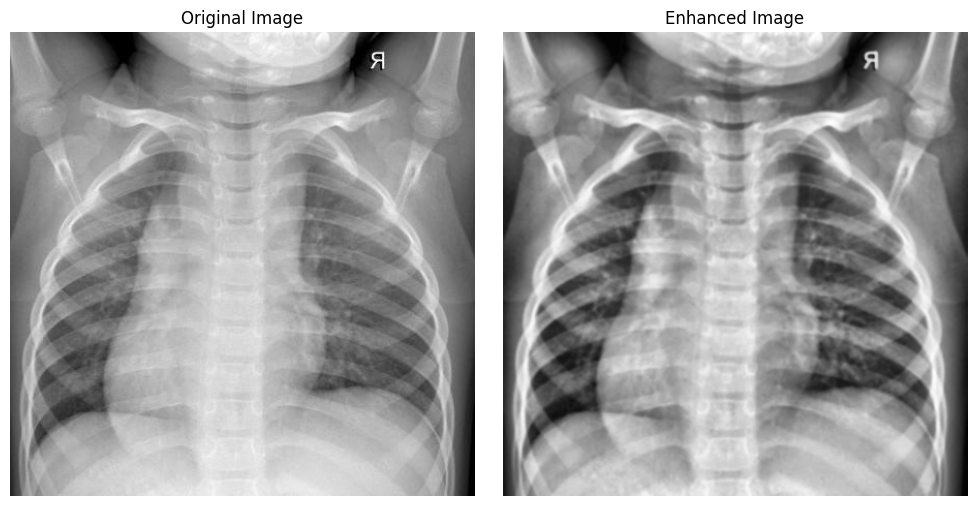

In [ ]:
import os
import cv2
import matplotlib.pyplot as plt

def view_before_after_preprocessing(image_path):
    """
    Displays an image before and after preprocessing.

    Args:
        image_path (str): Path to the original image file.
    """

    # Check if the file exists
    if not os.path.exists(image_path):
        print(f"Error: Image file not found at {image_path}. Please check the path.")
        return

    # Load the original image
    original_image = cv2.imread(image_path, cv2.IMREAD_COLOR)

    # Check if the image was loaded successfully
    if original_image is None:
        print(f"Error: Could not load image at {image_path}. Check the file format and permissions.")
        return  # Exit the function if image loading failed

    # Preprocess the image (using your functions)
    enhanced_image = preprocess_image(original_image)  # Replace 'preprocess_image' with your function

    # Display the images
    fig, axes = plt.subplots(1, 2, figsize=(10, 5))
    axes[0].imshow(cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB))  # Convert BGR to RGB for matplotlib
    axes[0].set_title('Original Image')
    axes[0].axis('off')
    axes[1].imshow(cv2.cvtColor(enhanced_image, cv2.COLOR_BGR2RGB))  # Convert BGR to RGB for matplotlib
    axes[1].set_title('Enhanced Image')
    axes[1].axis('off')
    plt.tight_layout()
    plt.show()

def preprocess_image(image):
    """Applies your preprocessing steps (Gaussian blur and CLAHE)."""
    # ... (Your preprocessing code here) ...
    # Assuming 'image' is a NumPy array
    # Apply Gaussian Blur
    image = cv2.GaussianBlur(image, (5, 5), 0)

    # Apply CLAHE
    # Convert image to LAB color space
    lab = cv2.cvtColor(image, cv2.COLOR_BGR2LAB)
    l, a, b = cv2.split(lab)

    # Apply CLAHE to the L channel
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
    l_clahe = clahe.apply(l)

    # Merge the CLAHE-enhanced L channel back with A and B
    lab_clahe = cv2.merge((l_clahe, a, b))

    # Convert back to BGR color space
    image = cv2.cvtColor(lab_clahe, cv2.COLOR_LAB2BGR)
    return image

# Example usage - Updated image_path
image_path = os.path.normpath(r'/content/extracted_files/00 Anatomia Normal/00 (695).jpeg')
view_before_after_preprocessing(image_path)

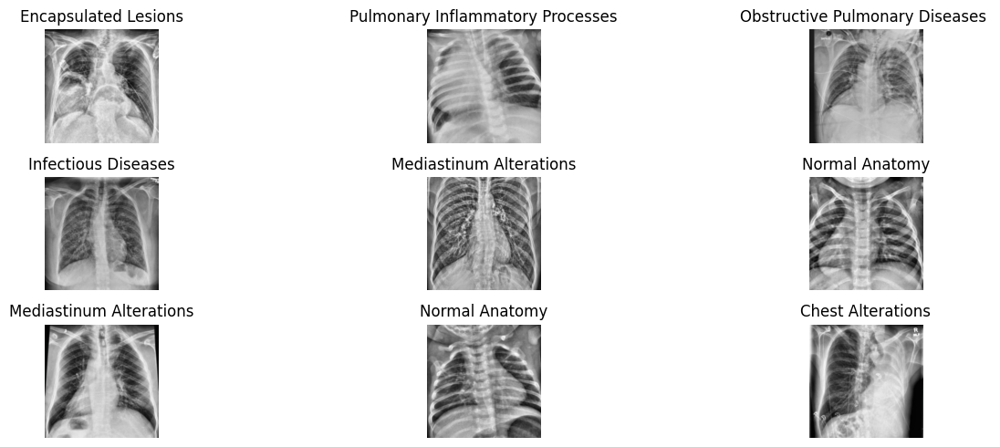

In [ ]:
import os
import cv2
import matplotlib.pyplot as plt
import random


def plot_images_from_directory(directory, num_images=9):
    """
    Plots a grid of shuffled images from a specified directory, with class labels based on directory names.

    Args:
        directory (str): Path to the directory containing images.
        num_images (int): Number of images to display in the grid.
    """
    # List all image files and their corresponding class names
    image_files = []
    class_names = []
    for root, _, files in os.walk(directory):
        for file in files:
            if file.lower().endswith(('.jpg', '.jpeg', '.png', '.bmp', '.tiff', '.gif')):
                image_files.append(os.path.join(root, file))
                class_folder = os.path.basename(root)
                # Map to simplified class name using the label mapping
                class_names.append(label_mapping.get(class_folder, class_folder))

    if not image_files:
        print("No images found in the directory!")
        return

    # Shuffle the data to mix images from different classes
    combined = list(zip(image_files, class_names))
    random.shuffle(combined)
    image_files, class_names = zip(*combined)

    # Limit the number of images to display
    num_images = min(num_images, len(image_files))

    # Plot the images in a grid
    cols = 3  # Number of columns in the grid
    rows = (num_images + cols - 1) // cols  # Calculate rows based on the number of images
    fig, axes = plt.subplots(rows, cols, figsize=(15, 5))
    axes = axes.flatten()

    for i in range(num_images):
        img = cv2.imread(image_files[i])
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB for matplotlib

        axes[i].imshow(img)
        axes[i].axis("off")
        axes[i].set_title(class_names[i])  # Use the mapped class name as title

    # Hide any unused subplots
    for j in range(num_images, len(axes)):
        axes[j].axis("off")

    plt.tight_layout()
    plt.show()

# Example usage
plot_images_from_directory('/content/enhanced_images', num_images=9)


## **Splitting the data**

We organized the dataset by splitting the images into three sets: **training**, **validation**, and **testing**. First, we created the necessary directories for each set. Then, we defined splitting ratios: **70%** of the images went to the **training set**, **20%** to the **validation set**, and **10%** to the **testing set**.

To ensure that no duplicate images appeared in any of the splits, we used an **MD5 hash** for each image. This allowed us to identify any identical images and prevent them from being included multiple times. We then **shuffled** the images to avoid any bias and divided them based on the predefined ratios.

Finally, we moved the images into their respective directories while maintaining the class subdirectories. This way, each class had its images properly split between the three sets, and we ensured there were no overlaps.

In [ ]:
import os
import random
import shutil
import hashlib

# Helper function to calculate hash for an image
def get_image_hash(file_path):
    with open(file_path, 'rb') as f:
        return hashlib.md5(f.read()).hexdigest()

# Path to the extracted directory
train_dir = "/content/enhanced_images"
base_dir = "/content/split_data"
train_split_dir = os.path.join(base_dir, 'train')
val_split_dir = os.path.join(base_dir, 'val')
test_split_dir = os.path.join(base_dir, 'test')

# Create split directories
os.makedirs(train_split_dir, exist_ok=True)
os.makedirs(val_split_dir, exist_ok=True)
os.makedirs(test_split_dir, exist_ok=True)

# Splitting ratios
train_ratio = 0.7
val_ratio = 0.2
test_ratio = 0.1

# Track used hashes to prevent duplication
used_hashes = set()

# Loop through class folders
for class_folder in os.listdir(train_dir):
    class_folder_path = os.path.join(train_dir, class_folder)
    images = os.listdir(class_folder_path)
    random.shuffle(images)  # Shuffle for randomness

    # Calculate split sizes
    total_images = len(images)
    train_count = int(total_images * train_ratio)
    val_count = int(total_images * val_ratio)

    train_images = []
    val_images = []
    test_images = []

    for img in images:
        img_path = os.path.join(class_folder_path, img)
        img_hash = get_image_hash(img_path)

        # Check for duplicates
        if img_hash not in used_hashes:
            if len(train_images) < train_count:
                train_images.append(img)
            elif len(val_images) < val_count:
                val_images.append(img)
            else:
                test_images.append(img)

            used_hashes.add(img_hash)

    # Move images to respective directories
    os.makedirs(os.path.join(train_split_dir, class_folder), exist_ok=True)
    os.makedirs(os.path.join(val_split_dir, class_folder), exist_ok=True)
    os.makedirs(os.path.join(test_split_dir, class_folder), exist_ok=True)

    for img in train_images:
        shutil.copy(os.path.join(class_folder_path, img), os.path.join(train_split_dir, class_folder, img))

    for img in val_images:
        shutil.copy(os.path.join(class_folder_path, img), os.path.join(val_split_dir, class_folder, img))

    for img in test_images:
        shutil.copy(os.path.join(class_folder_path, img), os.path.join(test_split_dir, class_folder, img))

print("Splitting complete without overlaps!")


Splitting complete without overlaps!


### rechecking overlaps

In [ ]:
import hashlib

def get_image_hash(file_path):
    with open(file_path, 'rb') as f:
        return hashlib.md5(f.read()).hexdigest()

def collect_image_hashes(data_dir):
    image_hashes = set()
    for class_folder in os.listdir(data_dir):
        class_path = os.path.join(data_dir, class_folder)
        for img_file in os.listdir(class_path):
            img_path = os.path.join(class_path, img_file)
            image_hashes.add(get_image_hash(img_path))
    return image_hashes

train_hashes = collect_image_hashes(train_split_dir)
val_hashes = collect_image_hashes(val_split_dir)
test_hashes = collect_image_hashes(test_split_dir)

# Check for overlaps
print("Train-Val Overlap:", len(train_hashes & val_hashes))
print("Train-Test Overlap:", len(train_hashes & test_hashes))
print("Val-Test Overlap:", len(val_hashes & test_hashes))


Train-Val Overlap: 0
Train-Test Overlap: 0
Val-Test Overlap: 0


## **data balancing**

In [ ]:
import os

def count_images_by_class(directory):
    """
    Count the number of images in each class folder within a given directory.

    Args:
    directory (str): Path to the dataset split directory (e.g., train, val, test).

    Returns:
    dict: A dictionary where keys are class names and values are the number of images.
    """
    class_counts = {}
    for class_name in os.listdir(directory):
        class_folder = os.path.join(directory, class_name)
        if os.path.isdir(class_folder):  # Ensure it's a folder
            class_counts[class_name] = len(os.listdir(class_folder))
    return class_counts


Class: Pulmonary Inflammatory Processes, Number of images: 742
Class: Chest Alterations, Number of images: 380
Class: Encapsulated Lesions, Number of images: 460
Class: Lower Density, Number of images: 440
Class: Higher Density, Number of images: 468
Class: Infectious Diseases, Number of images: 406
Class: Normal Anatomy, Number of images: 937
Class: Obstructive Pulmonary Diseases , Number of images: 446
Class: Mediastinum Alterations, Number of images: 417


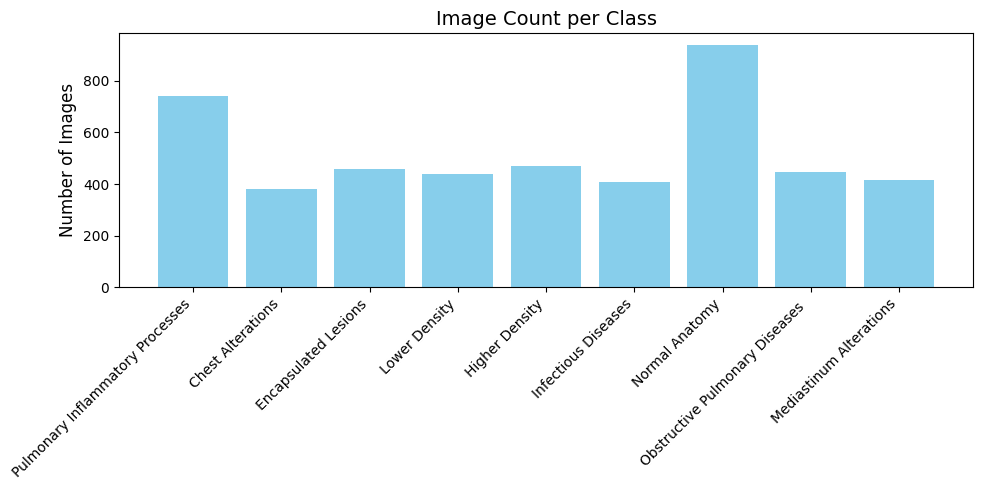

In [ ]:
import os
import matplotlib.pyplot as plt

# Path to the extracted directory containing class folders
train_dir = "/content/split_data/train"

# List all class folders
class_folders = os.listdir(train_dir)

# Dictionary to store the count of images in each class
class_image_count = {}

# List of valid image extensions
image_extensions = ['.jpg', '.jpeg', '.png', '.bmp', '.gif']

# Loop through each class folder
for class_folder in class_folders:
    class_folder_path = os.path.join(train_dir, class_folder)

    # Count the number of image files in the folder
    num_images = len([f for f in os.listdir(class_folder_path) if any(f.endswith(ext) for ext in image_extensions)])

    # Use the label mapping to get the simplified class name
    short_class_name = label_mapping.get(class_folder, class_folder)  # Use the folder name if not in mapping

    # Add to dictionary
    class_image_count[short_class_name] = num_images

# Display the count of images for each class
for class_name, count in class_image_count.items():
    print(f"Class: {class_name}, Number of images: {count}")

# Visualize the counts as a bar chart
plt.figure(figsize=(10, 5))
plt.bar(class_image_count.keys(), class_image_count.values(), color='skyblue')
plt.xticks(rotation=45, ha='right', fontsize=10)
plt.ylabel("Number of Images", fontsize=12)
plt.title("Image Count per Class", fontsize=14)
plt.tight_layout()
plt.show()


We reviewed the distribution of images across the different classes in our dataset. Upon examining the counts, we found that some classes have significantly more images than others. For example, the "Normal Anatomy" class has 937 images, while the "Chest Alterations" class only has 380 images. This indicates an imbalance in the dataset, where certain classes may dominate the training process, potentially leading to biased model predictions. To address this, we need to balance the dataset, either by oversampling the underrepresented classes or undersampling the overrepresented ones, ensuring that the model can learn effectively from all classes and generalize better to unseen data.

### **balancing the trainning data**

The code is designed to balance a dataset of medical X-ray images by ensuring that each class has the same number of images. It first converts all images to grayscale, as medical X-rays are typically in this format. For classes with more images than the target count, the code performs undersampling by randomly selecting images to meet the desired count. Conversely, for classes with fewer images, the code performs oversampling by first copying the existing images and then applying a series of augmentation techniques. These augmentations include elastic transformations to simulate slight patient positioning variations, affine transformations (like minimal rotations and scaling) to mimic positional differences, the addition of Gaussian noise to replicate imaging artifacts, and contrast adjustments to account for real-world variations in image quality. After balancing, the code verifies and prints the final number of images per class to ensure that each class has reached the target count. This approach is essential for preventing class imbalance in medical imaging, which could lead to biased models, ensuring that the dataset is adequately represented and facilitating the training of more accurate and generalized models for medical diagnosis tasks.

In [ ]:
import os
import shutil
import random
import numpy as np
from PIL import Image
import imgaug.augmenters as iaa

def convert_to_grayscale(img):
    """
    Ensure image is in grayscale mode, converting if necessary
    """
    if img.mode != 'L':
        return img.convert('L')
    return img

def balance_dataset(train_dir, balanced_train_dir, target_count=1000):
    """
    Balance X-ray dataset with careful augmentation

    Parameters:
    - train_dir: Source directory with original image classes
    - balanced_train_dir: Target directory for balanced dataset
    - target_count: Desired number of images per class
    """
    # Create balanced dataset folder if not exists
    os.makedirs(balanced_train_dir, exist_ok=True)

    # List all class folders
    class_folders = [f for f in os.listdir(train_dir) if os.path.isdir(os.path.join(train_dir, f))]

    # X-ray specific augmentation pipeline
    # Note: Very mild augmentations to preserve medical image integrity
    xray_augmentation_pipeline = iaa.Sequential([
        # Mild elastic transformations to simulate slight patient positioning variations
        iaa.ElasticTransformation(alpha=(0, 10), sigma=(0, 2)),

        # Very slight rotation and scaling to mimic subtle positioning differences
        iaa.Affine(
            rotate=(-3, 3),  # Minimal rotation
            scale=(0.95, 1.05)  # Minimal scaling
        ),

        # Gaussian noise to simulate slight imaging artifacts
        iaa.AdditiveGaussianNoise(scale=(0, 0.01*255)),

        # Slight contrast adjustments
        iaa.LinearContrast((0.9, 1.1))
    ])

    # Process each class
    for class_folder in class_folders:
        class_path = os.path.join(train_dir, class_folder)
        balanced_class_path = os.path.join(balanced_train_dir, class_folder)
        os.makedirs(balanced_class_path, exist_ok=True)

        # Get all image files
        image_files = [f for f in os.listdir(class_path) if f.lower().endswith(('.png', '.jpg', '.jpeg', '.bmp', '.gif'))]
        current_count = len(image_files)

        print(f"Processing class {class_folder}: Current count = {current_count}")

        # Determine if we need to undersample or oversample
        if current_count > target_count:
            # Undersampling
            sampled_images = random.sample(image_files, target_count)
            for img in sampled_images:
                src_path = os.path.join(class_path, img)
                dst_path = os.path.join(balanced_class_path, img)

                # Ensure grayscale and save
                pil_img = convert_to_grayscale(Image.open(src_path))
                pil_img.save(dst_path)

            print(f"Undersampled {class_folder} to {target_count} images")

        elif current_count < target_count:
            # Copy existing images first
            for img in image_files:
                src_path = os.path.join(class_path, img)
                dst_path = os.path.join(balanced_class_path, img)

                # Ensure grayscale and save
                pil_img = convert_to_grayscale(Image.open(src_path))
                pil_img.save(dst_path)

            # Augmentation for remaining images
            augmentation_needed = target_count - current_count

            # Load images for augmentation
            augmentation_candidates = [f for f in os.listdir(class_path) if f.lower().endswith(('.png', '.jpg', '.jpeg', '.bmp', '.gif'))]

            for i in range(augmentation_needed):
                # Randomly select an image to augment
                base_img_name = random.choice(augmentation_candidates)
                base_img_path = os.path.join(class_path, base_img_name)

                # Read image
                try:
                    # Convert to grayscale and then to numpy array
                    pil_img = convert_to_grayscale(Image.open(base_img_path))
                    img_array = np.array(pil_img)

                    # Apply augmentation
                    augmented_img = xray_augmentation_pipeline.augment_image(img_array)

                    # Save augmented image
                    new_img_name = f"augmented_{i}_{base_img_name}"
                    new_img_path = os.path.join(balanced_class_path, new_img_name)
                    Image.fromarray(augmented_img).save(new_img_path)

                except Exception as e:
                    print(f"Error augmenting image {base_img_name}: {e}")

            print(f"Oversampled {class_folder} to {target_count} images using augmentation")

        else:
            # Already at target count, just copy
            for img in image_files:
                src_path = os.path.join(class_path, img)
                dst_path = os.path.join(balanced_class_path, img)

                # Ensure grayscale and save
                pil_img = convert_to_grayscale(Image.open(src_path))
                pil_img.save(dst_path)

            print(f"{class_folder} already at target count")

    # Verify final counts
    print("\nFinal dataset verification:")
    for class_folder in os.listdir(balanced_train_dir):
        class_path = os.path.join(balanced_train_dir, class_folder)
        final_count = len([f for f in os.listdir(class_path) if f.lower().endswith(('.png', '.jpg', '.jpeg', '.bmp', '.gif'))])
        print(f"{class_folder}: {final_count} images")

# Usage
train_dir = "/content/split_data/train"
balanced_train_dir = "/content/split_data/train_balanced2"
balance_dataset(train_dir, balanced_train_dir, target_count=800)

Processing class 01 Processos Inflamatórios Pulmonares (Pneumonia): Current count = 742
Oversampled 01 Processos Inflamatórios Pulmonares (Pneumonia) to 800 images using augmentation
Processing class 08 Alterações do Tórax (Atelectasias, Malformações, Agenesia, Hipoplasias): Current count = 380
Oversampled 08 Alterações do Tórax (Atelectasias, Malformações, Agenesia, Hipoplasias) to 800 images using augmentation
Processing class 06 Lesões Encapsuladas (Abscessos, Nódulos, Cistos, Massas Tumorais, Metastases): Current count = 460
Oversampled 06 Lesões Encapsuladas (Abscessos, Nódulos, Cistos, Massas Tumorais, Metastases) to 800 images using augmentation
Processing class 03 Menor Densidade (Pneumotorax, Pneumomediastino, Pneumoperitonio): Current count = 440
Oversampled 03 Menor Densidade (Pneumotorax, Pneumomediastino, Pneumoperitonio) to 800 images using augmentation
Processing class 02 Maior Densidade (Derrame Pleural, Consolidação Atelectasica, Hidrotorax, Empiema): Current count = 4

#### comparing distribution before and after applying augmentation



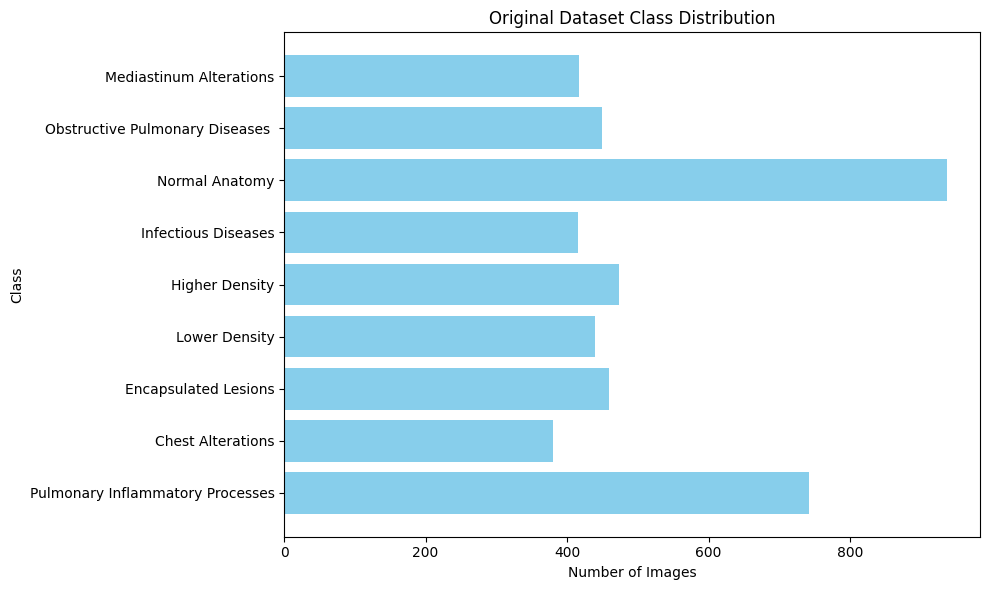

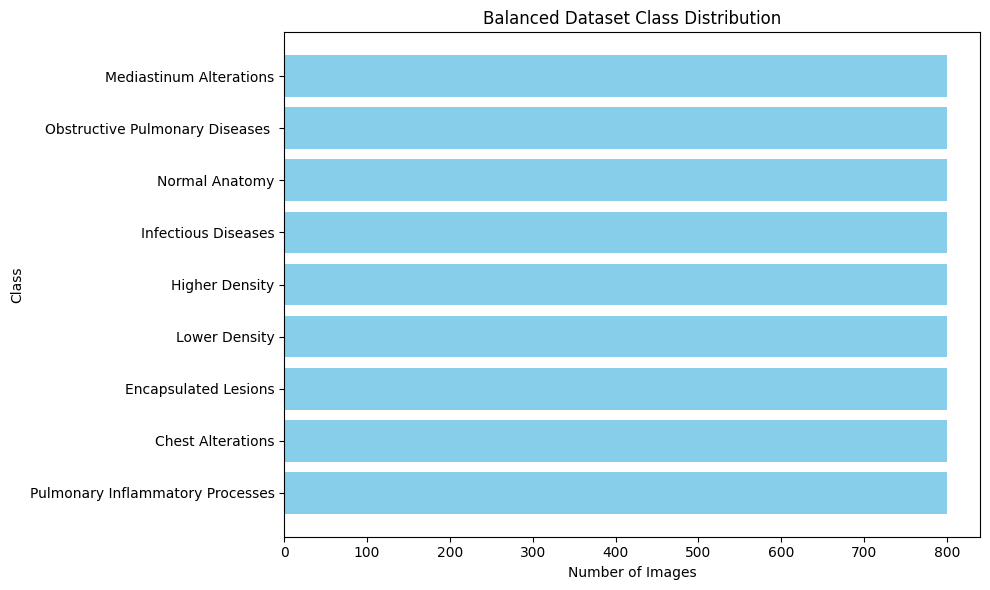

In [ ]:
import matplotlib.pyplot as plt

def plot_class_distribution(dataset_dir, label_mapping=None, title="Class Distribution"):
    """
    Plot the number of images in each class in the dataset, applying label mapping.

    Parameters:
    - dataset_dir: Directory containing the image classes
    - label_mapping: Dictionary mapping old class names to new labels
    - title: Title for the plot
    """
    # List class folders
    class_folders = [f for f in os.listdir(dataset_dir) if os.path.isdir(os.path.join(dataset_dir, f))]

    class_counts = []
    class_labels = []

    for class_folder in class_folders:
        # Apply label mapping if provided
        mapped_label = label_mapping.get(class_folder, class_folder) if label_mapping else class_folder

        # Count the number of images in the class
        class_path = os.path.join(dataset_dir, class_folder)
        image_files = [f for f in os.listdir(class_path) if f.lower().endswith(('.png', '.jpg', '.jpeg', '.bmp', '.gif'))]
        class_counts.append(len(image_files))
        class_labels.append(mapped_label)

    # Plotting the distribution with the new mapped labels
    plt.figure(figsize=(10, 6))
    plt.barh(class_labels, class_counts, color='skyblue')
    plt.xlabel('Number of Images')
    plt.ylabel('Class')
    plt.title(title)
    plt.tight_layout()
    plt.show()

# Plot class distribution before and after balancing (with label mapping)
plot_class_distribution(train_dir, label_mapping, title="Original Dataset Class Distribution")
plot_class_distribution(balanced_train_dir, label_mapping, title="Balanced Dataset Class Distribution")


# **Modeling**

### Model1: MobilenetV2

The `create_data_generators` function sets up image data generators for training and validation datasets using `ImageDataGenerator` from Keras. It resizes the images to 224x224 pixels to match the expected input size of the MobileNetV2 model. The pixel values are normalized to the [0, 1] range. The generators process the images in batches, preparing them for efficient model training and evaluation.

In [ ]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

def create_data_generators(train_path, validation_path, img_size=(224, 224), batch_size=32):
    # Rescale images to [0, 1] range
    datagen = ImageDataGenerator(rescale=1./255)

    # Create the training data generator
    train_generator = datagen.flow_from_directory(
        train_path,  # path to the directory with the training images
        target_size=img_size,
        batch_size=batch_size,
        class_mode='categorical'
    )

    # Create the validation data generator
    validation_generator = datagen.flow_from_directory(
        validation_path,  # path to the directory with validation images
        target_size=img_size,
        batch_size=batch_size,
        class_mode='categorical'
    )

    return train_generator, validation_generator

# Usage:
train_generator, validation_generator = create_data_generators(train_path='/content/split_data/train_balanced2', validation_path='/content/split_data/val')


Found 7200 images belonging to 9 classes.
Found 1344 images belonging to 9 classes.


The model is initialized with pre-trained ImageNet weights and modified by adding custom layers, including a global average pooling layer, a dense layer with 512 units, and a final softmax layer. The model is then compiled with the Adam optimizer, and training is performed with early stopping, model checkpointing, and learning rate reduction as callbacks.

In [ ]:
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras import layers, models
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau

# Define image size and other constants
IMG_SIZE = (224, 224)  # MobileNetV2 input size
BATCH_SIZE = 32
EPOCHS = 30 # You can adjust this

# Paths to your train and validation directories
train_path = '/content/split_data/train_balanced2'  # Replace with actual path
validation_path = '/content/split_data/val'  # Replace with actual path

# Step 1: Create data generators for training and validation
train_datagen = ImageDataGenerator(rescale=1./255)  # Since augmentation is already done
validation_datagen = ImageDataGenerator(rescale=1./255)

train_generator = train_datagen.flow_from_directory(
    train_path,
    target_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='categorical',  # Use 'binary' if binary classification
)

validation_generator = validation_datagen.flow_from_directory(
    validation_path,
    target_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='categorical',  # Use 'binary' if binary classification
)

# Step 2: Load the pre-trained MobileNetV2 model without the top layer
base_model = MobileNetV2(weights='imagenet', include_top=False, input_shape=(IMG_SIZE[0], IMG_SIZE[1], 3))

# Step 3: Freeze the layers of the base model initially (you will fine-tune later)
for layer in base_model.layers:
    layer.trainable = False

# Step 4: Add custom layers on top of the base model for fine-tuning
model1 = models.Sequential([
    base_model,  # Base MobileNetV2 model
    layers.GlobalAveragePooling2D(),
    layers.Dense(512, activation='relu'),
    layers.Dropout(0.5),
    layers.Dense(train_generator.num_classes, activation='softmax')  # Adjust this for your number of classes
])

# Step 5: Compile the model
model1.compile(optimizer=Adam(learning_rate=1e-5),  # Small learning rate for fine-tuning
              loss='categorical_crossentropy',  # Use 'binary_crossentropy' for binary classification
              metrics=['accuracy'])

# Step 6: Callbacks
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)
model_checkpoint = ModelCheckpoint('mobilenetv2_best_model.keras', save_best_only=True, monitor='val_loss', mode='min')
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.1, patience=3, min_lr=1e-7)

# Step 7: Train the model
history = model1.fit(
    train_generator,
    epochs=EPOCHS,
    validation_data=validation_generator,
    callbacks=[early_stopping, model_checkpoint, reduce_lr])

val_loss, val_acc = model1.evaluate(validation_generator)
print(f"Validation Accuracy: {val_acc}, Validation Loss: {val_loss}")


Found 7200 images belonging to 9 classes.
Found 1344 images belonging to 9 classes.
9406464/9406464 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
Epoch 1/30


/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


225/225 ━━━━━━━━━━━━━━━━━━━━ 31s 87ms/step - accuracy: 0.1395 - loss: 2.6394 - val_accuracy: 0.3356 - val_loss: 1.8818 - learning_rate: 1.0000e-05
Epoch 2/30
225/225 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - accuracy: 0.2131 - loss: 2.1888 - val_accuracy: 0.4554 - val_loss: 1.6294 - learning_rate: 1.0000e-05
Epoch 3/30
225/225 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - accuracy: 0.3027 - loss: 1.9297 - val_accuracy: 0.5692 - val_loss: 1.4609 - learning_rate: 1.0000e-05
Epoch 4/30
225/225 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - accuracy: 0.3682 - loss: 1.7781 - val_accuracy: 0.6265 - val_loss: 1.3371 - learning_rate: 1.0000e-05
Epoch 5/30
225/225 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - accuracy: 0.4439 - loss: 1.6009 - val_accuracy: 0.6458 - val_loss: 1.2436 - learning_rate: 1.0000e-05
Epoch 6/30
225/225 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - accuracy: 0.4796 - loss: 1.5185 - val_accuracy: 0.6756 - val_loss: 1.1684 - learning_rate: 1.0000e-05
Epoch 7/30
225/225 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - accurac

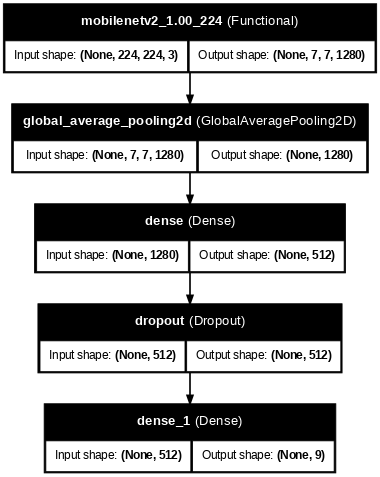

In [ ]:
from tensorflow import keras
keras.utils.plot_model(model1, to_file='model.png', show_shapes=True, show_layer_names=True, dpi=60)  # Adjust dpi as needed

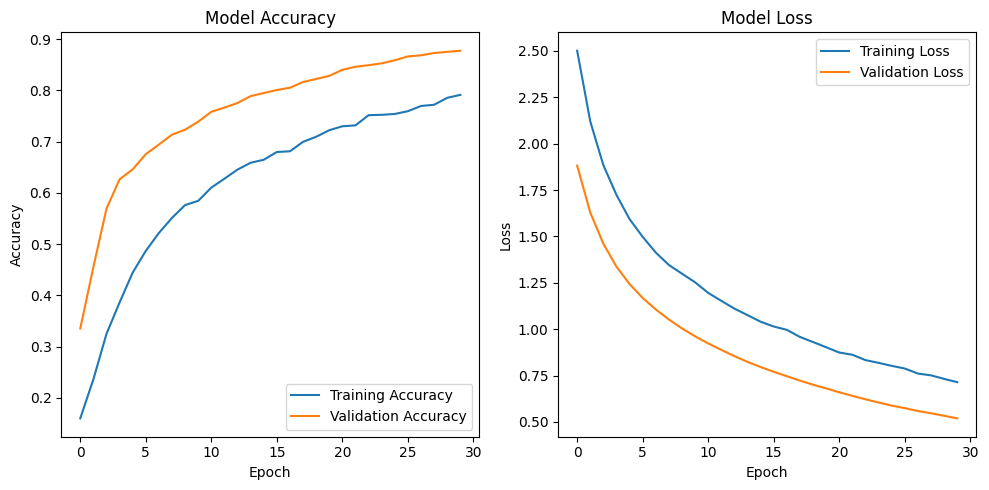

In [ ]:
import matplotlib.pyplot as plt

# Assuming 'history' is the object returned from model.fit()
def plot_learning_curve(history):
    """Plots the learning curves for accuracy and loss."""

    plt.figure(figsize=(10, 5))

    # Accuracy plot
    plt.subplot(1, 2, 1)
    plt.plot(history.history['accuracy'], label='Training Accuracy')
    plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
    plt.title('Model Accuracy')
    plt.ylabel('Accuracy')
    plt.xlabel('Epoch')
    plt.legend(loc='lower right')

    # Loss plot
    plt.subplot(1, 2, 2)
    plt.plot(history.history['loss'], label='Training Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    plt.title('Model Loss')
    plt.ylabel('Loss')
    plt.xlabel('Epoch')
    plt.legend(loc='upper right')

    plt.tight_layout()
    plt.show()

# Call the function to plot the learning curves
plot_learning_curve(history)

#### **Fine-tuning the model**

in this fine-tuning process, several key changes were made to the pre-trained MobileNetV2 model to improve its performance on our specific lung X-ray classification task. Initially, we froze all layers of MobileNetV2 to use its pre-trained features as a fixed feature extractor, which allowed us to focus on training the final dense layers. However, to allow the model to better adapt to our specific dataset, we later unfreezed the last few layers of the MobileNetV2 model. This change enabled the model to fine-tune its weights based on our task, potentially improving the accuracy and ability to capture domain-specific features.

Additionally, we incorporated callbacks like EarlyStopping, ReduceLROnPlateau, and ModelCheckpoint to prevent overfitting, adjust learning rates dynamically, and save the best model during training. The learning rate was also adjusted as the training progressed to ensure efficient convergence.

In [ ]:
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras import layers, models
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau

# Define image size and other constants
IMG_SIZE = (224, 224)  # MobileNetV2 input size
BATCH_SIZE = 32
EPOCHS = 40 # You can adjust this

# Paths to your train and validation directories
train_path = '/content/split_data/train_balanced2'  # Replace with actual path
validation_path = '/content/split_data/val'  # Replace with actual path

# Step 1: Create data generators for training and validation
train_datagen = ImageDataGenerator(rescale=1./255)  # Since augmentation is already done
validation_datagen = ImageDataGenerator(rescale=1./255)

train_generator = train_datagen.flow_from_directory(
    train_path,
    target_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='categorical',  # Use 'binary' if binary classification
)

validation_generator = validation_datagen.flow_from_directory(
    validation_path,
    target_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='categorical',  # Use 'binary' if binary classification
)

# Step 2: Load the pre-trained MobileNetV2 model without the top layer
base_model = MobileNetV2(weights='imagenet', include_top=False, input_shape=(IMG_SIZE[0], IMG_SIZE[1], 3))

# Step 3: Freeze the layers of the base model initially (you will fine-tune later)
for layer in base_model.layers:
    layer.trainable = False

# Step 4: Add custom layers on top of the base model for fine-tuning
model2 = models.Sequential([
    base_model,  # Base MobileNetV2 model
    layers.GlobalAveragePooling2D(),
    layers.Dense(512, activation='relu'),
    layers.Dropout(0.1),
    layers.Dense(train_generator.num_classes, activation='softmax')  # Adjust this for your number of classes
])

# Step 5: Compile the model
model2.compile(optimizer=Adam(learning_rate=1e-5),  # Small learning rate for fine-tuning
              loss='categorical_crossentropy',  # Use 'binary_crossentropy' for binary classification
              metrics=['accuracy'])

# Step 6: Callbacks
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)
model_checkpoint = ModelCheckpoint('mobilenetv2_best_model.keras', save_best_only=True, monitor='val_loss', mode='min')
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.1, patience=3, min_lr=1e-7)


# Step 8: Fine-tuning - Unfreeze some top layers of the base model and continue training
for layer in base_model.layers[-4:]:  # Unfreeze the last 4 layers (you can experiment with this number)
    layer.trainable = True

# Re-compile the model after unfreezing
model2.compile(optimizer=Adam(learning_rate=1e-5),  # Optionally, increase the learning rate slightly
              loss='categorical_crossentropy',  # Use 'binary_crossentropy' for binary classification
              metrics=['accuracy'])

# Step 9: Continue training with fine-tuned layers
history_fine_tune1 = model2.fit(
    train_generator,
    epochs=EPOCHS * 2,  # Continue training for more epochs
    validation_data=validation_generator,
    callbacks=[early_stopping, model_checkpoint, reduce_lr]
)

# Save the final fine-tuned model
model2.save('mobilenetv2_fine_tuned_model.keras')

# Optionally, evaluate the model on the validation set
val_loss, val_acc = model2.evaluate(validation_generator)
print(f"Validation Accuracy: {val_acc}, Validation Loss: {val_loss}")

Found 7200 images belonging to 9 classes.
Found 1344 images belonging to 9 classes.
Epoch 1/80
225/225 ━━━━━━━━━━━━━━━━━━━━ 28s 85ms/step - accuracy: 0.2110 - loss: 2.1570 - val_accuracy: 0.5394 - val_loss: 1.5989 - learning_rate: 1.0000e-05
Epoch 2/80
225/225 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - accuracy: 0.5672 - loss: 1.4548 - val_accuracy: 0.6391 - val_loss: 1.2493 - learning_rate: 1.0000e-05
Epoch 3/80
225/225 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - accuracy: 0.6727 - loss: 1.1627 - val_accuracy: 0.7143 - val_loss: 1.0064 - learning_rate: 1.0000e-05
Epoch 4/80
225/225 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - accuracy: 0.7256 - loss: 0.9857 - val_accuracy: 0.7798 - val_loss: 0.8371 - learning_rate: 1.0000e-05
Epoch 5/80
225/225 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - accuracy: 0.7649 - loss: 0.8611 - val_accuracy: 0.8274 - val_loss: 0.7065 - learning_rate: 1.0000e-05
Epoch 6/80
225/225 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - accuracy: 0.8061 - loss: 0.7399 - val_accuracy: 0.8638 - val_loss: 0.6

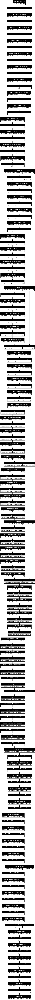

In [ ]:
from tensorflow import keras
keras.utils.plot_model(base_model, to_file='model.png', show_shapes=True, show_layer_names=True, dpi=60)  # Adjust dpi as needed

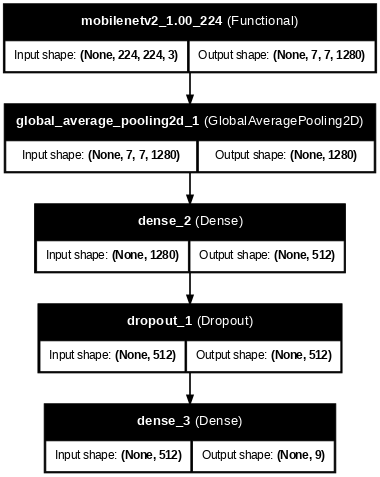

In [ ]:
from tensorflow import keras
keras.utils.plot_model(model2, to_file='model.png', show_shapes=True, show_layer_names=True, dpi=60)  # Adjust dpi as needed

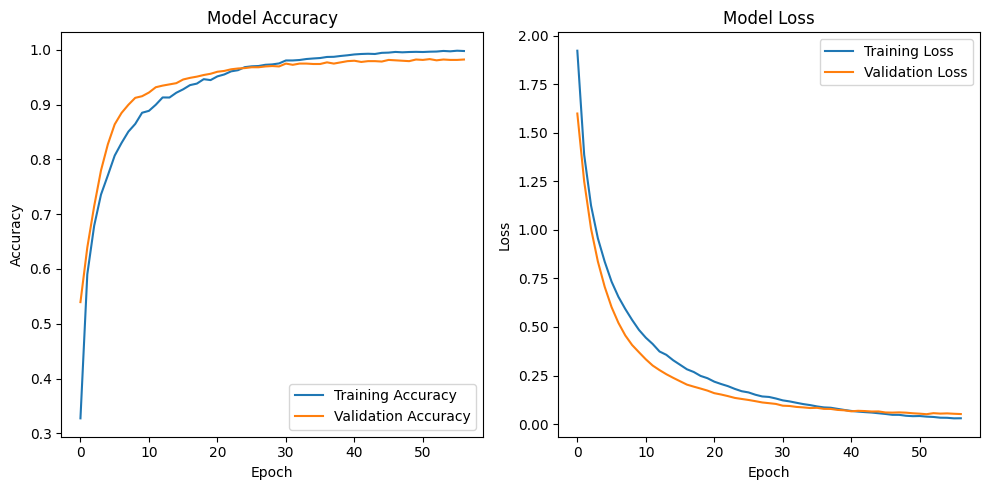

In [ ]:
import matplotlib.pyplot as plt

# Assuming 'history' is the object returned from model.fit()
def plot_learning_curve(history):
    """Plots the learning curves for accuracy and loss."""

    plt.figure(figsize=(10, 5))

    # Accuracy plot
    plt.subplot(1, 2, 1)
    plt.plot(history_fine_tune1.history['accuracy'], label='Training Accuracy')
    plt.plot(history_fine_tune1.history['val_accuracy'], label='Validation Accuracy')
    plt.title('Model Accuracy')
    plt.ylabel('Accuracy')
    plt.xlabel('Epoch')
    plt.legend(loc='lower right')

    # Loss plot
    plt.subplot(1, 2, 2)
    plt.plot(history_fine_tune1.history['loss'], label='Training Loss')
    plt.plot(history_fine_tune1.history['val_loss'], label='Validation Loss')
    plt.title('Model Loss')
    plt.ylabel('Loss')
    plt.xlabel('Epoch')
    plt.legend(loc='upper right')

    plt.tight_layout()
    plt.show()

# Call the function to plot the learning curves
plot_learning_curve(history)

As a result of these changes, the model's performance improved significantly. Training accuracy consistently increased, reaching nearly 100%, and validation accuracy also rose to around 97.6%. The model's validation loss steadily decreased, indicating good generalization and suggesting that the fine-tuning process was effective in adapting the pre-trained model to the lung X-ray dataset. These improvements suggest that the model is now better suited to classify lung X-ray images across the 9 categories, while avoiding overfitting to the training data.

# **Gradio Interface**

In [ ]:
!pip install gradio

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 57.1/57.1 MB 37.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 320.1/320.1 kB 25.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 94.9/94.9 kB 9.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.2/11.2 MB 116.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 73.2/73.2 kB 6.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 63.8/63.8 kB 5.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 130.2/130.2 kB 12.4 MB/s eta 0:00:00
  Attempting uninstall: markupsafe
    Found existing installation: MarkupSafe 3.0.2
    Uninstalling MarkupSafe-3.0.2:
      Successfully uninstalled MarkupSafe-3.0.2


In [ ]:
import gradio as gr
import tensorflow as tf
import numpy as np
from tensorflow.keras.preprocessing.image import load_img, img_to_array

# Load the fine-tuned model
model = tf.keras.models.load_model('mobilenetv2_fine_tuned_model.keras')

# Define class names
class_names = list(train_generator.class_indices.keys())

# Define a preprocessing function
def preprocess_image(image):
    """
    Preprocesses the image for MobileNetV2 input.
    Args:
        image: PIL Image uploaded by the user.
    Returns:
        Preprocessed image ready for prediction.
    """
    image = image.resize((224, 224))  # Resize to match model input
    image_array = img_to_array(image)  # Convert to array
    image_array = np.expand_dims(image_array, axis=0)  # Add batch dimension
    image_array = image_array / 255.0  # Normalize
    return image_array

# Define the prediction function
def predict_image(image):
    """
    Predicts the class of the uploaded image.
    Args:
        image: PIL Image uploaded by the user.
    Returns:
        Predicted class label and probabilities.
    """
    preprocessed_image = preprocess_image(image)
    predictions = model.predict(preprocessed_image)
    predicted_class = class_names[np.argmax(predictions)]
    prediction_probs = {class_names[i]: float(predictions[0][i]) for i in range(len(class_names))}
    return predicted_class, prediction_probs

# Build the Gradio Interface
interface = gr.Interface(
    fn=predict_image,
    inputs=gr.Image(type="pil"),
    outputs=[
        gr.Label(label="Predicted Class"),  # Displays the predicted class
        gr.Label(label="Class Probabilities")  # Displays probabilities for all classes
    ],
    title="Image Classification with MobileNetV2",
    description="Upload an image to classify using the fine-tuned MobileNetV2 model."
)

# Launch the interface
interface.launch()


Running Gradio in a Colab notebook requires sharing enabled. Automatically setting `share=True` (you can turn this off by setting `share=False` in `launch()` explicitly).

Colab notebook detected. To show errors in colab notebook, set debug=True in launch()
* Running on public URL: https://36b1e2c5e3d7236208.gradio.live

This share link expires in 72 hours. For free permanent hosting and GPU upgrades, run `gradio deploy` from the terminal in the working directory to deploy to Hugging Face Spaces (https://huggingface.co/spaces)


#### Model1 Evaluation

In [ ]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Step 1: Set up the ImageDataGenerator for the test set (rescaling only)
test_datagen = ImageDataGenerator(rescale=1./255)  # Only rescaling, no augmentation

# Step 2: Set up the test generator
test_generator = test_datagen.flow_from_directory(
    '/content/split_data/test',  # Replace with the path to your test set
    target_size=(224, 224),  # Same size as used during training
    batch_size=32,  # Use the same batch size as for training
    class_mode='categorical',  # Or 'binary' if binary classification
    shuffle=False  # Don't shuffle the test data
)

# Step 3: Evaluate the model on the test set
test_loss, test_acc = model2.evaluate(test_generator)

# Step 4: Print the evaluation results
print(f"Test Loss: {test_loss}")
print(f"Test Accuracy: {test_acc}")


Found 598 images belonging to 9 classes.
19/19 ━━━━━━━━━━━━━━━━━━━━ 5s 253ms/step - accuracy: 0.9708 - loss: 0.0789
Test Loss: 0.055847276002168655
Test Accuracy: 0.9816053509712219


So, what we did here is we evaluated our fine-tuned model using the test set. First, we set up an ImageDataGenerator with only rescaling for the test set. This means we didn’t apply any augmentation (like rotations or zooms), because we just want to see how the model performs on the actual test images, without any added variations.

Then, we used flow_from_directory to load the test images from a specific directory. We resized all the images to 224x224, the same size we used during training, and kept the batch size at 32, like we did when training the model.

When we ran the model on the test set, it returned a test accuracy of 98.16%, which is awesome! It also had a test loss of 0.065, which shows the model’s predictions are very close to the actual labels. In simple terms, the fine-tuning worked really well, and the model is performing excellently on unseen data.

##### Confusion Matrix

19/19 ━━━━━━━━━━━━━━━━━━━━ 6s 197ms/step
Confusion Matrix:
[[128   5   0   0   0   0   0   0   0]
 [  2  94   2   0   0   0   0   1   0]
 [  0   0  60   0   0   0   0   0   0]
 [  0   0   0  47   0   0   0   0   0]
 [  0   0   0   0  62   0   0   0   0]
 [  0   1   0   0   0  52   0   0   0]
 [  0   0   0   0   0   0  60   0   0]
 [  0   0   0   0   0   0   0  47   0]
 [  0   0   0   0   0   0   0   0  37]]


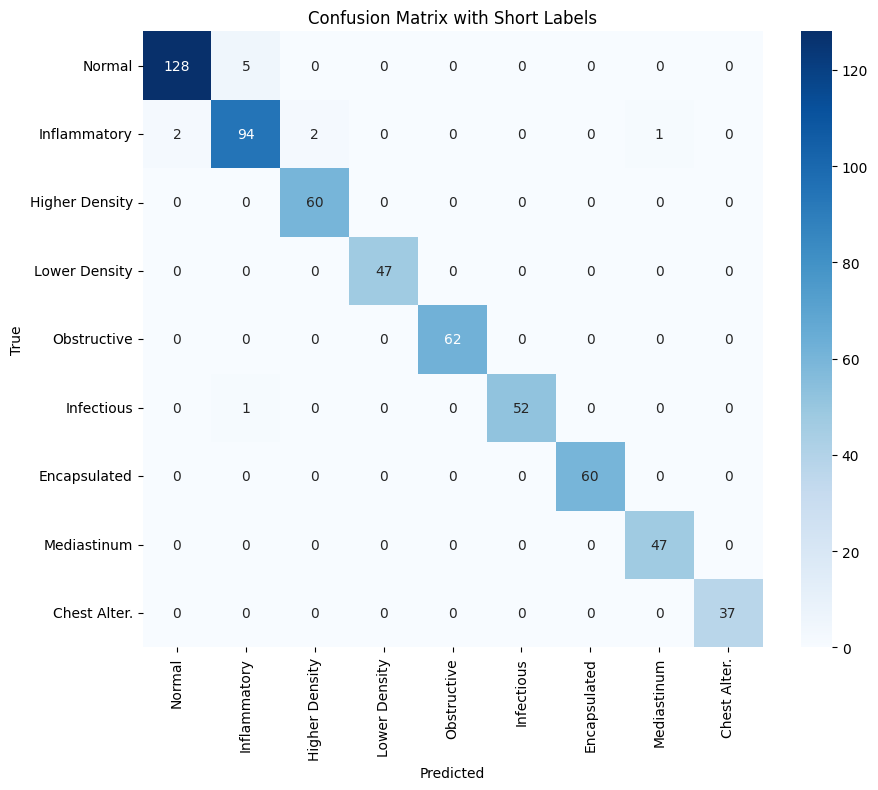

True label: Normal - Predicted: Normal
True label: Normal - Predicted: Normal
True label: Normal - Predicted: Normal
True label: Normal - Predicted: Normal
True label: Normal - Predicted: Normal


In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix

# Assuming you have your trained model and test_generator ready
# model = ... (load or define your trained model)

# Step 6: Make predictions on the test data
predictions = model2.predict(test_generator)

# Step 7: Convert the predicted probabilities to class labels
predicted_labels = predictions.argmax(axis=-1)  # Get the index of the highest probability

# Step 8: Get the true labels from the test generator
true_labels = test_generator.classes  # The actual labels

# Step 9: Map the class indices to actual class labels using the class_indices from the test_generator
class_indices = test_generator.class_indices  # Class indices from the test generator
class_labels = {v: k for k, v in class_indices.items()}  # Reverse the dictionary to map indices to labels

# Define a mapping for short labels
short_label_mapping = {
    '05 Doenças Infecciosas Degenerativas (Tuberculose, Sarcoidose, Proteinose, Fibrose)': 'Infectious',
    '00 Anatomia Normal': 'Normal',
    '03 Menor Densidade (Pneumotorax, Pneumomediastino, Pneumoperitonio)': 'Lower Density',
    '08 Alterações do Tórax (Atelectasias, Malformações, Agenesia, Hipoplasias)': 'Chest Alter.',
    '01 Processos Inflamatórios Pulmonares (Pneumonia)': 'Inflammatory',
    '07 Alterações de Mediastino (Pericardite, Malformações Arteriovenosas, Linfonodomegalias)': 'Mediastinum',
    '04 Doenças Pulmonares Obstrutivas (Enfisema, Broncopneumonia, Bronquiectasia, Embolia)': 'Obstructive',
    '02 Maior Densidade (Derrame Pleural, Consolidação Atelectasica, Hidrotorax, Empiema)': 'Higher Density',
    '06 Lesões Encapsuladas (Abscessos, Nódulos, Cistos, Massas Tumorais, Metastases)': 'Encapsulated'
}

# Step 10: Map predicted and true labels to class names
predicted_class_names = [class_labels[label] for label in predicted_labels]
true_class_names = [class_labels[label] for label in true_labels]

# Map the long class names to short class names
predicted_short_names = [short_label_mapping[class_name] for class_name in predicted_class_names]
true_short_names = [short_label_mapping[class_name] for class_name in true_class_names]

# Step 11: Compute the confusion matrix
cm = confusion_matrix(true_labels, predicted_labels)

# Step 12: Print the confusion matrix
print("Confusion Matrix:")
print(cm)

# Step 13: Plot the confusion matrix with short labels
plt.figure(figsize=(10, 8))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=[short_label_mapping[label] for label in class_labels.values()],
            yticklabels=[short_label_mapping[label] for label in class_labels.values()])
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix with Short Labels')
plt.show()

# Optional: Print a few example predictions
for i in range(5):  # Print 5 example predictions
    print(f"True label: {true_short_names[i]} - Predicted: {predicted_short_names[i]}")

If we look at the confusion matrix, we can see that most of the predictions are correct, which is a good sign that the model is performing well.

The diagonal values are the key here – they represent the number of correct predictions for each class. For example, 131 images from class 0 were correctly classified as class 0, and 91 images from class 1 were correctly predicted as class 1. These large numbers show that the model is accurately predicting each class.

As for the off-diagonal values, they tell us where the model made mistakes. For example, there’s 1 image from class 0 that got misclassified as class 3, and 4 images from class 1 that were wrongly predicted as class 3 as well. These are relatively small numbers, which means the model is still doing well overall, but there are some areas where it can be improved.

There are no major misclassifications across the board, meaning that the model is pretty solid. Some mistakes happen, but they are mostly with a few images that are getting confused between similar classes.

##### Actual  Vs *Prediction*

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


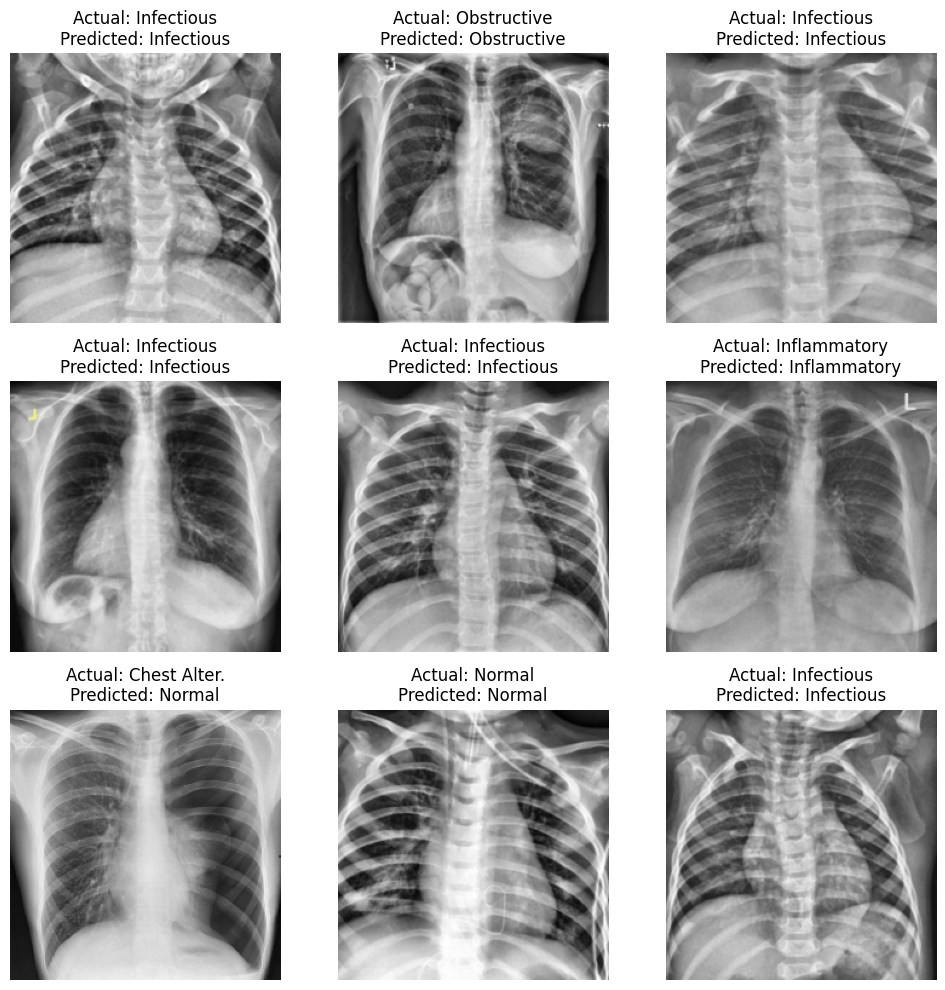

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Shortened label mapping
short_label_mapping = {
    '05 Doenças Infecciosas Degenerativas (Tuberculose, Sarcoidose, Proteinose, Fibrose)': 'Infectious',
    '00 Anatomia Normal': 'Normal',
    '03 Menor Densidade (Pneumotorax, Pneumomediastino, Pneumoperitonio)': 'Lower Density',
    '08 Alterações do Tórax (Atelectasias, Malformações, Agenesia, Hipoplasias)': 'Chest Alter.',
    '01 Processos Inflamatórios Pulmonares (Pneumonia)': 'Inflammatory',
    '07 Alterações de Mediastino (Pericardite, Malformações Arteriovenosas, Linfonodomegalias)': 'Mediastinum',
    '04 Doenças Pulmonares Obstrutivas (Enfisema, Broncopneumonia, Bronquiectasia, Embolia)': 'Obstructive',
    '02 Maior Densidade (Derrame Pleural, Consolidação Atelectasica, Hidrotorax, Empiema)': 'Higher Density',
    '06 Lesões Encapsuladas (Abscessos, Nódulos, Cistos, Massas Tumorais, Metastases)': 'Encapsulated'
}

# Create a reverse mapping from index to short label
index_to_short_label = {i: label for i, label in enumerate(short_label_mapping.keys())}

def visualize_test_data(generator, model, short_label_mapping, num_images=9):
    """
    Visualize test images with actual and predicted labels.

    Args:
        generator: The test data generator.
        model: The trained model for making predictions.
        short_label_mapping: A dictionary mapping long class names to short class names.
        num_images: Number of images to display.
    """
    # Get a batch of images and labels from the generator
    images, actual_labels = next(generator)

    # Make predictions using the model
    predictions = model2.predict(images)

    # Randomly select indices for the images to display
    num_images = min(num_images, len(images))  # Ensure we don't exceed the number of available images
    random_indices = np.random.choice(len(images), size=num_images, replace=False)

    # Set up the plot
    plt.figure(figsize=(10, 10))

    for i, idx in enumerate(random_indices):
        # Plotting images in a grid
        plt.subplot(3, 3, i + 1)

        # Display the image
        plt.imshow(images[idx])

        # Get the actual class index
        actual_index = np.argmax(actual_labels[idx])
        actual_label = index_to_short_label[actual_index]

        # Get the predicted class index
        predicted_index = np.argmax(predictions[idx])
        predicted_label = index_to_short_label.get(predicted_index, "Unknown")

        # Use short labels for the title
        actual_short_label = short_label_mapping[actual_label]
        predicted_short_label = short_label_mapping.get(predicted_label, "Unknown")

        # Set title with actual and predicted short labels
        plt.title(f"Actual: {actual_short_label}\nPredicted: {predicted_short_label}")
        plt.axis('off')

    plt.tight_layout()
    plt.show()

# Assuming you have your trained model ready
# model = ... (load or define your trained model)

# Visualize a few images from the test generator
visualize_test_data(test_generator, model2, short_label_mapping, num_images=9)

as we can see -------> most of the images were predicted corectly

### **Model2: VGG16 net**

In our second approach, we decided to leverage the VGG16 model, a pre-trained Convolutional Neural Network (CNN) known for its success in image classification tasks. The VGG16 architecture, trained on the ImageNet dataset, can be fine-tuned for specific tasks by freezing its layers and adding custom layers on top for our specific classification problem.

**Changes We Made:**

**1.Pre-trained VGG16 Model:**

We started by loading the pre-trained VGG16 model, using the imagenet weights, and set include_top=False to exclude the final classification layer (as we want to add our own classification layers). The input shape was set to (224, 224, 3) to match the VGG16 input size.

**2.Freezing the Base Model:**

We froze the weights of the VGG16 model (base_model.trainable = False) so that only the custom layers we added would be trained. This helps to reduce training time and makes use of the pre-learned features of VGG16, which are general enough for various image classification tasks.

**3.Custom Classification Layers:**

We added custom layers on top of the frozen VGG16 base model:
-A Flatten layer to reshape the output of the VGG16 base model into a 1D vector.
-A Dense layer with 256 units and ReLU activation for the classification process.
-A Dropout layer to prevent overfitting.
-A final Dense layer with num_classes units and softmax activation for multi-class classification.

In [ ]:
import tensorflow as tf
from tensorflow.keras import layers, models
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Set parameters
img_height, img_width = 224, 224  # VGG16 input size
batch_size = 32
num_classes = 9  # Adjust based on your number of classes

# Load the VGG16 model with pre-trained weights
base_model = tf.keras.applications.VGG16(weights='imagenet', include_top=False, input_shape=(img_height, img_width, 3))

# Freeze the base model
base_model.trainable = False

# Add custom classification layers on top of the base model
model3 = models.Sequential([
    base_model,
    layers.Flatten(),
    layers.Dense(256, activation='relu'),
    layers.Dropout(0.2),
    layers.Dense(num_classes, activation='softmax')
])

# Compile the model
model3.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Train the model
history2 = model3.fit(
    train_generator,
    validation_data=validation_generator,
    epochs=10  # Adjust the number of epochs as needed
)

# Evaluate the model
loss, accuracy = model3.evaluate(validation_generator)
print(f"Validation Loss: {loss:.4f}, Validation Accuracy: {accuracy:.4f}")

58889256/58889256 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
Epoch 1/10
225/225 ━━━━━━━━━━━━━━━━━━━━ 52s 160ms/step - accuracy: 0.4881 - loss: 2.1000 - val_accuracy: 0.8757 - val_loss: 0.4107
Epoch 2/10
225/225 ━━━━━━━━━━━━━━━━━━━━ 35s 152ms/step - accuracy: 0.8611 - loss: 0.4517 - val_accuracy: 0.9390 - val_loss: 0.2285
Epoch 3/10
225/225 ━━━━━━━━━━━━━━━━━━━━ 35s 152ms/step - accuracy: 0.9338 - loss: 0.2289 - val_accuracy: 0.9725 - val_loss: 0.1215
Epoch 4/10
225/225 ━━━━━━━━━━━━━━━━━━━━ 35s 153ms/step - accuracy: 0.9571 - loss: 0.1540 - val_accuracy: 0.9561 - val_loss: 0.1415
Epoch 5/10
225/225 ━━━━━━━━━━━━━━━━━━━━ 35s 153ms/step - accuracy: 0.9641 - loss: 0.1232 - val_accuracy: 0.9725 - val_loss: 0.0949
Epoch 6/10
225/225 ━━━━━━━━━━━━━━━━━━━━ 35s 153ms/step - accuracy: 0.9710 - loss: 0.0973 - val_accuracy: 0.9680 - val_loss: 0.1022
Epoch 7/10
225/225 ━━━━━━━━━━━━━━━━━━━━ 35s 152ms/step - accuracy: 0.9722 - loss: 0.0928 - val_accuracy: 0.9799 - val_loss: 0.0683
Epoch 8/10
225/225 ━━━━━━━━━━━━━

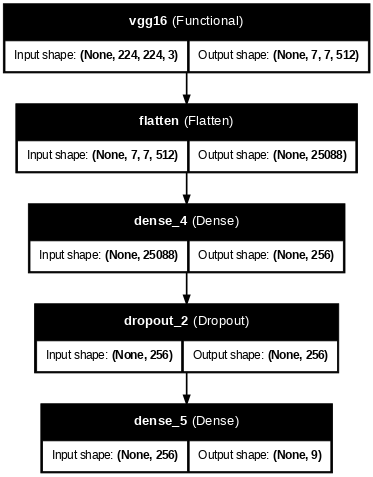

In [ ]:
from tensorflow import keras
keras.utils.plot_model(model3, to_file='model.png', show_shapes=True, show_layer_names=True, dpi=60)  # Adjust dpi as needed

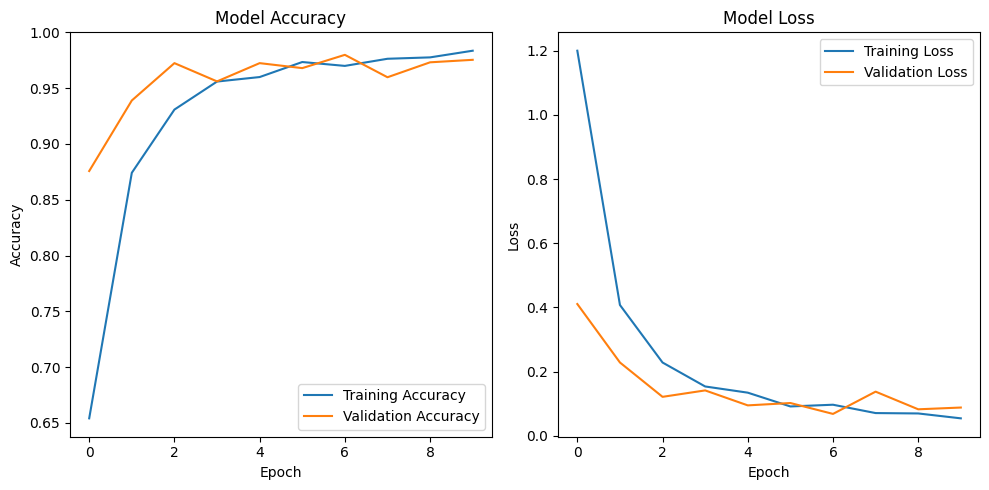

In [ ]:
import matplotlib.pyplot as plt

def plot_learning_curve(history):
    """Plots the learning curves for accuracy and loss."""

    plt.figure(figsize=(10, 5))

    # Accuracy plot
    plt.subplot(1, 2, 1)
    plt.plot(history2.history['accuracy'], label='Training Accuracy')
    plt.plot(history2.history['val_accuracy'], label='Validation Accuracy')
    plt.title('Model Accuracy')
    plt.ylabel('Accuracy')
    plt.xlabel('Epoch')
    plt.legend(loc='lower right')

    # Loss plot
    plt.subplot(1, 2, 2)
    plt.plot(history2.history['loss'], label='Training Loss')
    plt.plot(history2.history['val_loss'], label='Validation Loss')
    plt.title('Model Loss')
    plt.ylabel('Loss')
    plt.xlabel('Epoch')
    plt.legend(loc='upper right')

    plt.tight_layout()
    plt.show()

# Call the function to plot the learning curves
plot_learning_curve(history)

While the training accuracy continues to improve, the validation accuracy starts to plateau and shows a slight decrease in the last epochs. This is a typical sign of overfitting, where the model starts to memorize the training data rather than generalize well to unseen data.
Similarly, while both training loss and validation loss decrease initially, the slight increase in validation loss towards the end further indicates overfitting.

#### **Fine-tuning the model**

To improve performance, we incorporated two key changes: increasing the number of units in the dense layer from 256 to 512 and adding a batch normalization layer after the dense layer. These modifications enhanced the model's ability to learn complex patterns and stabilized training by normalizing inputs to each layer, resulting in faster convergence.

In [ ]:
import tensorflow as tf
from tensorflow.keras import layers, models
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau

# Set parameters
img_height, img_width = 224, 224  # VGG16 input size
batch_size = 32
num_classes = 9 # Adjust based on your number of classes


# Function to create and compile the model
def create_model():
    base_model = tf.keras.applications.VGG16(weights='imagenet', include_top=False, input_shape=(img_height, img_width, 3))
    base_model.trainable = False  # Freeze the base model initially

    model4 = models.Sequential([
        base_model,
        layers.Flatten(),
        layers.Dense(512, activation='relu'),
        layers.BatchNormalization(),  # Add Batch Normalization
        layers.Dense(num_classes, activation='softmax')
    ])

    model4.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=1e-6),
                  loss='categorical_crossentropy',
                  metrics=['accuracy'])
    return model4

# Create a new instance of the model
model4 = create_model()

# Callbacks
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=3, min_lr=1e-7)

# Train the model
history_fine_tune2 = model4.fit(
    train_generator,
    validation_data=validation_generator,
    epochs=50,
    callbacks=[early_stopping, reduce_lr]
)

# Evaluate the model
val_loss, val_accuracy = model4.evaluate(validation_generator)
print(f'Validation Loss: {val_loss}, Validation Accuracy: {val_accuracy}')

Epoch 1/50
225/225 ━━━━━━━━━━━━━━━━━━━━ 39s 161ms/step - accuracy: 0.1902 - loss: 2.3762 - val_accuracy: 0.4211 - val_loss: 1.7635 - learning_rate: 1.0000e-06
Epoch 2/50
225/225 ━━━━━━━━━━━━━━━━━━━━ 36s 156ms/step - accuracy: 0.4707 - loss: 1.5908 - val_accuracy: 0.6362 - val_loss: 1.2225 - learning_rate: 1.0000e-06
Epoch 3/50
225/225 ━━━━━━━━━━━━━━━━━━━━ 35s 153ms/step - accuracy: 0.6041 - loss: 1.2523 - val_accuracy: 0.7091 - val_loss: 0.9752 - learning_rate: 1.0000e-06
Epoch 4/50
225/225 ━━━━━━━━━━━━━━━━━━━━ 36s 156ms/step - accuracy: 0.6842 - loss: 1.0502 - val_accuracy: 0.7567 - val_loss: 0.8278 - learning_rate: 1.0000e-06
Epoch 5/50
225/225 ━━━━━━━━━━━━━━━━━━━━ 35s 154ms/step - accuracy: 0.7412 - loss: 0.9091 - val_accuracy: 0.7961 - val_loss: 0.7169 - learning_rate: 1.0000e-06
Epoch 6/50
225/225 ━━━━━━━━━━━━━━━━━━━━ 35s 156ms/step - accuracy: 0.7842 - loss: 0.7904 - val_accuracy: 0.8251 - val_loss: 0.6337 - learning_rate: 1.0000e-06
Epoch 7/50
225/225 ━━━━━━━━━━━━━━━━━━━━ 35s 15

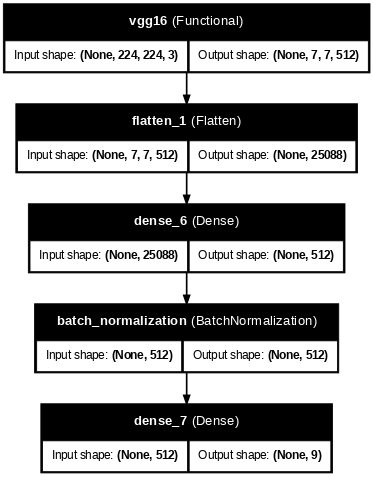

In [ ]:
from tensorflow import keras
keras.utils.plot_model(model4, to_file='model.png', show_shapes=True, show_layer_names=True, dpi=60)  # Adjust dpi as needed

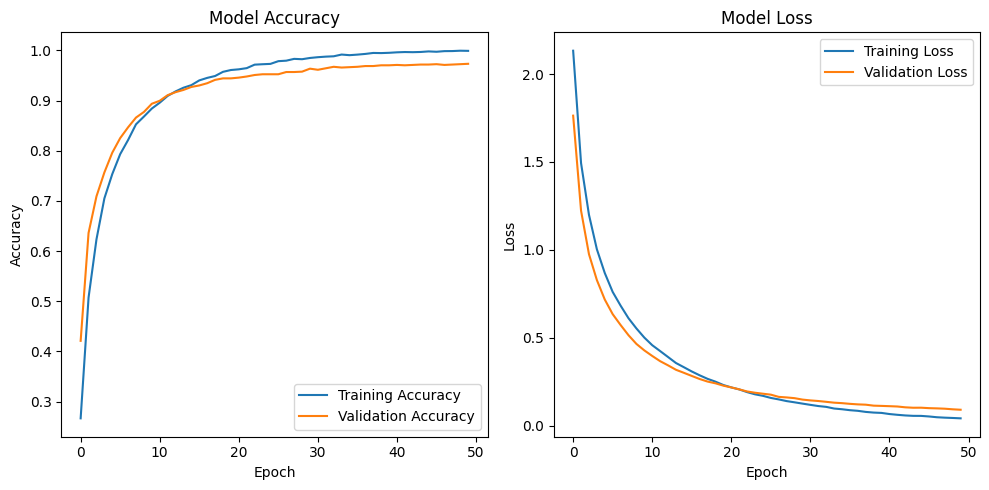

In [ ]:
import matplotlib.pyplot as plt
def plot_learning_curve(history):
    """Plots the learning curves for accuracy and loss."""

    plt.figure(figsize=(10, 5))

    # Accuracy plot
    plt.subplot(1, 2, 1)
    plt.plot(history_fine_tune2.history['accuracy'], label='Training Accuracy')
    plt.plot(history_fine_tune2.history['val_accuracy'], label='Validation Accuracy')
    plt.title('Model Accuracy')
    plt.ylabel('Accuracy')
    plt.xlabel('Epoch')
    plt.legend(loc='lower right')

    # Loss plot
    plt.subplot(1, 2, 2)
    plt.plot(history_fine_tune2.history['loss'], label='Training Loss')
    plt.plot(history_fine_tune2.history['val_loss'], label='Validation Loss')
    plt.title('Model Loss')
    plt.ylabel('Loss')
    plt.xlabel('Epoch')
    plt.legend(loc='upper right')

    plt.tight_layout()
    plt.show()

# Call the function to plot the learning curves
plot_learning_curve(history)


The results were promising, with the model achieving a high validation accuracy of approximately 97.7%, indicating that the model generalizes well to unseen data. The validation loss consistently decreased over the epochs, reflecting the model's improved performance.

#### Model 2 Evaluation

In [ ]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Step 1: Set up the ImageDataGenerator for the test set (rescaling only)
test_datagen = ImageDataGenerator(rescale=1./255)  # Only rescaling, no augmentation

# Step 2: Set up the test generator
test_generator = test_datagen.flow_from_directory(
    '/content/split_data/test',  # Replace with the path to your test set
    target_size=(224, 224),  # Same size as used during training
    batch_size=32,  # Use the same batch size as for training
    class_mode='categorical',  # Or 'binary' if binary classification
    shuffle=False  # Don't shuffle the test data
)

# Step 3: Evaluate the model on the test set
test_loss, test_acc = model4.evaluate(test_generator)

# Step 4: Print the evaluation results
print(f"Test Loss: {test_loss}")
print(f"Test Accuracy: {test_acc}")

Found 598 images belonging to 9 classes.


/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


19/19 ━━━━━━━━━━━━━━━━━━━━ 13s 728ms/step - accuracy: 0.9692 - loss: 0.1161
Test Loss: 0.09293758124113083
Test Accuracy: 0.97826087474823


##### Confusion matrix

19/19 ━━━━━━━━━━━━━━━━━━━━ 3s 143ms/step
Confusion Matrix:
[[128   2   0   2   1   0   0   0   0]
 [  4  92   1   0   1   0   1   0   0]
 [  0   0  60   0   0   0   0   0   0]
 [  0   0   0  47   0   0   0   0   0]
 [  0   0   0   0  62   0   0   0   0]
 [  0   0   0   0   0  53   0   0   0]
 [  0   0   0   0   0   1  59   0   0]
 [  0   0   0   0   0   0   0  47   0]
 [  0   0   0   0   0   0   0   0  37]]


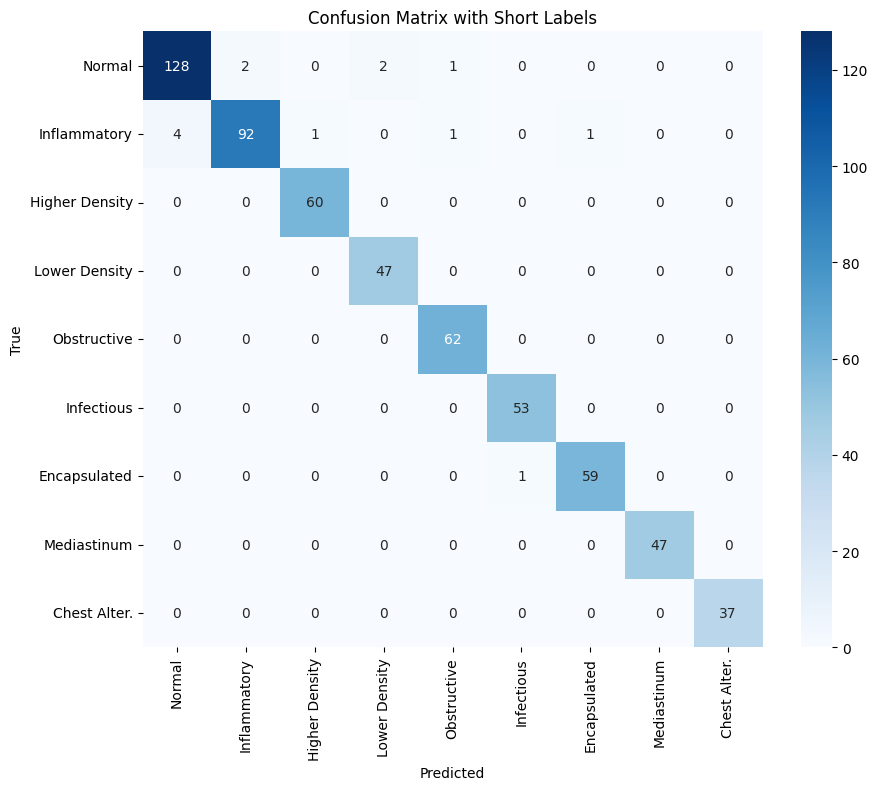

True label: Normal - Predicted: Normal
True label: Normal - Predicted: Normal
True label: Normal - Predicted: Normal
True label: Normal - Predicted: Normal
True label: Normal - Predicted: Normal


In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix

# Assuming you have your trained model and test_generator ready
# model = ... (load or define your trained model)

# Step 6: Make predictions on the test data
predictions = model4.predict(test_generator)

# Step 7: Convert the predicted probabilities to class labels
predicted_labels = predictions.argmax(axis=-1)  # Get the index of the highest probability

# Step 8: Get the true labels from the test generator
true_labels = test_generator.classes  # The actual labels

# Step 9: Map the class indices to actual class labels using the class_indices from the test_generator
class_indices = test_generator.class_indices  # Class indices from the test generator
class_labels = {v: k for k, v in class_indices.items()}  # Reverse the dictionary to map indices to labels

# Define a mapping for short labels
short_label_mapping = {
    '05 Doenças Infecciosas Degenerativas (Tuberculose, Sarcoidose, Proteinose, Fibrose)': 'Infectious',
    '00 Anatomia Normal': 'Normal',
    '03 Menor Densidade (Pneumotorax, Pneumomediastino, Pneumoperitonio)': 'Lower Density',
    '08 Alterações do Tórax (Atelectasias, Malformações, Agenesia, Hipoplasias)': 'Chest Alter.',
    '01 Processos Inflamatórios Pulmonares (Pneumonia)': 'Inflammatory',
    '07 Alterações de Mediastino (Pericardite, Malformações Arteriovenosas, Linfonodomegalias)': 'Mediastinum',
    '04 Doenças Pulmonares Obstrutivas (Enfisema, Broncopneumonia, Bronquiectasia, Embolia)': 'Obstructive',
    '02 Maior Densidade (Derrame Pleural, Consolidação Atelectasica, Hidrotorax, Empiema)': 'Higher Density',
    '06 Lesões Encapsuladas (Abscessos, Nódulos, Cistos, Massas Tumorais, Metastases)': 'Encapsulated'
}

# Step 10: Map predicted and true labels to class names
predicted_class_names = [class_labels[label] for label in predicted_labels]
true_class_names = [class_labels[label] for label in true_labels]

# Map the long class names to short class names
predicted_short_names = [short_label_mapping[class_name] for class_name in predicted_class_names]
true_short_names = [short_label_mapping[class_name] for class_name in true_class_names]

# Step 11: Compute the confusion matrix
cm = confusion_matrix(true_labels, predicted_labels)

# Step 12: Print the confusion matrix
print("Confusion Matrix:")
print(cm)

# Step 13: Plot the confusion matrix with short labels
plt.figure(figsize=(10, 8))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=[short_label_mapping[label] for label in class_labels.values()],
            yticklabels=[short_label_mapping[label] for label in class_labels.values()])
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix with Short Labels')
plt.show()

# Optional: Print a few example predictions
for i in range(5):  # Print 5 example predictions
    print(f"True label: {true_short_names[i]} - Predicted: {predicted_short_names[i]}")

The confusion matrix shows that the fine-tuned VGG16 model performs well overall, with the majority of predictions aligning with the actual classes. Most classes, such as 2, 3, 6, 7, and 8, have nearly perfect predictions, indicating that the model has learned their features effectively. However, there is minor confusion for Class 1, where a few samples are misclassified as Class 0, 4, 5, or 8. Similarly, Class 5 has two instances misclassified as Class 7. These errors suggest slight overlaps or similarities in features between these classes. Overall, the model demonstrates strong classification capabilities, with high accuracy across most categories and only minor misclassifications.

## **Model3:DenseNet121**

### model fine tuning by unfreezing all the layers

For our third approach, we utilized **DenseNet121**, a pretrained convolutional neural network known for its densely connected layers that promote efficient feature reuse and reduce parameter redundancy. The DenseNet121 model was loaded with pretrained weights from ImageNet, excluding its top classification layers, to adapt it to our specific task.

We added a custom classification head, starting with a **GlobalAveragePooling2D layer** to condense the spatial dimensions of feature maps. This was followed by **Batch Normalization** to stabilize and accelerate training, and a **Dropout layer** with a rate of 10% to reduce overfitting. A dense layer with 45 units and ReLU activation was included to enhance feature learning, and the final output layer comprised 9 units with a softmax activation function to predict probabilities for the 9 target classes.

To optimize the model, we used the **Adam optimizer** with a reduced learning rate of 0.0001, ensuring stable and gradual convergence. The model was trained for 50 epochs using categorical cross-entropy as the loss function. This approach effectively combines the feature extraction capabilities of DenseNet121 with custom layers to specialize for our multi-class classification problem.

In [ ]:
from tensorflow.keras.applications import DenseNet121
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D
from tensorflow.keras.layers import Dropout
from tensorflow.keras.regularizers import l2
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.layers import BatchNormalization

In [ ]:


# Load DenseNet-121 pretrained on ImageNet, without the top classification layers
base_model = DenseNet121(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Freeze the base model (optional for initial training)
base_model.trainable = False

# Adding custom layers on top of the DenseNet base
x = base_model.output
x = GlobalAveragePooling2D()(x)
x = BatchNormalization()(x)  # Batch normalization after pooling
x = Dropout(0.1)(x)  # Dropout layer
x = Dense(45, activation='relu')(x)  # Dense layer with 45 units
predictions = Dense(9, activation='softmax')(x)  # Output layer with 9 classes

# Create the final model
model5 = Model(inputs=base_model.input, outputs=predictions)

optimizer = Adam(learning_rate=0.0001)  # Decrease the learning rate

# Compile the model
model5.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy'])

# Model summary
model5.summary()

# Fit the model
history3 = model5.fit(
    train_generator,  # Training data
    epochs=50,  # Number of epochs
    validation_data=validation_generator,  # Validation data
    verbose=1
)


Model: "functional_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_3             │ (None, 224, 224, 3)    │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ zero_padding2d_2          │ (None, 230, 230, 3)    │              0 │ input_layer_3[0][0]    │
│ (ZeroPadding2D)           │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_conv (Conv2D)       │ (None, 112, 112, 64)   │          9,408 │ zero_padding2d_2[0][0] │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_bn                  │ (None, 112, 112, 64)   │            256 │ conv1_conv[0][0]       │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_relu (Activation)   │ (None, 112, 112, 64)   │              0 │ conv1_bn[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ zero_padding2d_3          │ (None, 114, 114, 64)   │              0 │ conv1_relu[0][0]       │
│ (ZeroPadding2D)           │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ pool1 (MaxPooling2D)      │ (None, 56, 56, 64)     │              0 │ zero_padding2d_3[0][0] │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_0_bn         │ (None, 56, 56, 64)     │            256 │ pool1[0][0]            │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_0_relu       │ (None, 56, 56, 64)     │              0 │ conv2_block1_0_bn[0][… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_conv       │ (None, 56, 56, 128)    │          8,192 │ conv2_block1_0_relu[0… │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_bn         │ (None, 56, 56, 128)    │            512 │ conv2_block1_1_conv[0… │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_relu       │ (None, 56, 56, 128)    │              0 │ conv2_block1_1_bn[0][… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_2_conv       │ (None, 56, 56, 32)     │         36,864 │ conv2_block1_1_relu[0… │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_concat       │ (None, 56, 56, 96)     │              0 │ pool1[0][0],           │
│ (Concatenate)             │                        │                │ conv2_block1_2_conv[0… │
├──────────────────────

 Total params: 7,088,139 (27.04 MB)

 Trainable params: 48,587 (189.79 KB)

 Non-trainable params: 7,039,552 (26.85 MB)

Epoch 1/50
225/225 ━━━━━━━━━━━━━━━━━━━━ 55s 129ms/step - accuracy: 0.1943 - loss: 2.2184 - val_accuracy: 0.5201 - val_loss: 1.5858
Epoch 2/50
225/225 ━━━━━━━━━━━━━━━━━━━━ 21s 89ms/step - accuracy: 0.5259 - loss: 1.4462 - val_accuracy: 0.6935 - val_loss: 1.1153
Epoch 3/50
225/225 ━━━━━━━━━━━━━━━━━━━━ 21s 90ms/step - accuracy: 0.6507 - loss: 1.1208 - val_accuracy: 0.7701 - val_loss: 0.8609
Epoch 4/50
225/225 ━━━━━━━━━━━━━━━━━━━━ 21s 90ms/step - accuracy: 0.7170 - loss: 0.9265 - val_accuracy: 0.8021 - val_loss: 0.7115
Epoch 5/50
225/225 ━━━━━━━━━━━━━━━━━━━━ 21s 90ms/step - accuracy: 0.7616 - loss: 0.7893 - val_accuracy: 0.8393 - val_loss: 0.6111
Epoch 6/50
225/225 ━━━━━━━━━━━━━━━━━━━━ 21s 90ms/step - accuracy: 0.7980 - loss: 0.6862 - val_accuracy: 0.8631 - val_loss: 0.5348
Epoch 7/50
225/225 ━━━━━━━━━━━━━━━━━━━━ 21s 90ms/step - accuracy: 0.8160 - loss: 0.6150 - val_accuracy: 0.8728 - val_loss: 0.4775
Epoch 8/50
225/225 ━━━━━━━━━━━━━━━━━━━━ 21s 89ms/step - accuracy: 0.8439 - loss: 0.5371 -

The DenseNet121-based model demonstrated significant improvements over 50 epochs. Initially, at epoch 1, the model achieved an accuracy of **19.43%** with a loss of **2.2184**. However, the model's performance improved rapidly in the following epochs, reaching **52.01%** accuracy and **1.5858** loss at epoch 1. By epoch 10, the accuracy increased to **86.69%** with a corresponding validation accuracy of **90.40%**, and the loss reduced to **0.3660**.

Key milestones include:
- **Epoch 20**: Training accuracy reached **93.41%** with validation accuracy at **94.49%**, and the loss dropped to **0.2102**.
- **Epoch 30**: Training accuracy was **95.54%**, while validation accuracy reached **95.91%**, with loss at **0.1519**.
- **Epoch 40**: The model achieved a peak accuracy of **96.49%** during training, with validation accuracy at **96.58%**, and the loss reduced to **0.1257**.
- **Epoch 50**: The final epoch showed **97.73%** accuracy on the training set, **96.95%** on the validation set, with a final loss of **0.1105**.

These results demonstrate a steady improvement in accuracy and a sharp reduction in loss, indicating that the model effectively learned to generalize well on the dataset. The consistent alignment of training and validation performance suggests minimal overfitting and strong model generalization.

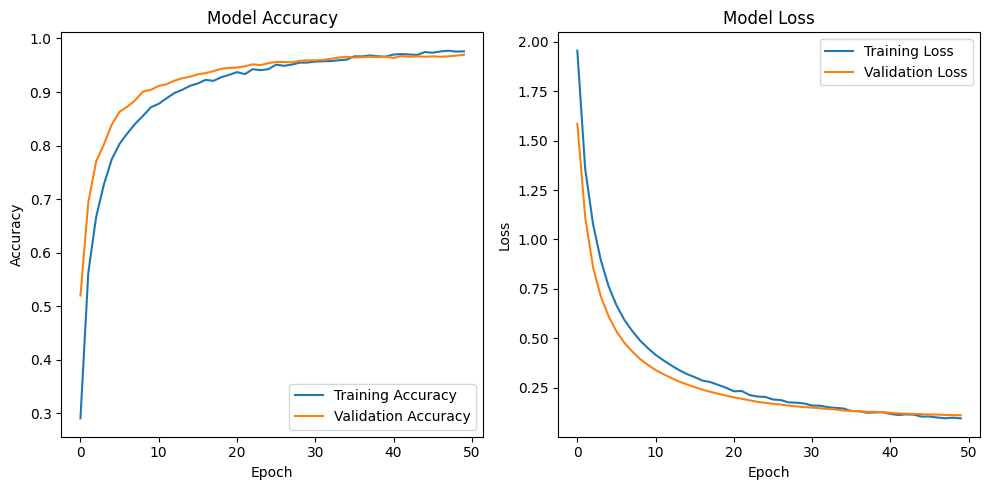

In [ ]:
import matplotlib.pyplot as plt

def plot_learning_curve(history):
    """Plots the learning curves for accuracy and loss."""

    plt.figure(figsize=(10, 5))

    # Accuracy plot
    plt.subplot(1, 2, 1)
    plt.plot(history3.history['accuracy'], label='Training Accuracy')
    plt.plot(history3.history['val_accuracy'], label='Validation Accuracy')
    plt.title('Model Accuracy')
    plt.ylabel('Accuracy')
    plt.xlabel('Epoch')
    plt.legend(loc='lower right')

    # Loss plot
    plt.subplot(1, 2, 2)
    plt.plot(history3.history['loss'], label='Training Loss')
    plt.plot(history3.history['val_loss'], label='Validation Loss')
    plt.title('Model Loss')
    plt.ylabel('Loss')
    plt.xlabel('Epoch')
    plt.legend(loc='upper right')

    plt.tight_layout()
    plt.show()

# Call the function to plot the learning curves
plot_learning_curve(history)

### model fine tuning by freezing all layers except the last few





In the second model, I use **DenseNet-121 pretrained on ImageNet** for transfer learning. Initially, I freeze the entire base model and add custom layers on top for my classification task. After this, I fine-tune the model by unfreezing the last 50 layers to adjust only the more specific features, keeping the rest frozen to preserve the general knowledge from ImageNet. I use a **low learning rate** to fine-tune and apply **early stopping** to prevent overfitting. This approach is more efficient than the first model, where I unfreezed all layers, allowing for faster training and better performance.

In [ ]:
from tensorflow.keras.callbacks import EarlyStopping

# Step 1: Initial Training
# Load DenseNet-121 pretrained on ImageNet, without the top classification layers
base_model = DenseNet121(weights='imagenet', include_top=False, input_shape=(224, 224, 3))
base_model.trainable = False  # Freeze the base model

# Add custom layers on top
x = base_model.output
x = GlobalAveragePooling2D()(x)
x = BatchNormalization()(x)
x = Dropout(0.1)(x)
x = Dense(45, activation='relu')(x)
predictions = Dense(9, activation='softmax')(x)

# Create the final model
model6 = Model(inputs=base_model.input, outputs=predictions)

# Step 2: Fine-Tuning
# Unfreeze the base model for fine-tuning
base_model.trainable = True

# Optionally, freeze all layers except the last few
for layer in base_model.layers[:-50]:  # Uncomment to fine-tune specific layers
    layer.trainable = False

# Re-compile the model with a lower learning rate for fine-tuning
fine_tune_optimizer = Adam(learning_rate=1e-5)
model6.compile(optimizer=fine_tune_optimizer, loss='categorical_crossentropy', metrics=['accuracy'])

# Add early stopping for fine-tuning
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

# Fine-tune the model
history_fine_tune5 = model6.fit(
    train_generator,
    epochs=50,  # Fine-tune for additional epochs
    validation_data=validation_generator,
    verbose=1,
    callbacks=[early_stopping]
)


29084464/29084464 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
Epoch 1/50
225/225 ━━━━━━━━━━━━━━━━━━━━ 67s 132ms/step - accuracy: 0.1518 - loss: 2.3536 - val_accuracy: 0.3586 - val_loss: 1.7879
Epoch 2/50
225/225 ━━━━━━━━━━━━━━━━━━━━ 23s 98ms/step - accuracy: 0.3352 - loss: 1.8124 - val_accuracy: 0.5424 - val_loss: 1.3777
Epoch 3/50
225/225 ━━━━━━━━━━━━━━━━━━━━ 22s 97ms/step - accuracy: 0.4760 - loss: 1.5184 - val_accuracy: 0.6726 - val_loss: 1.1322
Epoch 4/50
225/225 ━━━━━━━━━━━━━━━━━━━━ 22s 96ms/step - accuracy: 0.5810 - loss: 1.3005 - val_accuracy: 0.7485 - val_loss: 0.9635
Epoch 5/50
225/225 ━━━━━━━━━━━━━━━━━━━━ 22s 97ms/step - accuracy: 0.6668 - loss: 1.1375 - val_accuracy: 0.7969 - val_loss: 0.8351
Epoch 6/50
225/225 ━━━━━━━━━━━━━━━━━━━━ 22s 97ms/step - accuracy: 0.7301 - loss: 0.9957 - val_accuracy: 0.8341 - val_loss: 0.7319
Epoch 7/50
225/225 ━━━━━━━━━━━━━━━━━━━━ 22s 97ms/step - accuracy: 0.7629 - loss: 0.9002 - val_accuracy: 0.8519 - val_loss: 0.6490
Epoch 8/50
225/225 ━━━━━━━━━━━━━━━━━━━

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.758899 to fit



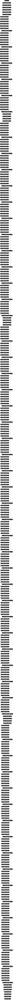

In [ ]:
from tensorflow import keras
keras.utils.plot_model(model6, to_file='model.png', show_shapes=True, show_layer_names=True, dpi=60)  # Adjust dpi

The second set of results shows significantly better performance than the first one, based on both training and validation accuracy:

- **Training Accuracy**: The second model reaches **100%** accuracy at epoch 47, while the first model achieves **97.73%** accuracy at epoch 50.
- **Validation Accuracy**: The second model achieves a high validation accuracy of **98.59%** at epoch 50, while the first model reaches **96.95%**.
- **Loss**: The second model's loss continually decreases throughout the epochs, with a final loss of **0.0512**, while the first model ends with a loss of **0.1105**.

In terms of **training and validation performance**, the second set of results is notably superior, with the model achieving near-perfect accuracy and a lower loss. It also demonstrates a smoother and more consistent improvement throughout the epochs. Therefore, the second result reflects a better-trained model overall.

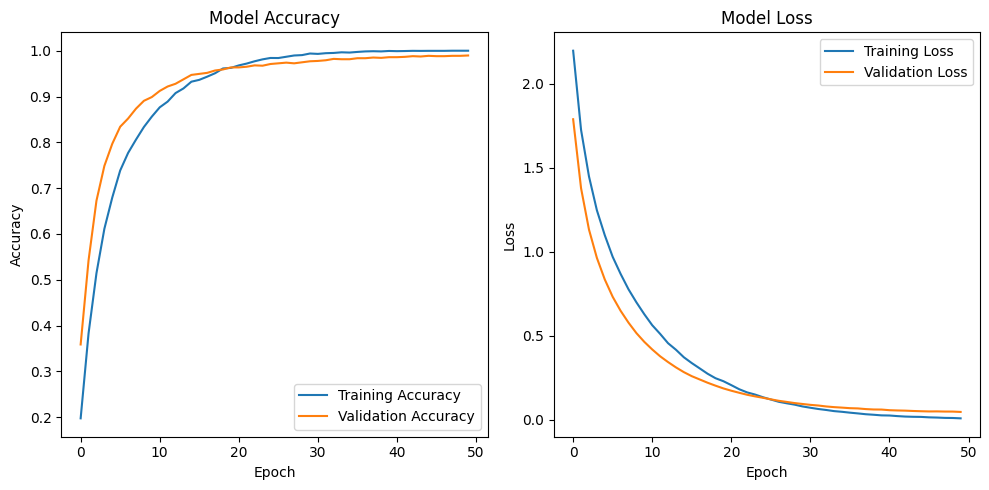

In [ ]:
import matplotlib.pyplot as plt

def plot_learning_curve(history):
    """Plots the learning curves for accuracy and loss."""

    plt.figure(figsize=(10, 5))

    # Accuracy plot
    plt.subplot(1, 2, 1)
    plt.plot(history_fine_tune5 .history['accuracy'], label='Training Accuracy')
    plt.plot(history_fine_tune5 .history['val_accuracy'], label='Validation Accuracy')
    plt.title('Model Accuracy')
    plt.ylabel('Accuracy')
    plt.xlabel('Epoch')
    plt.legend(loc='lower right')

    # Loss plot
    plt.subplot(1, 2, 2)
    plt.plot(history_fine_tune5 .history['loss'], label='Training Loss')
    plt.plot(history_fine_tune5 .history['val_loss'], label='Validation Loss')
    plt.title('Model Loss')
    plt.ylabel('Loss')
    plt.xlabel('Epoch')
    plt.legend(loc='upper right')

    plt.tight_layout()
    plt.show()

# Call the function to plot the learning curves
plot_learning_curve(history)

### Model3 Evaluation

In [ ]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Step 1: Set up the ImageDataGenerator for the test set (rescaling only)
test_datagen = ImageDataGenerator(rescale=1./255)  # Only rescaling, no augmentation

# Step 2: Set up the test generator
test_generator = test_datagen.flow_from_directory(
    '/content/split_data/test',  # Replace with the path to your test set
    target_size=(224, 224),  # Same size as used during training
    batch_size=32,  # Use the same batch size as for training
    class_mode='categorical',  # Or 'binary' if binary classification
    shuffle=False  # Don't shuffle the test data
)

# Step 3: Evaluate the model on the test set
test_loss, test_acc = model6.evaluate(test_generator)

# Step 4: Print the evaluation results
print(f"Test Loss: {test_loss}")
print(f"Test Accuracy: {test_acc}")


Found 598 images belonging to 9 classes.
 1/19 ━━━━━━━━━━━━━━━━━━━━ 3s 191ms/step - accuracy: 1.0000 - loss: 0.0028

/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


19/19 ━━━━━━━━━━━━━━━━━━━━ 11s 591ms/step - accuracy: 0.9882 - loss: 0.0341
Test Loss: 0.025580966845154762
Test Accuracy: 0.9916387796401978


Test Accuracy: 98.83% with a test loss of 0.0609, suggesting that the model is robust and performs well on unseen data.

#### Confusion Matrix

19/19 ━━━━━━━━━━━━━━━━━━━━ 17s 507ms/step
Confusion Matrix:
[[131   1   0   0   1   0   0   0   0]
 [  1  96   1   0   0   0   1   0   0]
 [  0   0  60   0   0   0   0   0   0]
 [  0   0   0  47   0   0   0   0   0]
 [  0   0   0   0  62   0   0   0   0]
 [  0   0   0   0   0  53   0   0   0]
 [  0   0   0   0   0   0  60   0   0]
 [  0   0   0   0   0   0   0  47   0]
 [  0   0   0   0   0   0   0   0  37]]


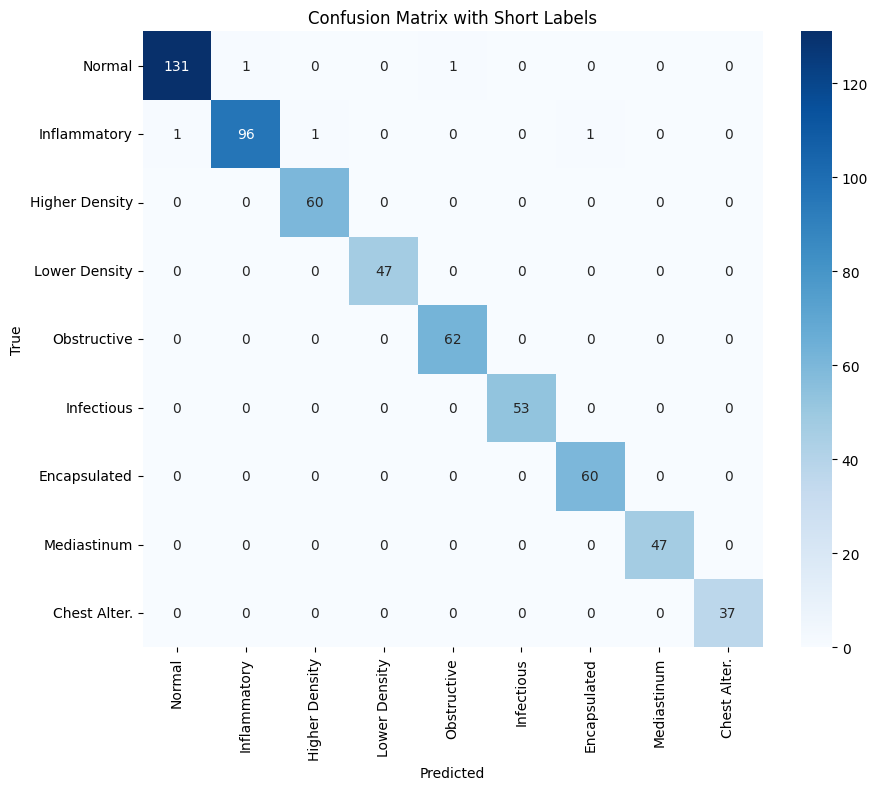

True label: Normal - Predicted: Normal
True label: Normal - Predicted: Normal
True label: Normal - Predicted: Normal
True label: Normal - Predicted: Normal
True label: Normal - Predicted: Normal


In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix

# Assuming you have your trained model and test_generator ready
# model = ... (load or define your trained model)

# Step 6: Make pred3ictions on the test data
predictions = model6.predict(test_generator)

# Step 7: Convert the predicted probabilities to class labels
predicted_labels = predictions.argmax(axis=-1)  # Get the index of the highest probability

# Step 8: Get the true labels from the test generator
true_labels = test_generator.classes  # The actual labels

# Step 9: Map the class indices to actual class labels using the class_indices from the test_generator
class_indices = test_generator.class_indices  # Class indices from the test generator
class_labels = {v: k for k, v in class_indices.items()}  # Reverse the dictionary to map indices to labels

# Define a mapping for short labels
short_label_mapping = {
    '05 Doenças Infecciosas Degenerativas (Tuberculose, Sarcoidose, Proteinose, Fibrose)': 'Infectious',
    '00 Anatomia Normal': 'Normal',
    '03 Menor Densidade (Pneumotorax, Pneumomediastino, Pneumoperitonio)': 'Lower Density',
    '08 Alterações do Tórax (Atelectasias, Malformações, Agenesia, Hipoplasias)': 'Chest Alter.',
    '01 Processos Inflamatórios Pulmonares (Pneumonia)': 'Inflammatory',
    '07 Alterações de Mediastino (Pericardite, Malformações Arteriovenosas, Linfonodomegalias)': 'Mediastinum',
    '04 Doenças Pulmonares Obstrutivas (Enfisema, Broncopneumonia, Bronquiectasia, Embolia)': 'Obstructive',
    '02 Maior Densidade (Derrame Pleural, Consolidação Atelectasica, Hidrotorax, Empiema)': 'Higher Density',
    '06 Lesões Encapsuladas (Abscessos, Nódulos, Cistos, Massas Tumorais, Metastases)': 'Encapsulated'
}

# Step 10: Map predicted and true labels to class names
predicted_class_names = [class_labels[label] for label in predicted_labels]
true_class_names = [class_labels[label] for label in true_labels]

# Map the long class names to short class names
predicted_short_names = [short_label_mapping[class_name] for class_name in predicted_class_names]
true_short_names = [short_label_mapping[class_name] for class_name in true_class_names]

# Step 11: Compute the confusion matrix
cm = confusion_matrix(true_labels, predicted_labels)

# Step 12: Print the confusion matrix
print("Confusion Matrix:")
print(cm)

# Step 13: Plot the confusion matrix with short labels
plt.figure(figsize=(10, 8))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=[short_label_mapping[label] for label in class_labels.values()],
            yticklabels=[short_label_mapping[label] for label in class_labels.values()])
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix with Short Labels')
plt.show()

# Optional: Print a few example predictions
for i in range(5):  # Print 5 example predictions
    print(f"True label: {true_short_names[i]} - Predicted: {predicted_short_names[i]}")

The model performed exceptionally well, as most of the predictions are correct (diagonal values).
Misclassifications are very rare and mostly occur between adjacent or similar classes (for example, class 1 is sometimes misclassified as class 2 or 3, and class 2 is sometimes misclassified as class 1).
The misclassification rate is low, which indicates the model is highly accurate and is distinguishing the classes well.
The confusion matrix shows that the model has a strong ability to classify most of the test data correctly, with very few errors.

# **Comparing models**

## ROC Curve



In [ ]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc

## AUC

In [ ]:
y_true = test_generator.classes # True labels
y_pred_model2 = model2.predict(test_generator) # MobileNetV2 predictions
y_pred_model4 = model4.predict(test_generator) # VGG16 predictions
y_pred_model6 = model6.predict(test_generator) # DenseNet-121 predictions


19/19 ━━━━━━━━━━━━━━━━━━━━ 1s 64ms/step
19/19 ━━━━━━━━━━━━━━━━━━━━ 2s 121ms/step
19/19 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step


In [ ]:
import numpy as np

# Convert probabilities to class labels
y_pred_model2_classes = np.argmax(y_pred_model2, axis=1)
y_pred_model4_classes = np.argmax(y_pred_model4, axis=1)
y_pred_model6_classes = np.argmax(y_pred_model6, axis=1)


In [ ]:
# Extract class names from the test generator
class_names = list(test_generator.class_indices.keys())


In [ ]:
from sklearn.metrics import roc_auc_score, roc_curve, auc
from sklearn.preprocessing import label_binarize

# Binarize true labels for multiclass ROC-AUC
y_true_binarized = label_binarize(y_true, classes=range(len(class_names)))

# Compute ROC-AUC for each model
roc_auc_model2 = roc_auc_score(y_true_binarized, y_pred_model2, average="macro")
roc_auc_model4 = roc_auc_score(y_true_binarized, y_pred_model4, average="macro")
roc_auc_model6 = roc_auc_score(y_true_binarized, y_pred_model6, average="macro")

print("Macro-Averaged ROC-AUC:")
print("MobileNetV2:", roc_auc_model2)
print("VGG16:", roc_auc_model4)
print("DenseNet-121:", roc_auc_model6)


Macro-Averaged ROC-AUC:
MobileNetV2: 0.9997717573544297
VGG16: 0.9991340174547957
DenseNet-121: 0.9999698693416632


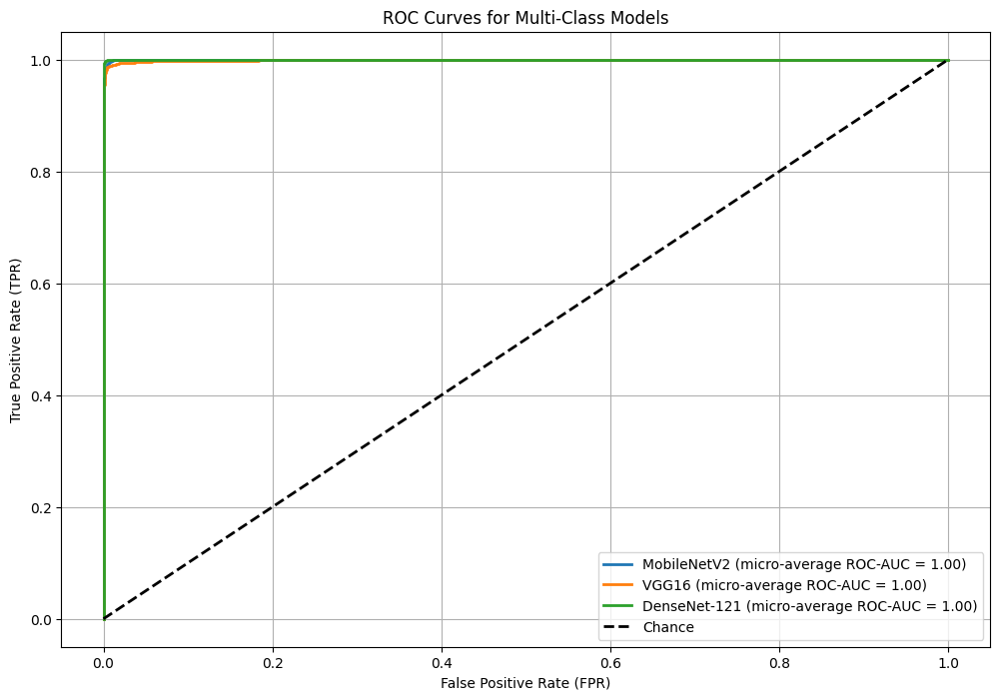

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize

# Extract class names from test generator
class_names = list(test_generator.class_indices.keys())

# Binarize the true labels for ROC computation
y_true_binarized = label_binarize(y_true, classes=range(len(class_names)))

# Initialize a dictionary to store ROC curves for each model
roc_curves = {}

# Define a function to compute ROC and AUC
def compute_roc_auc(y_true_binarized, y_pred_proba, class_names):
    n_classes = len(class_names)
    fpr = {}
    tpr = {}
    roc_auc = {}

    # Compute ROC curve and ROC area for each class
    for i in range(n_classes):
        fpr[i], tpr[i], _ = roc_curve(y_true_binarized[:, i], y_pred_proba[:, i])
        roc_auc[i] = auc(fpr[i], tpr[i])

    # Compute micro-average ROC curve and ROC area
    fpr["micro"], tpr["micro"], _ = roc_curve(y_true_binarized.ravel(), y_pred_proba.ravel())
    roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])

    return fpr, tpr, roc_auc

# Compute ROC and AUC for each model
roc_curves['MobileNetV2'] = compute_roc_auc(y_true_binarized, y_pred_model2, class_names)
roc_curves['VGG16'] = compute_roc_auc(y_true_binarized, y_pred_model4, class_names)
roc_curves['DenseNet-121'] = compute_roc_auc(y_true_binarized, y_pred_model6, class_names)

# Plot ROC curves
plt.figure(figsize=(12, 8))

for model_name, (fpr, tpr, roc_auc) in roc_curves.items():
    # Plot micro-average ROC curve
    plt.plot(fpr["micro"], tpr["micro"],
             label=f"{model_name} (micro-average ROC-AUC = {roc_auc['micro']:.2f})",
             linewidth=2)

    # Optionally plot individual class curves (comment out if too cluttered)
    # for i, class_name in enumerate(class_names):
    #     plt.plot(fpr[i], tpr[i], label=f"{model_name} (class {class_name} ROC-AUC = {roc_auc[i]:.2f})")

# Plot random chance line
plt.plot([0, 1], [0, 1], 'k--', label='Chance', lw=2)

plt.title("ROC Curves for Multi-Class Models")
plt.xlabel("False Positive Rate (FPR)")
plt.ylabel("True Positive Rate (TPR)")
plt.legend(loc="lower right")
plt.grid()
plt.show()


The ROC curve shows how well the three models—MobileNetV2, VGG16, and DenseNet-121—performed on a multi-class classification task. All of them got a micro-average ROC-AUC score of 1.00, which means they’re really good at telling the classes apart. The curves are super close to the top-left corner, showing high true positive rates and low false positive rates. The dashed line represents random guessing, and it’s way below the models’ curves, so the models are definitely doing much better than chance.

# **Refrences**
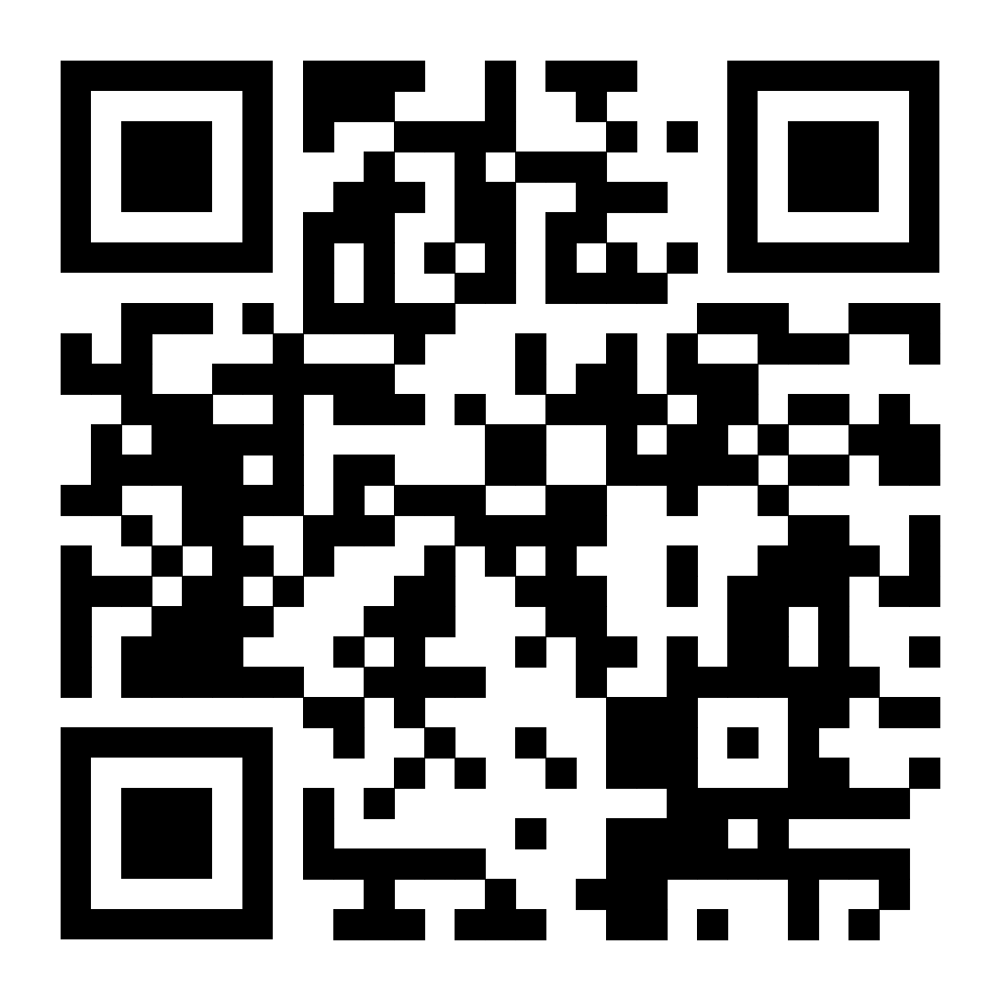